# Correction Phase Shift between the 2 systems measurements

In [138]:
import os, json
import numpy as np
import pandas as pd
from io import StringIO
from scipy.signal import butter, filtfilt

# User Configuration
qtm_dir    = "/Users/afonsoamaral/Desktop/validation/Motions for validation"
xsens_dir  = "/Users/afonsoamaral/Desktop/data/Motions for validation XSens"
mine_dir   = "/Users/afonsoamaral/Desktop/data/Motions for validation Mine"

out_root     = qtm_dir
out_dir_root = os.path.join(out_root, "_aligned_nors")

# Max constant lag to search (seconds)
max_lag_s      = 5.0
# Sliding-lag settings for drift estimation
win_s          = 6.0
hop_s          = 2.0
min_overlap_s  = 5.0

# Preprocessing used ONLY for signatures (not for saved data)
use_highpass       = True
highpass_cutoff_hz = 0.05  # 0.02–0.1 is typical for gait
unwrap_for_signature = True

# Optionally pick specific coordinates for the signature
signature_coords = [
    # e.g. "knee_angle_r","knee_angle_l","hip_flexion_r","hip_flexion_l"
]

# Run these pairs
selected_pairs = [
    ("MINE", "XSENS"),
    ("MINE", "QTM"),
    ("XSENS", "QTM"),
]

os.makedirs(out_dir_root, exist_ok=True)

# Helpers 
def find_trial(folder, base):
    for fn in os.listdir(folder):
        name, ext = os.path.splitext(fn)
        if name == base and ext.lower() in (".sto", ".mot", ""):
            return os.path.join(folder, fn)
    return None

def read_storage(path):
    with open(path, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end+1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    tcol = "time" if "time" in df.columns else ("Time" if "Time" in df.columns else None)
    if tcol is None:
        raise ValueError(f"No time column in {os.path.basename(path)}")
    t = df[tcol].to_numpy(float)
    df = df.drop(columns=[tcol]).reset_index(drop=True)
    keep = np.concatenate(([True], np.diff(t) > 0))
    t, df = t[keep], df.iloc[keep].reset_index(drop=True)
    dt = float(np.median(np.diff(t)))
    return t, df, dt

def butter_highpass(cut, fs, order=2):
    from scipy.signal import butter
    b, a = butter(order, cut/(0.5*fs), btype='highpass')
    return b, a

def unwrap_array(v):
    # heuristically unwrap in degrees vs radians
    v = np.asarray(v, dtype=float)
    spread = np.nanpercentile(v, 95) - np.nanpercentile(v, 5)
    if spread > 6.0:  # likely degrees
        u = np.unwrap(np.deg2rad(v))
        return np.rad2deg(u)
    else:
        return np.unwrap(v)

def prep_for_signature(x, fs):
    xx = x.astype(float).copy()
    if unwrap_for_signature:
        xx = unwrap_array(xx)
    xx = xx - np.nanmean(xx)
    if use_highpass and highpass_cutoff_hz > 0:
        b, a = butter_highpass(highpass_cutoff_hz, fs)
        nmask = ~np.isfinite(xx)
        if nmask.any():
            xx[nmask] = np.interp(np.flatnonzero(nmask),
                                  np.flatnonzero(~nmask), xx[~nmask])
        xx = filtfilt(b, a, xx)
    s = np.nanstd(xx)
    if s == 0 or not np.isfinite(s):
        return np.zeros_like(xx)
    return (xx / s)

def build_signature(df, cols, fs):
    if cols:
        cols = [c for c in cols if c in df.columns]
        if not cols:
            cols = list(df.columns)
    else:
        cols = list(df.columns)
    if not cols:
        return np.zeros(len(df), dtype=float), []
    S = []
    for c in cols:
        S.append(prep_for_signature(df[c].to_numpy(dtype=float), fs))
    sig = np.nanmean(np.vstack(S), axis=0)
    return sig, cols

def ncc_best_lag_subframe(a, b, max_lag_frames):
    a = (a - np.nanmean(a)) / (np.nanstd(a) + 1e-12)
    b = (b - np.nanmean(b)) / (np.nanstd(b) + 1e-12)
    a = np.where(np.isfinite(a), a, np.nanmean(a))
    b = np.where(np.isfinite(b), b, np.nanmean(b))
    n = len(a) + len(b) - 1
    fa = np.fft.rfft(a, n)
    fb = np.fft.rfft(b, n)
    cc = np.fft.irfft(fa * np.conj(fb), n)
    lags = np.arange(-len(b)+1, len(a))
    m = (lags >= -max_lag_frames) & (lags <= max_lag_frames)
    lags = lags[m]; cc = cc[m]
    i = int(np.argmax(cc))
    if 0 < i < len(cc)-1:
        y0, y1, y2 = cc[i-1], cc[i], cc[i+1]
        denom = (2*(y0 - 2*y1 + y2))
        delta = (y0 - y2)/denom if abs(denom) > 1e-12 else 0.0
    else:
        delta = 0.0
    return float(lags[i] + delta), float(cc[i])

def window_indices(n, win, hop):
    i = 0
    while i < n:
        j = min(i+win, n)
        yield i, j
        if j == n: break
        i += hop

def estimate_linear_drift(sigA, sigB, fs, max_lag_frames, win_frames, hop_frames):
    n = min(len(sigA), len(sigB))
    t_frames, lags = [], []
    for i0, i1 in window_indices(n, win_frames, hop_frames):
        a = sigA[i0:i1]; b = sigB[i0:i1]
        if len(a) < 10: continue
        lag_f, _ = ncc_best_lag_subframe(a, b, max_lag_frames)
        t_frames.append((i0 + i1)/2.0); lags.append(lag_f)
    if len(lags) < 3:
        lag_f, _ = ncc_best_lag_subframe(sigA, sigB, max_lag_frames)
        return lag_f, 0.0, np.array([]), np.array([])
    t_frames = np.asarray(t_frames); lags = np.asarray(lags)
    A = np.vstack([np.ones_like(t_frames), t_frames]).T
    sol, _, _, _ = np.linalg.lstsq(A, lags, rcond=None)
    pred = A @ sol
    resid = lags - pred
    mad = np.median(np.abs(resid)) + 1e-9
    keep = np.abs(resid) < 3.5*mad
    A2, y2 = A[keep], lags[keep]
    sol2, _, _, _ = np.linalg.lstsq(A2, y2, rcond=None)
    lag0_frames = sol2[0]
    drift_frames_per_frame = sol2[1]
    return float(lag0_frames), float(drift_frames_per_frame), t_frames, lags

def resample_df_time(df, t_src, t_tgt):
    out = pd.DataFrame(index=range(len(t_tgt)))
    for c in df.columns:
        y = df[c].to_numpy(float)
        out[c] = np.interp(t_tgt, t_src, y)
    return out.reset_index(drop=True)

def apply_timewarp_B_to_A(tA, tB, lag0_frames, drift_frames_per_frame, fs):
    # lag(k) = lag0 + drift*k  (in frames). Map A-time to B-time:
    # kB ~= (1 - drift)*kA - lag0
    scale  = (1.0 - drift_frames_per_frame)
    offset = - (lag0_frames / fs)  # seconds
    tB_warp = offset + scale * tA
    return tB_warp, scale

def save_storage(path, t, df):
    with open(path, "w") as f:
        rate = 1.0/np.median(np.diff(t))
        f.write(f"DataRate={int(round(rate))}\n")
        f.write("DataType=OpenSimTable\n")
        f.write("version=3\n")
        f.write("OpenSimVersion=4.4\n")
        f.write("endheader\n")
        out = pd.DataFrame({"time": t})
        for c in df.columns: out[c] = df[c]
        out.to_csv(f, sep="\t", index=False)

def list_bases(folder):
    s = set()
    for fn in os.listdir(folder):
        if fn.startswith("."): continue
        n, e = os.path.splitext(fn)
        if e.lower() in (".mot", ".sto", ""):
            s.add(n if n else fn)
    return sorted(s)

# System registry
systems = {
    "QTM":   {"dir": qtm_dir},
    "XSENS": {"dir": xsens_dir},
    "MINE":  {"dir": mine_dir}
}

# Core routine 
def align_pair(sysA, sysB):
    assert sysA in systems and sysB in systems and sysA != sysB

    dirA = systems[sysA]["dir"]
    dirB = systems[sysB]["dir"]

    pair_tag = f"{sysA}_vs_{sysB}"
    out_dir = os.path.join(out_dir_root, pair_tag)
    os.makedirs(out_dir, exist_ok=True)

    bases = sorted(set(list_bases(dirA)) & set(list_bases(dirB)))
    print(f"\n=== Aligning pair {sysA} vs {sysB}. Found {len(bases)} matching trials. ===")
    report = {"pair": pair_tag, "cases": {}}

    for base in bases:
        pathA = find_trial(dirA, base)
        pathB = find_trial(dirB, base)
        if not (pathA and pathB):
            print(f"[{base}] missing files; skipped.")
            continue

        try:
            tA, dA, dt_A = read_storage(pathA)
            tB, dB, dt_B = read_storage(pathB)
        except Exception as e:
            print(f"[{base}] read error: {e}")
            continue

        fs = 1.0 / float(np.median([dt_A, dt_B]))
        dt = 1.0/fs
        max_lag_frames     = int(round(max_lag_s     * fs))
        min_overlap_frames = int(round(min_overlap_s * fs))
        win_frames         = max(int(round(win_s*fs)), 20)
        hop_frames         = max(int(round(hop_s*fs)), 5)

        common_cols = sorted(set(dA.columns) & set(dB.columns))
        if not common_cols:
            print(f"[{base}] no common coordinates; skipped.")
            continue

        # Build signatures on PREPARED copies (outputs remain original)
        sig_cols = [c for c in (signature_coords or common_cols) if c in common_cols]
        sigA, used_cols = build_signature(dA[common_cols], sig_cols, fs)
        sigB, _         = build_signature(dB[common_cols], sig_cols, fs)

        # Estimate lag0 + linear drift
        lag0_f, drift_fpf, _, _ = estimate_linear_drift(sigA, sigB, fs, max_lag_frames, win_frames, hop_frames)

        # Time-warp B onto A timeline; resample original (unmodified) B signals
        tB_warp, scale = apply_timewarp_B_to_A(tA, tB, lag0_f, drift_fpf, fs)
        dB_on_A = resample_df_time(dB[common_cols], tB, tB_warp)

        # Keep A as-is; truncate to common length
        n = min(len(tA), len(dB_on_A))
        if n <= min_overlap_frames:
            print(f"[{base}] overlap too small after warp. Skipped.")
            report["cases"][base] = {"systems":[sysA,sysB],"saved":False}
            continue

        t_out  = tA[:n]
        dA_out = dA[common_cols].iloc[:n].reset_index(drop=True)
        dB_out = dB_on_A.iloc[:n].reset_index(drop=True)

        out_A = os.path.join(out_dir, f"{base}_{pair_tag}_{sysA}_aligned.sto")
        out_B = os.path.join(out_dir, f"{base}_{pair_tag}_{sysB}_aligned.sto")
        save_storage(out_A, t_out, dA_out)
        save_storage(out_B, t_out, dB_out)

        drift_ppm = (scale - 1.0) * 1e6  # clock mismatch

        print(f"[{base}] {sysA} vs {sysB}: lag0={lag0_f/fs:+.3f}s, drift≈{drift_ppm:+.0f} ppm → saved.")

        report["cases"][base] = {
            "systems": [sysA, sysB],
            "dt_seconds": float(dt),
            "coordinates_used_for_alignment": used_cols,
            "lag0_seconds": float(lag0_f/fs),
            "drift_frames_per_frame": float(drift_fpf),
            "drift_ppm": float(drift_ppm),
            "saved": True,
            "outputs": { sysA: out_A, sysB: out_B }
        }

    # Reports
    pair_json = os.path.join(out_dir, f"alignment_report_{pair_tag}.json")
    with open(pair_json, "w") as f:
        json.dump(report, f, indent=2)

    pair_txt = os.path.join(out_dir, f"alignment_report_{pair_tag}.txt")
    with open(pair_txt, "w") as f:
        f.write(f"Pair aligned: {sysA} vs {sysB}\n\n")
        for base, info in report["cases"].items():
            f.write(f"Case {base}:\n")
            if not info.get("saved", False):
                f.write("  Skipped.\n\n"); continue
            f.write(f"  Lag0 (s) = {info['lag0_seconds']:+.4f}\n")
            f.write(f"  Drift ≈ {info['drift_ppm']:+.0f} ppm\n")
            f.write(f"  Coordinates used = {', '.join(info['coordinates_used_for_alignment'])}\n")
            f.write(f"  Outputs:\n")
            f.write(f"    {sysA}: {info['outputs'][sysA]}\n")
            f.write(f"    {sysB}: {info['outputs'][sysB]}\n\n")

    print(f"\nSummary for {pair_tag} saved to:\n- {pair_json}\n- {pair_txt}")
    return report, pair_json, pair_txt

# Run all pairs + master report
master = {"pairs": [], "out_root": out_dir_root}
all_pair_jsons, all_pair_txts = [], []

for (sysA, sysB) in selected_pairs:
    rep, jpath, tpath = align_pair(sysA, sysB)
    master["pairs"].append(rep)
    all_pair_jsons.append(jpath); all_pair_txts.append(tpath)

master_json = os.path.join(out_dir_root, "alignment_report_ALL_PAIRS.json")
with open(master_json, "w") as f:
    json.dump(master, f, indent=2)

master_txt = os.path.join(out_dir_root, "alignment_report_ALL_PAIRS.txt")
with open(master_txt, "w") as f:
    f.write("Alignment summary for all pairs\n\n")
    for rep in master["pairs"]:
        f.write(f"- Pair {rep['pair']}:\n")
        n_saved = sum(1 for c in rep["cases"].values() if c.get("saved"))
        n_total = len(rep["cases"])
        f.write(f"  Cases saved: {n_saved}/{n_total}\n")
    f.write("\nPer-pair detailed reports:\n")
    for p in all_pair_txts:
        f.write(f"  {p}\n")

print(f"\nMASTER SUMMARY saved to:\n- {master_json}\n- {master_txt}")



=== Aligning pair MINE vs XSENS. Found 34 matching trials. ===
[S3_M10] MINE vs XSENS: lag0=+0.027s, drift≈-56143 ppm → saved.
[S3_M11] MINE vs XSENS: lag0=-1.783s, drift≈-97161 ppm → saved.
[S3_M3] MINE vs XSENS: lag0=-2.370s, drift≈-21734 ppm → saved.
[S3_M4] MINE vs XSENS: lag0=+2.354s, drift≈+115310 ppm → saved.
[S3_M5] MINE vs XSENS: lag0=+0.512s, drift≈+195750 ppm → saved.
[S3_M6] MINE vs XSENS: lag0=-1.272s, drift≈+48806 ppm → saved.
[S3_M7] MINE vs XSENS: lag0=+0.231s, drift≈-225887 ppm → saved.
[S3_M8] MINE vs XSENS: lag0=+1.608s, drift≈+233238 ppm → saved.
[S3_M9] MINE vs XSENS: lag0=+1.257s, drift≈-56049 ppm → saved.
[S4_M10] MINE vs XSENS: lag0=+3.114s, drift≈+239668 ppm → saved.
[S4_M11] MINE vs XSENS: lag0=-0.869s, drift≈-38175 ppm → saved.
[S4_M3] MINE vs XSENS: lag0=-2.173s, drift≈-19162 ppm → saved.
[S4_M4] MINE vs XSENS: lag0=-3.431s, drift≈-65376 ppm → saved.
[S4_M6] MINE vs XSENS: lag0=-2.971s, drift≈-58324 ppm → saved.
[S4_M7] MINE vs XSENS: lag0=+4.088s, drift≈-1

In [140]:
import os, json
import numpy as np
import pandas as pd
from io import StringIO
from scipy.signal import butter, filtfilt, find_peaks

# ================= USER CONFIG =================
qtm_dir    = "/Users/afonsoamaral/Desktop/validation/Motions for validation"
xsens_dir  = "/Users/afonsoamaral/Desktop/data/Motions for validation XSens"
mine_dir   = "/Users/afonsoamaral/Desktop/data/Motions for validation Mine"

out_root     = qtm_dir
out_dir_root = os.path.join(out_root, "_aligned_nors")

# Only align this pair, and keep QTM as reference timeline
selected_pairs      = [("MINE", "QTM")]
REFERENCE_TIMELINE  = "QTM"   # keep QTM time; warp MINE onto it

# Max constant lag to search (seconds)
max_lag_s      = 5.0
# Sliding-lag settings for drift estimation
win_s          = 6.0
hop_s          = 2.0
min_overlap_s  = 5.0

# Preprocessing used ONLY for signatures (not for saved data)
use_highpass       = True
highpass_cutoff_hz = 0.05
unwrap_for_signature = True

# Optionally pick specific coordinates to drive the alignment (recommended: the joint of interest)
signature_coords = [
    # e.g., "arm_add_r", "hip_adduction_r", "ankle_angle_r"
]

os.makedirs(out_dir_root, exist_ok=True)

# ================= BASIC HELPERS =================
def find_trial(folder, base):
    for fn in os.listdir(folder):
        name, ext = os.path.splitext(fn)
        if name == base and ext.lower() in (".sto", ".mot", ""):
            return os.path.join(folder, fn)
    return None

def read_storage(path):
    with open(path, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end+1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    tcol = "time" if "time" in df.columns else ("Time" if "Time" in df.columns else None)
    if tcol is None:
        raise ValueError(f"No time column in {os.path.basename(path)}")
    t = df[tcol].to_numpy(float)
    df = df.drop(columns=[tcol]).reset_index(drop=True)
    keep = np.concatenate(([True], np.diff(t) > 0))
    t, df = t[keep], df.iloc[keep].reset_index(drop=True)
    dt = float(np.median(np.diff(t)))
    return t, df, dt

def butter_highpass(cut, fs, order=2):
    b, a = butter(order, cut/(0.5*fs), btype='highpass'); return b, a

def unwrap_array(v):
    v = np.asarray(v, dtype=float)
    if (np.nanpercentile(v,95) - np.nanpercentile(v,5)) > 6.0:  # degrees
        return np.rad2deg(np.unwrap(np.deg2rad(v)))
    return np.unwrap(v)

def prep_for_signature(x, fs):
    xx = x.astype(float).copy()
    if unwrap_for_signature: xx = unwrap_array(xx)
    xx = xx - np.nanmean(xx)
    if use_highpass and highpass_cutoff_hz > 0:
        b, a = butter_highpass(highpass_cutoff_hz, fs)
        nmask = ~np.isfinite(xx)
        if nmask.any():
            xx[nmask] = np.interp(np.flatnonzero(nmask),
                                  np.flatnonzero(~nmask), xx[~nmask])
        xx = filtfilt(b, a, xx)
    s = np.nanstd(xx)
    return np.zeros_like(xx) if (s == 0 or not np.isfinite(s)) else (xx / s)

def build_signature(df, cols, fs):
    cols = [c for c in (cols or list(df.columns)) if c in df.columns]
    if not cols: return np.zeros(len(df), dtype=float), []
    S = [prep_for_signature(df[c].to_numpy(float), fs) for c in cols]
    sig = np.nanmean(np.vstack(S), axis=0)
    return sig, cols

def ncc_best_lag_subframe(a, b, max_lag_frames):
    a = (a - np.nanmean(a)) / (np.nanstd(a) + 1e-12)
    b = (b - np.nanmean(b)) / (np.nanstd(b) + 1e-12)
    a = np.where(np.isfinite(a), a, np.nanmean(a))
    b = np.where(np.isfinite(b), b, np.nanmean(b))
    n = len(a) + len(b) - 1
    fa = np.fft.rfft(a, n)
    fb = np.fft.rfft(b, n)
    cc = np.fft.irfft(fa * np.conj(fb), n)
    lags = np.arange(-len(b)+1, len(a))
    m = (lags >= -max_lag_frames) & (lags <= max_lag_frames)
    lags = lags[m]; cc = cc[m]
    i = int(np.argmax(cc))
    if 0 < i < len(cc)-1:
        y0, y1, y2 = cc[i-1], cc[i], cc[i+1]
        denom = 2*(y0 - 2*y1 + y2)
        delta = (y0 - y2)/denom if abs(denom) > 1e-12 else 0.0
    else:
        delta = 0.0
    return float(lags[i] + delta), float(cc[i])

def window_indices(n, win, hop):
    i = 0
    while i < n:
        j = min(i+win, n)
        yield i, j
        if j == n: break
        i += hop

def estimate_linear_drift(sigA, sigB, fs, max_lag_frames, win_frames, hop_frames):
    n = min(len(sigA), len(sigB))
    t_frames, lags = [], []
    for i0, i1 in window_indices(n, win_frames, hop_frames):
        a = sigA[i0:i1]; b = sigB[i0:i1]
        if len(a) < 10: continue
        lag_f, _ = ncc_best_lag_subframe(a, b, max_lag_frames)
        t_frames.append((i0 + i1)/2.0); lags.append(lag_f)
    if len(lags) < 3:
        lag_f, _ = ncc_best_lag_subframe(sigA, sigB, max_lag_frames)
        return lag_f, 0.0, np.array([]), np.array([])
    t_frames = np.asarray(t_frames); lags = np.asarray(lags)
    A = np.vstack([np.ones_like(t_frames), t_frames]).T
    sol, _, _, _ = np.linalg.lstsq(A, lags, rcond=None)
    pred = A @ sol
    resid = lags - pred
    mad = np.median(np.abs(resid)) + 1e-9
    keep = np.abs(resid) < 3.5*mad
    A2, y2 = A[keep], lags[keep]
    sol2, _, _, _ = np.linalg.lstsq(A2, y2, rcond=None)
    lag0_frames = sol2[0]
    drift_frames_per_frame = sol2[1]
    return float(lag0_frames), float(drift_frames_per_frame), t_frames, lags

def resample_df_time(df, t_src, t_tgt):
    out = pd.DataFrame(index=range(len(t_tgt)))
    for c in df.columns:
        y = df[c].to_numpy(float)
        out[c] = np.interp(t_tgt, t_src, y)
    return out.reset_index(drop=True)

def save_storage(path, t, df):
    with open(path, "w") as f:
        rate = 1.0/np.median(np.diff(t))
        f.write(f"DataRate={int(round(rate))}\n")
        f.write("DataType=OpenSimTable\n")
        f.write("version=3\n")
        f.write("OpenSimVersion=4.4\n")
        f.write("endheader\n")
        out = pd.DataFrame({"time": t})
        for c in df.columns: out[c] = df[c]
        out.to_csv(f, sep="\t", index=False)

def list_bases(folder):
    s = set()
    for fn in os.listdir(folder):
        if fn.startswith("."): continue
        n, e = os.path.splitext(fn)
        if e.lower() in (".mot", ".sto", ""):
            s.add(n if n else fn)
    return sorted(s)

# ================= DTW + PEAK-ANCHOR REFINEMENT =================
import numpy as _np
from scipy.spatial.distance import cdist as _cdist

def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return _np.hanning(n)

def _smooth1d(x, win):
    if win <= 1: return _np.asarray(x, float).copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    x = _np.asarray(x, float)
    xpad = _np.pad(x, (pad, pad), mode='reflect')
    return _np.convolve(xpad, w, mode='valid')

def _z(x):
    x = _np.asarray(x, float)
    m = _np.nanmean(x); s = _np.nanstd(x)
    return (x - m) / (s if s > 0 else 1.0)

def _build_cost_matrix(x, y, mode="swdtw", smooth_win=21, alpha=0.5):
    x = _np.asarray(x, float); y = _np.asarray(y, float)
    if mode == "euclidean":
        return _cdist(x.reshape(-1,1), y.reshape(-1,1), metric="euclidean")
    xs = _smooth1d(x, smooth_win); ys = _smooth1d(y, smooth_win)
    dxs = _np.diff(xs, prepend=xs[0]); dys = _np.diff(ys, prepend=ys[0])
    A = (xs[:, None]  - ys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2
    return alpha*A + (1.0 - alpha)*B

def _dtw_windowed(x, y, band_ratio=0.10, hv_penalty=0.05,
                  cost_mode="swdtw", smooth_win=21, alpha=0.5):
    x = _np.asarray(x, float); y = _np.asarray(y, float)
    n, m = len(x), len(y)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win, alpha=alpha)
    band = int(_np.ceil(band_ratio * max(n, m)))
    INF = _np.inf
    M = _np.full((n, m), INF, float)
    A = _np.full((n, m), INF, float)
    for i in range(n):
        jc = int(round((i * (m-1)) / max(1, (n-1))))
        j0 = max(0, jc - band); j1 = min(m-1, jc + band)
        M[i, j0:j1+1] = D[i, j0:j1+1]
    if _np.isfinite(M[0,0]): A[0,0] = M[0,0]
    for i in range(1, n):
        if _np.isfinite(M[i,0]): A[i,0] = A[i-1,0] + M[i,0]*(1.0 + hv_penalty)
    for j in range(1, m):
        if _np.isfinite(M[0,j]): A[0,j] = A[0,j-1] + M[0,j]*(1.0 + hv_penalty)
    for i in range(1, n):
        jc = int(round((i * (m-1)) / max(1, (n-1))))
        j0 = max(1, jc - band); j1 = min(m-1, jc + band)
        for j in range(j0, j1+1):
            if not _np.isfinite(M[i,j]): continue
            d = M[i,j]
            A[i,j] = min(A[i-1,j-1] + d, A[i-1,j] + d*(1.0 + hv_penalty), A[i,j-1] + d*(1.0 + hv_penalty))
    i, j = n-1, m-1
    if not _np.isfinite(A[i,j]):
        cand = _np.argwhere(_np.isfinite(A))
        if cand.size == 0: return A, []
        i, j = cand[_np.argmin(A[cand[:,0], cand[:,1]])]
    path = [(i,j)]
    while (i > 0) or (j > 0):
        choices = []
        if i>0 and j>0: choices.append((A[i-1,j-1], i-1, j-1))
        if i>0:         choices.append((A[i-1,j],   i-1, j))
        if j>0:         choices.append((A[i,  j-1], i,   j-1))
        _, i, j = min(choices, key=lambda t: t[0])
        path.append((i,j))
    path.reverse()
    return A, path

def _landmarks_from_signal(x, min_separation=10, prominence=0.5):
    """Peaks + valleys on a z-scored signal."""
    xz = _z(x)
    pks, _ = find_peaks(xz, distance=min_separation, prominence=prominence)
    vls, _ = find_peaks(-xz, distance=min_separation, prominence=prominence)
    idx = _np.unique(_np.sort(_np.concatenate([pks, vls])))
    return idx

def refine_time_map_with_dtw(tA, tB, sigA, sigB, tB_linear,
                             band_ratio=0.10, smooth_win=31, alpha=0.5, hv_penalty=0.05):
    sigB_on_A = _np.interp(tB_linear, tB, sigB)
    x = _z(_smooth1d(sigA, smooth_win))
    y = _z(_smooth1d(sigB_on_A, smooth_win))
    _, path = _dtw_windowed(x, y, band_ratio=band_ratio, hv_penalty=hv_penalty,
                            cost_mode="swdtw", smooth_win=smooth_win, alpha=alpha)
    if not path:
        return _np.clip(tB_linear, tB[0], tB[-1])
    n = len(tA)
    js_per_i = [[] for _ in range(n)]
    for i, j in path:
        if 0 <= i < n: js_per_i[i].append(j)
    tB_refined = _np.full(n, _np.nan, float)
    for i in range(n):
        if js_per_i[i]:
            jj = _np.array(js_per_i[i], float)
            jj = _np.clip(jj, 0, n-1).astype(int)
            tB_refined[i] = float(_np.mean(tB_linear[jj]))
    idx = _np.arange(n); good = _np.isfinite(tB_refined)
    if not good.any(): return _np.clip(tB_linear, tB[0], tB[-1])
    if not good.all(): tB_refined = _np.interp(idx, idx[good], tB_refined[good])
    tB_refined = _np.maximum.accumulate(tB_refined)
    return _np.clip(tB_refined, tB[0], tB[-1])

def refine_time_map_with_dtw_peak_anchors(tA, tB, sigA, sigB, tB_linear,
                                          band_ratio=0.10, smooth_win=31, alpha=0.5, hv_penalty=0.05):
    """
    Build a refined map that goes exactly through matched peak/valley anchors
    (so peaks land on the same samples).
    """
    sigB_on_A = _np.interp(tB_linear, tB, sigB)
    x = _z(_smooth1d(sigA, smooth_win))
    y = _z(_smooth1d(sigB_on_A, smooth_win))
    _, path = _dtw_windowed(x, y, band_ratio=band_ratio, hv_penalty=hv_penalty,
                            cost_mode="swdtw", smooth_win=smooth_win, alpha=alpha)
    n = len(tA)
    if not path:
        return refine_time_map_with_dtw(tA, tB, sigA, sigB, tB_linear,
                                        band_ratio, smooth_win, alpha, hv_penalty)

    # landmarks on reference (x) only; DTW gives matched j's
    min_sep = max(5, n // 100)
    anchors_i = _landmarks_from_signal(x, min_separation=min_sep, prominence=0.5)
    if len(anchors_i) < 3:
        # fallback: dense DTW map
        return refine_time_map_with_dtw(tA, tB, sigA, sigB, tB_linear,
                                        band_ratio, smooth_win, alpha, hv_penalty)

    # collect matched js for each anchor i
    js_per_i = [[] for _ in range(n)]
    for i, j in path:
        if 0 <= i < n: js_per_i[i].append(j)
    a_ref = []
    b_time = []
    for i in anchors_i:
        if js_per_i[i]:
            jj = _np.array(js_per_i[i], float)
            jj = _np.clip(jj, 0, n-1).astype(int)
            a_ref.append(tA[i])
            b_time.append(float(_np.mean(tB_linear[jj])))
    # always include endpoints to keep mapping well-posed
    if not a_ref or a_ref[0] > tA[0]:
        a_ref = [tA[0]] + a_ref
        b_time = [tB_linear[0]] + b_time
    if a_ref[-1] < tA[-1]:
        a_ref.append(tA[-1]); b_time.append(tB_linear[-1])

    a_ref = _np.array(a_ref); b_time = _np.array(b_time)
    # enforce monotonicity on anchors
    b_time = _np.maximum.accumulate(b_time)
    # interpolate a full map through the anchors
    tB_refined = _np.interp(tA, a_ref, b_time)
    tB_refined = _np.maximum.accumulate(tB_refined)
    return _np.clip(tB_refined, tB[0], tB[-1])

# ================= SYSTEM REGISTRY =================
systems = {"QTM": {"dir": qtm_dir}, "XSENS": {"dir": xsens_dir}, "MINE": {"dir": mine_dir}}

# ================= CORE ALIGNER =================
def align_pair(sysA, sysB):
    assert sysA in systems and sysB in systems and sysA != sysB
    dirA = systems[sysA]["dir"]; dirB = systems[sysB]["dir"]
    pair_tag = f"{sysA}_vs_{sysB}"              # keep naming: MINE_vs_QTM
    out_dir = os.path.join(out_dir_root, pair_tag); os.makedirs(out_dir, exist_ok=True)

    bases = sorted(set(list_bases(dirA)) & set(list_bases(dirB)))
    print(f"\n=== Aligning pair {sysA} vs {sysB}. Found {len(bases)} matching trials. ===")
    report = {"pair": pair_tag, "cases": {}}

    for base in bases:
        pathA = find_trial(dirA, base); pathB = find_trial(dirB, base)
        if not (pathA and pathB):
            print(f"[{base}] missing files; skipped."); continue

        try:
            tA, dA, dt_A = read_storage(pathA)
            tB, dB, dt_B = read_storage(pathB)
        except Exception as e:
            print(f"[{base}] read error: {e}"); continue

        fs = 1.0 / float(np.median([dt_A, dt_B]))
        dt = 1.0/fs
        max_lag_frames     = int(round(max_lag_s     * fs))
        min_overlap_frames = int(round(min_overlap_s * fs))
        win_frames         = max(int(round(win_s*fs)), 20)
        hop_frames         = max(int(round(hop_s*fs)), 5)

        # Intersection of coordinates only
        common_cols = sorted(set(dA.columns) & set(dB.columns))
        if not common_cols:
            print(f"[{base}] no common coordinates; skipped.")
            continue
        sig_cols = [c for c in (signature_coords or common_cols) if c in common_cols]

        # Choose reference system/time: keep QTM time, warp MINE
        if REFERENCE_TIMELINE.upper() == "QTM":
            ref_name, mov_name = "QTM", "MINE"
            t_ref, d_ref = (tB, dB); t_mov, d_mov = (tA, dA)
        else:
            ref_name, mov_name = "MINE", "QTM"
            t_ref, d_ref = (tA, dA); t_mov, d_mov = (tB, dB)

        # Build signatures (preprocessed) for ref/mov
        sig_ref, used_cols = build_signature(d_ref[common_cols], sig_cols, fs)
        sig_mov, _         = build_signature(d_mov[common_cols], sig_cols, fs)

        # Coarse lag + drift on signatures
        lag0_f, drift_fpf, _, _ = estimate_linear_drift(sig_ref, sig_mov, fs, max_lag_frames, win_frames, hop_frames)

        # Map 'mov' onto 'ref' with linear model
        scale  = (1.0 - drift_fpf)
        offset = - (lag0_f / fs)
        t_mov_linear = offset + scale * t_ref  # mov time predicted at each ref-sample

        # Nonlinear refinement that forces peak/valley anchors to coincide
        t_mov_refined = refine_time_map_with_dtw_peak_anchors(
            tA=t_ref, tB=t_mov, sigA=sig_ref, sigB=sig_mov,
            tB_linear=t_mov_linear, band_ratio=0.10, smooth_win=31, alpha=0.5, hv_penalty=0.05
        )

        # Resample 'mov' data using refined map; keep 'ref' as-is
        d_mov_on_ref = resample_df_time(d_mov[common_cols], t_mov, t_mov_refined)
        n = min(len(t_ref), len(d_mov_on_ref))
        if n <= min_overlap_frames:
            print(f"[{base}] overlap too small after warp. Skipped.")
            report["cases"][base] = {"systems":[sysA,sysB],"saved":False}
            continue

        t_out  = t_ref[:n]
        d_ref_ = d_ref[common_cols].iloc[:n].reset_index(drop=True)
        d_mov_ = d_mov_on_ref.iloc[:n].reset_index(drop=True)

        # Save following the original tag "MINE_vs_QTM": QTM is reference, MINE is warped
        if ref_name == "QTM":
            d_qtm_out, d_mine_out = d_ref_, d_mov_
        else:
            d_qtm_out, d_mine_out = d_mov_, d_ref_

        out_mine = os.path.join(out_dir, f"{base}_{pair_tag}_MINE_aligned.sto")
        out_qtm  = os.path.join(out_dir, f"{base}_{pair_tag}_QTM_aligned.sto")
        save_storage(out_mine, t_out, d_mine_out)
        save_storage(out_qtm,  t_out, d_qtm_out)

        print(f"[{base}] MINE→QTM: lag0={lag0_f/fs:+.3f}s, drift≈{(scale-1.0)*1e6:+.0f} ppm, "
              f"DTW peak-anchored refinement applied → saved.")

        report["cases"][base] = {
            "systems": ["MINE","QTM"],
            "reference_timeline": ref_name,
            "dt_seconds": float(dt),
            "coordinates_used_for_alignment": used_cols,
            "lag0_seconds": float(lag0_f/fs),
            "drift_frames_per_frame": float(drift_fpf),
            "drift_ppm": float((scale-1.0)*1e6),
            "saved": True,
            "outputs": {"MINE": out_mine, "QTM": out_qtm}
        }

    pair_json = os.path.join(out_dir, f"alignment_report_{pair_tag}.json")
    with open(pair_json, "w") as f: json.dump(report, f, indent=2)
    pair_txt = os.path.join(out_dir, f"alignment_report_{pair_tag}.txt")
    with open(pair_txt, "w") as f:
        f.write(f"Pair aligned: {sysA} vs {sysB}\n\n")
        for base, info in report["cases"].items():
            f.write(f"Case {base}:\n")
            if not info.get("saved", False): f.write("  Skipped.\n\n"); continue
            f.write(f"  Reference timeline: {info['reference_timeline']}\n")
            f.write(f"  Lag0 (s) = {info['lag0_seconds']:+.4f}\n")
            f.write(f"  Drift ≈ {info['drift_ppm']:+.0f} ppm\n")
            f.write(f"  Coordinates used = {', '.join(info['coordinates_used_for_alignment'])}\n")
            f.write(f"  Outputs:\n")
            f.write(f"    MINE: {info['outputs']['MINE']}\n")
            f.write(f"    QTM : {info['outputs']['QTM']}\n\n")

    print(f"\nSummary for {pair_tag} saved to:\n- {pair_json}\n- {pair_txt}")
    return report, pair_json, pair_txt

# ================= RUN =================
def list_bases(folder):
    s = set()
    for fn in os.listdir(folder):
        if fn.startswith("."): continue
        n, e = os.path.splitext(fn)
        if e.lower() in (".mot", ".sto", ""): s.add(n if n else fn)
    return sorted(s)

master = {"pairs": [], "out_root": out_dir_root}
all_pair_jsons, all_pair_txts = [], []
for (sysA, sysB) in selected_pairs:
    rep, jpath, tpath = align_pair(sysA, sysB)
    master["pairs"].append(rep)
    all_pair_jsons.append(jpath); all_pair_txts.append(tpath)

master_json = os.path.join(out_dir_root, "alignment_report_ALL_PAIRS.json")
with open(master_json, "w") as f: json.dump(master, f, indent=2)
master_txt = os.path.join(out_dir_root, "alignment_report_ALL_PAIRS.txt")
with open(master_txt, "w") as f:
    f.write("Alignment summary for all pairs\n\n")
    for rep in master["pairs"]:
        f.write(f"- Pair {rep['pair']}:\n")
        n_saved = sum(1 for c in rep["cases"].values() if c.get("saved"))
        n_total = len(rep["cases"])
        f.write(f"  Cases saved: {n_saved}/{n_total}\n")
    f.write("\nPer-pair detailed reports:\n")
    for p in all_pair_txts:
        f.write(f"  {p}\n")

print(f"\nMASTER SUMMARY saved to:\n- {master_json}\n- {master_txt}")



=== Aligning pair MINE vs QTM. Found 34 matching trials. ===
[S3_M10] MINE→QTM: lag0=+0.671s, drift≈+75422 ppm, DTW peak-anchored refinement applied → saved.
[S3_M11] MINE→QTM: lag0=+1.045s, drift≈+245162 ppm, DTW peak-anchored refinement applied → saved.
[S3_M3] MINE→QTM: lag0=+1.718s, drift≈-24913 ppm, DTW peak-anchored refinement applied → saved.
[S3_M4] MINE→QTM: lag0=-1.363s, drift≈-48308 ppm, DTW peak-anchored refinement applied → saved.
[S3_M5] MINE→QTM: lag0=-4.686s, drift≈-174009 ppm, DTW peak-anchored refinement applied → saved.
[S3_M6] MINE→QTM: lag0=+1.706s, drift≈+242117 ppm, DTW peak-anchored refinement applied → saved.
[S3_M7] MINE→QTM: lag0=+4.516s, drift≈+32283 ppm, DTW peak-anchored refinement applied → saved.
[S3_M8] MINE→QTM: lag0=-2.859s, drift≈-222110 ppm, DTW peak-anchored refinement applied → saved.
[S3_M9] MINE→QTM: lag0=-1.246s, drift≈-13951 ppm, DTW peak-anchored refinement applied → saved.
[S4_M10] MINE→QTM: lag0=-3.085s, drift≈-44667 ppm, DTW peak-anchored

## Validation through Dynamic Time Warping (DTW) & TAM measurement

In [2]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from scipy.spatial.distance import cdist

# User Configuration
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

# Choose "single" or "batch"
mode = "single"            # "single" or "batch"

# If SINGLE: pick the trial and the pair you want to validate
single_subject   = 6
single_movement  = 6
single_base      = None       # e.g., "S4_M10" (overrides subject/movement if set)
single_pair      = ("MINE","QTM")   # ("MINE","XSENS"), ("MINE","QTM"), ("XSENS","QTM")

# If BATCH: define subjects, movements, and which pairs to run
subjects    = [3]                 # or "all"
movements   = [3]                 # or "all"
selected_pairs = [
    ("MINE",  "XSENS"),
    ("MINE",  "QTM"),
    ("XSENS", "QTM"),
]

do_plots         = True
save_plots       = False  # save to _plots/<PAIR>/<trial>/
combined_csv     = os.path.join(aligned_root, "DTW_TAM_results_ALL.csv")
per_pair_csv_dir = os.path.join(aligned_root, "_dtw_pair_csvs")

# DTW / TAM options
band_ratio       = 0.10
try_derivative   = True
tam_high_thresh  = 1.5

# Cost model & parameters
#   "euclidean" -> classic point cost (as before)
#   "swdtw"     -> smoothed amplitude + derivative cost (fast SW-like), reduces singularities
cost_mode        = "swdtw"         # "euclidean" or "swdtw"
smooth_win       = 21              # odd; samples for smoothing (only used in "swdtw")
alpha_mix        = 0.5             # 0..1 blend of amp vs derivative cost ("swdtw")
hv_penalty       = 0.10            # extra penalty for horizontal/vertical steps (encourage diagonal)

plt.rcParams["figure.figsize"] = (8, 4)

# Helpers
def load_storage(fp):
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end + 1) if hdr_end is not None else 0
    import pandas as _pd
    df = _pd.read_csv(StringIO("".join(lines[start:])),
                      sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        pass
    elif "Time" in df.columns:
        df.rename(columns={"Time": "time"}, inplace=True)
    else:
        raise ValueError(f"No time column found in {os.path.basename(fp)}")
    return df

def zscore(x):
    x = np.asarray(x, float)
    m = np.nanmean(x); s = np.nanstd(x)
    return (x - m) / (s if s > 0 else 1.0)

def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')

def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    """
    Return local cost matrix D (n x m).

    - mode="euclidean":
        * use_derivative=False -> classic |x_i - y_j|
        * use_derivative=True  -> derivative distance |dx_i - dy_j| (dx via np.diff with prepend)

    - mode="swdtw":
        Smoothed amplitude + derivative cost:
            alpha*|x_s - y_s|^2 + (1-alpha)*|dx_s - dy_s|^2
        (use_derivative flag is ignored here, since derivative is already blended in.)
    """
    x = np.asarray(x, float); y = np.asarray(y, float)

    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0])
            ys = np.diff(y, prepend=y[0])
            return cdist(xs.reshape(-1, 1), ys.reshape(-1, 1), metric="euclidean")
        else:
            return cdist(x.reshape(-1, 1), y.reshape(-1, 1), metric="euclidean")

    # "swdtw": smooth signals, then combine amplitude + derivative costs
    xs = _smooth1d(x, smooth_win)
    ys = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])
    A = (xs[:, None]  - ys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2
    return alpha*A + (1.0 - alpha)*B

def tam_from_path(path, N, M):
    """
    TAM = (advance/N) + (delay/M) + (1 - phase/min(N,M)), with an off-by-one
    correction so that a perfect diagonal (equal-length) yields 0.
    """
    adv = delay = phase = 0
    for (i0,j0),(i1,j1) in zip(path[:-1], path[1:]):
        di, dj = i1 - i0, j1 - j0
        if   di == 1 and dj == 0: adv   += 1   # horizontal step
        elif di == 0 and dj == 1: delay += 1   # vertical step
        elif di == 1 and dj == 1: phase += 1   # diagonal step
    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)

def ensure_dir(p):
    os.makedirs(p, exist_ok=True); return p

# Band-view plot that fills the panel with gray out-of-band 
def plot_accumulated_cost_matrix(acc, path, joint, subj, mov, sysA, sysB,
                                 outdir=None, band_ratio=None):
    # Mask out-of-band (inf) as NaN so the colormap can show a neutral color there
    M = np.where(np.isfinite(acc), acc, np.nan)

    # Use a copy of viridis and set NaNs to light gray so the axes are fully filled
    cmap = plt.cm.viridis.copy()
    cmap.set_bad(color="#e6e6e6")

    # Robust color limits from the finite region only
    vmin = np.nanpercentile(M, 2)
    vmax = np.nanpercentile(M, 98)

    plt.figure(figsize=(6,6))
    im = plt.imshow(M.T, origin='lower', aspect='auto', cmap=cmap, vmin=vmin, vmax=vmax)

    # Overlay optimal path
    px, py = zip(*path)
    plt.plot(px, py, color='white', linewidth=1.5)

    # (Optional) show band boundaries for clarity
    if band_ratio is not None:
        n, m = acc.shape
        band = int(max(n, m) * band_ratio)
        i = np.arange(n)
        lo = np.clip(i - band, 0, m-1)
        hi = np.clip(i + band, 0, m-1)
        plt.plot(i, lo, 'w--', lw=0.8)
        plt.plot(i, hi, 'w--', lw=0.8)

    plt.title(f"S{subj} M{mov} – {joint} – Accumulated Cost ({sysA} vs {sysB})")
    plt.xlabel(f"{sysA} index"); plt.ylabel(f"{sysB} index")
    cb = plt.colorbar(im); cb.set_label("Accumulated cost")

    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_ACC.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_alignment(x, y, path, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(10,4))
    plt.plot(x, label=sysA); plt.plot(y, label=sysB)
    step = max(1, len(path)//50)
    for (i, j) in path[::step]:
        plt.plot([i, j], [x[i], y[j]], color='gray', linewidth=0.5)
    plt.title(f"S{subj} M{mov} – {joint} – Alignment Path ({sysA} vs {sysB})")
    plt.xlabel("Index"); plt.legend(); plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_PATH.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

# Path resolver & discovery (pair subfolders + legacy)
def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B
    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B
    return None, None

def discover_trials(root, sysA, sysB, subjects_filter=None, movements_filter=None):
    trials = set()
    pd_ = pair_dir(root, sysA, sysB)
    if os.path.isdir(pd_):
        pat = re.compile(rf"^S(\d+)_M(\d+)_({re.escape(sysA)})_vs_({re.escape(sysB)})_({re.escape(sysA)}|{re.escape(sysB)})_aligned\.sto$")
        by_base = {}
        for fn in os.listdir(pd_):
            m = pat.match(fn)
            if not m: 
                continue
            s = int(m.group(1)); mv = int(m.group(2))
            base = f"S{s}_M{mv}"
            by_base.setdefault(base, set()).add(m.group(5))
        for base, have in by_base.items():
            if {sysA, sysB}.issubset(have):
                s = int(base.split("_")[0][1:]); mv = int(base.split("_")[1][1:])
                if subjects_filter not in (None, "all") and s not in subjects_filter: 
                    continue
                if movements_filter not in (None, "all") and mv not in movements_filter: 
                    continue
                trials.add((s, mv))
    pat_legacy = re.compile(r"^S(\d+)_M(\d+)_([A-Z]+)_aligned\.sto$")
    have = {}
    for fn in os.listdir(root):
        m = pat_legacy.match(fn)
        if not m: 
            continue
        s = int(m.group(1)); mv = int(m.group(2)); sy = m.group(3)
        have.setdefault((s, mv), set()).add(sy)
    for (s, mv), sysset in have.items():
        if sysA in sysset and sysB in sysset:
            if subjects_filter not in (None, "all") and s not in subjects_filter: 
                continue
            if movements_filter not in (None, "all") and mv not in movements_filter: 
                continue
            trials.add((s, mv))
    return sorted(trials)

# Core per-case (pair-aware)
def run_case(s, m, sysA, sysB, rows):
    base = f"S{s}_M{m}"
    fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
    if not (fpA and fpB):
        print(f"Missing aligned files for {base} {sysA} vs {sysB}")
        return

    dfA = load_storage(fpA)
    dfB = load_storage(fpB)

    if not np.array_equal(dfA["time"], dfB["time"]):
        common = np.intersect1d(dfA["time"], dfB["time"])
        dfA = dfA.set_index("time").loc[common].reset_index()
        dfB = dfB.set_index("time").loc[common].reset_index()

    # -----------------------------------------
    # Only evaluate the coordinates you selected
    # -----------------------------------------
    joints = [j for j in target_coordinates if j in dfA.columns and j in dfB.columns]

    if not joints:
        print(f"⚠️ No target joints found for S{s} M{m} {sysA} vs {sysB}")
        return

    plot_outdir = os.path.join(aligned_root, "_plots", f"{sysA}_vs_{sysB}", base)

    for j in joints:
        # z-score & trim to shared valid region
        x0 = zscore(dfA[j].to_numpy(float))
        y0 = zscore(dfB[j].to_numpy(float))
        valid = np.isfinite(x0) & np.isfinite(y0)
        if valid.sum() < 5:
            continue
        i0 = np.argmax(valid)
        i1 = len(valid) - np.argmax(valid[::-1])
        xw = x0[i0:i1]; yw = y0[i0:i1]
        if len(xw) < 5 or len(yw) < 5:
            continue

        # DTW (choose cost mode)
        acc, path = compute_dtw_windowed(
            xw, yw,
            band_ratio=band_ratio,
            use_derivative=False,
            cost_mode=cost_mode,
            smooth_win=smooth_win,
            alpha=alpha_mix,
            hv_penalty=hv_penalty
        )
        tam = tam_from_path(path, len(xw), len(yw))

        # optional derivative-DTW fallback (same cost mode)
        used_derivative = False
        if try_derivative and tam > tam_high_thresh:
            accd, pathd = compute_dtw_windowed(
                xw, yw,
                band_ratio=band_ratio,
                use_derivative=True,
                cost_mode=cost_mode,
                smooth_win=smooth_win,
                alpha=alpha_mix,
                hv_penalty=hv_penalty
            )
            tamd = tam_from_path(pathd, len(xw), len(yw))
            if tamd < tam:
                tam, acc, path = tamd, accd, pathd
                used_derivative = True

        rows.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject, "Movement": movement, "Joint": j,
            "N_A": len(xw), "N_B": len(yw),
            "TAM_article": tam,
            "Used_derivative_DTW": bool(used_derivative),
        })

        if do_plots:
            plot_accumulated_cost_matrix(
                acc, path, j, subject, movement, sysA, sysB,
                outdir=(plot_outdir if save_plots else None),
                band_ratio=band_ratio
            )
            plot_alignment(
                xw, yw, path, j, subject, movement, sysA, sysB,
                outdir=(plot_outdir if save_plots else None)
            )

# Run (single or batch)
all_rows = []
if mode.lower() == "single":
    if single_base:
        try:
            s = int(single_base.split("_")[0][1:])
            m = int(single_base.split("_")[1][1:])
        except Exception:
            raise ValueError("single_base must look like 'S4_M10'")
    else:
        s, m = single_subject, single_movement
    sysA, sysB = single_pair
    run_case(s, m, sysA, sysB, all_rows)
else:
    for (sysA, sysB) in selected_pairs:
        if subjects == "all" or movements == "all":
            trials = discover_trials(
                aligned_root, sysA, sysB,
                subjects_filter=(None if subjects=="all" else set(subjects)),
                movements_filter=(None if movements=="all" else set(movements)),
            )
        else:
            trials = [(sv, mv) for sv in subjects for mv in movements]
        if not trials:
            print(f"No trials found for {sysA} vs {sysB} with given filters.")
            continue
        for (s, m) in trials:
            run_case(s, m, sysA, sysB, all_rows)

# Results
res_df = pd.DataFrame(all_rows)
if res_df.empty:
    print("No DTW/TAM results produced. Check aligned files and joint names.")
else:
    res_df.sort_values(["Pair","Subject","Movement","Joint"], inplace=True)
    res_df.to_csv(combined_csv, index=False)
    print(f"Computed DTW & TAM for {len(res_df)} joint signals.")
    print(f"Saved combined results to: {combined_csv}")

    os.makedirs(per_pair_csv_dir, exist_ok=True)
    for pair, subdf in res_df.groupby("Pair"):
        pair_csv = os.path.join(per_pair_csv_dir, f"DTW_TAM_results_{pair}.csv")
        subdf.to_csv(pair_csv, index=False)
        print(f"  Per-pair CSV: {pair_csv}")

    cols = ["Pair","Subject","Movement","Joint","TAM_article","N_A","N_B","Used_derivative_DTW"]
    print(res_df[cols].head(20).to_string(index=False))


NameError: name 'target_coordinates' is not defined

Missing aligned files for S1_M5 MINE vs QTM
Missing aligned files for S2_M5 MINE vs QTM


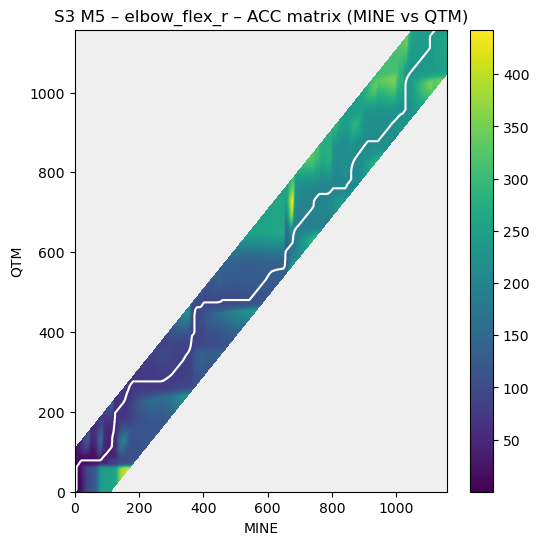

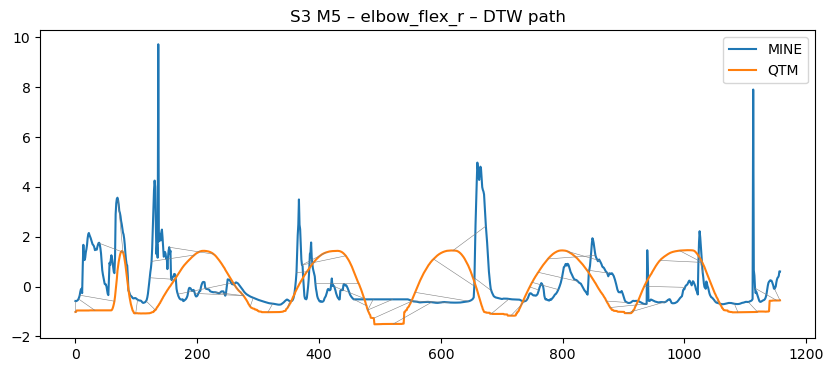

Missing aligned files for S4_M5 MINE vs QTM


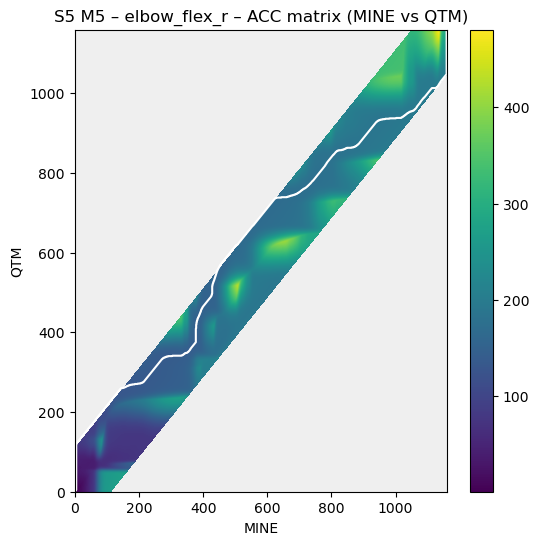

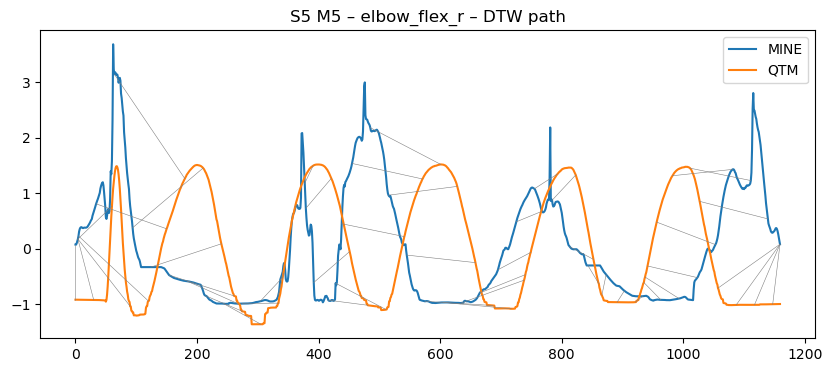

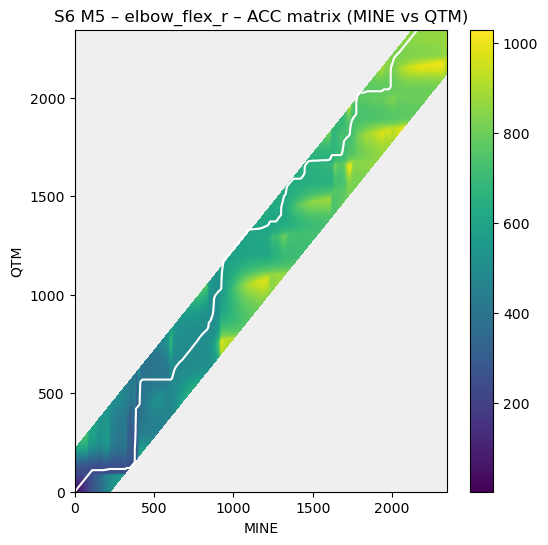

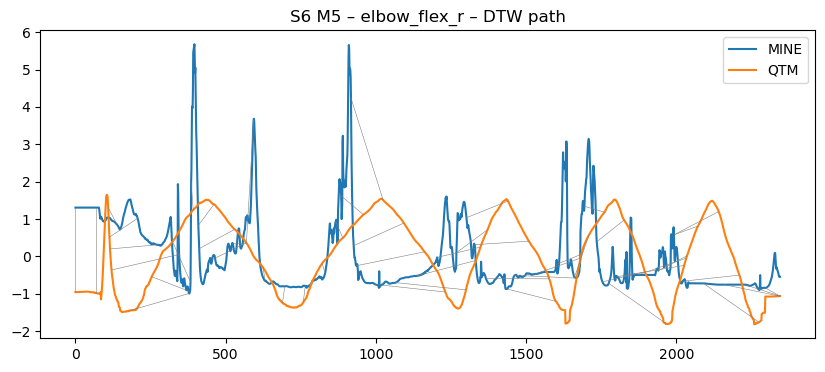

Missing aligned files for S1_M5 XSENS vs QTM
Missing aligned files for S2_M5 XSENS vs QTM


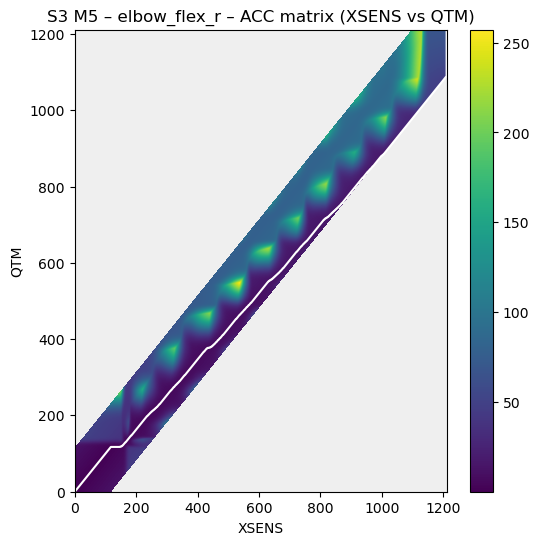

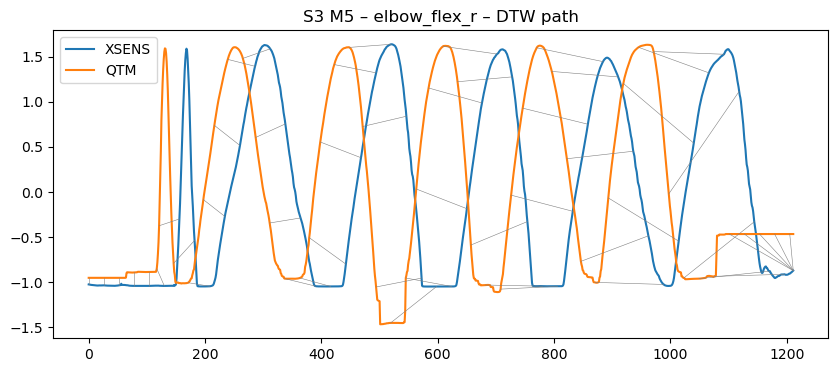

Missing aligned files for S4_M5 XSENS vs QTM


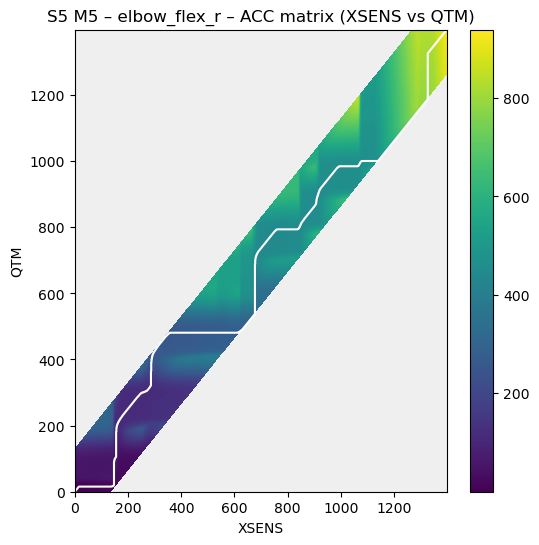

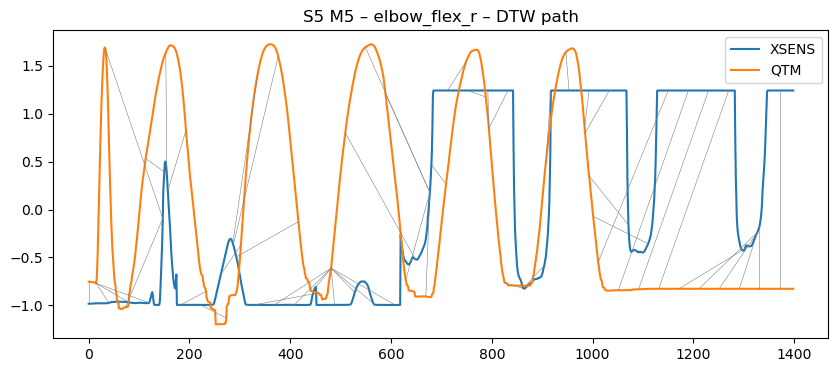

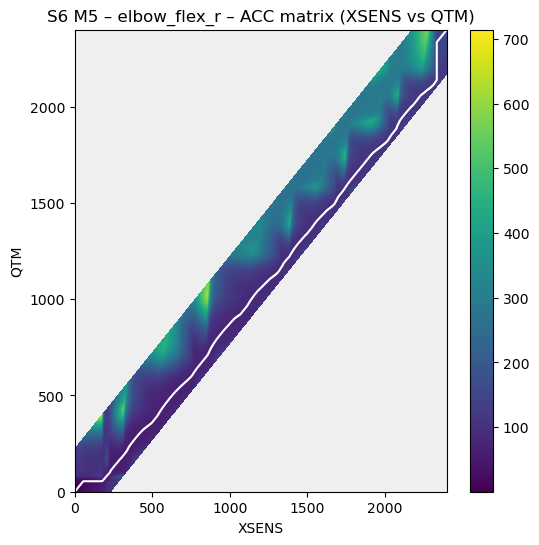

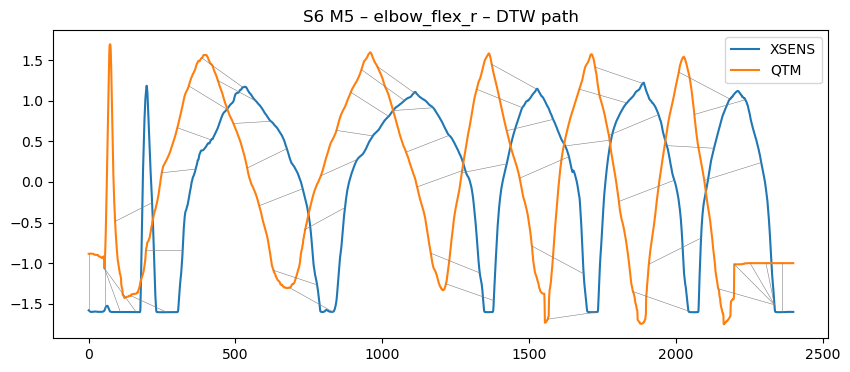

Saved: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/DTW_TAM_results_ALL.csv
Saved: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_dtw_pair_csvs/DTW_TAM_results_MINE_vs_QTM.csv
Saved: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_dtw_pair_csvs/DTW_TAM_results_XSENS_vs_QTM.csv
           Pair  Subject  Movement         Joint   N_A   N_B  TAM_article  \
0   MINE_vs_QTM        3         5  elbow_flex_r  1158  1158     1.253886   
1   MINE_vs_QTM        5         5  elbow_flex_r  1160  1160     0.912931   
2   MINE_vs_QTM        6         5  elbow_flex_r  2346  2346     1.474425   
3  XSENS_vs_QTM        3         5  elbow_flex_r  1212  1212     0.299505   
4  XSENS_vs_QTM        5         5  elbow_flex_r  1399  1399     1.348821   
5  XSENS_vs_QTM        6         5  elbow_flex_r  2401  2401     0.423574   

   Used_derivative  
0            False  
1            False  
2            False  
3       

In [38]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from scipy.spatial.distance import cdist

# --------------------------------------------------------
# USER CONFIGURATION
# --------------------------------------------------------
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

mode = "batch"  # "single" or "batch"

single_subject  = 6
single_movement = 6
single_pair     = ("MINE","QTM")
single_base     = None  # or "S6_M6"

subjects  = [1, 2, 3, 4, 5, 6]
movements = [5]
selected_pairs = [
    ("MINE","QTM"),
    ("XSENS","QTM"),
]

target_coordinates = ["elbow_flex_r"]   # Only compute + plot this coordinate

do_plots   = True
save_plots = False  # True = save figures, False = display on screen
plots_dir  = os.path.join(aligned_root, "_plots")  # folder to save plots

combined_csv     = os.path.join(aligned_root, "DTW_TAM_results_ALL.csv")
per_pair_csv_dir = os.path.join(aligned_root, "_dtw_pair_csvs")

# DTW / TAM settings
band_ratio = 0.10
try_derivative = True
tam_high_thresh = 1.5

# Cost model
cost_mode = "swdtw"  # "euclidean" or "swdtw"
smooth_win = 21
alpha_mix  = 0.5
hv_penalty = 0.10

plt.rcParams["figure.figsize"] = (8, 4)

# --------------------------------------------------------
# LOADING .STO
# --------------------------------------------------------
def load_storage(fp):
    """Load OpenSim .sto file"""
    with open(fp, "r") as f:
        lines = f.readlines()

    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i
            break

    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")

    if "time" in df.columns:
        return df
    if "Time" in df.columns:
        df.rename(columns={"Time":"time"}, inplace=True)
        return df

    raise ValueError("No time column found in ", fp)

# --------------------------------------------------------
# NORMALIZATION & SMOOTHING
# --------------------------------------------------------
def zscore(x):
    x = np.asarray(x, float)
    m = np.nanmean(x)
    s = np.nanstd(x)
    return (x - m) / (s if s > 0 else 1)

def _hann(n):
    if n % 2 == 0:
        n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    if win <= 1:
        return x.copy()
    w = _hann(win)
    w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode="reflect")
    return np.convolve(xpad, w, mode="valid")

# --------------------------------------------------------
# COST MATRIX BUILDER
# --------------------------------------------------------
def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21,
                       alpha=0.5, use_derivative=False):
    x = np.asarray(x, float)
    y = np.asarray(y, float)

    if mode == "euclidean":
        if use_derivative:
            dx = np.diff(x, prepend=x[0])
            dy = np.diff(y, prepend=y[0])
            return cdist(dx[:,None], dy[:,None], metric="euclidean")
        return cdist(x[:,None], y[:,None], metric="euclidean")

    # smoothed amplitude + derivative (SW-DTW)
    xs = _smooth1d(x, smooth_win)
    ys = _smooth1d(y, smooth_win)

    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])

    A = (xs[:,None] - ys[None,:])**2
    B = (dxs[:,None] - dys[None,:])**2
    return alpha*A + (1 - alpha)*B

# --------------------------------------------------------
# DTW WITH BAND + HV PENALTY
# --------------------------------------------------------
def compute_dtw_windowed(x, y, band_ratio=0.10, use_derivative=False,
                          cost_mode="swdtw", smooth_win=21,
                          alpha=0.5, hv_penalty=0.10):
    n = len(x)
    m = len(y)
    band = int(max(n, m) * band_ratio)

    D = _build_cost_matrix(x, y, mode=cost_mode,
                            smooth_win=smooth_win,
                            alpha=alpha, use_derivative=use_derivative)

    ACC = np.full((n, m), np.inf)
    ACC[0,0] = D[0,0]

    for i in range(1, n):
        j_start = max(0, i - band)
        j_end   = min(m, i + band + 1)

        for j in range(j_start, j_end):
            diag = ACC[i-1, j-1]
            hv1  = ACC[i-1, j] + hv_penalty
            hv2  = ACC[i, j-1] + hv_penalty
            ACC[i,j] = D[i,j] + min(diag, hv1, hv2)

    # traceback
    i, j = n-1, m-1
    path = [(i,j)]
    while i > 0 or j > 0:
        candidates = []
        if i > 0 and j > 0:
            candidates.append((ACC[i-1,j-1], i-1, j-1))
        if i > 0:
            candidates.append((ACC[i-1,j], i-1, j))
        if j > 0:
            candidates.append((ACC[i,j-1], i, j-1))
        _, i, j = min(candidates)
        path.append((i,j))
    path.reverse()

    return ACC, path

# --------------------------------------------------------
# TAM METRIC
# --------------------------------------------------------
def tam_from_path(path, N, M):
    adv = delay = phase = 0
    for (i0,j0),(i1,j1) in zip(path[:-1], path[1:]):
        di = i1 - i0
        dj = j1 - j0
        if di == 1 and dj == 0:
            adv += 1
        elif di == 0 and dj == 1:
            delay += 1
        elif di == 1 and dj == 1:
            phase += 1
    phase_eff = phase + 1
    return (adv/N) + (delay/M) + (1 - phase_eff/min(N,M))

# --------------------------------------------------------
# PATH DISCOVERY
# --------------------------------------------------------
def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    pair_folder = pair_dir(root, sysA, sysB)
    Anew = os.path.join(pair_folder, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    Bnew = os.path.join(pair_folder, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(Anew) and os.path.exists(Bnew):
        return Anew, Bnew
    Ale = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    Ble = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(Ale) and os.path.exists(Ble):
        return Ale, Ble
    return None, None

# --------------------------------------------------------
# PLOTTING
# --------------------------------------------------------
def plot_accum_cost(acc, path, joint, s, m, sysA, sysB):
    if joint not in target_coordinates:
        return
    M = np.where(np.isfinite(acc), acc, np.nan)
    cmap = plt.cm.viridis.copy()
    cmap.set_bad(color="#efefef")
    plt.figure(figsize=(6,6))
    plt.imshow(M.T, origin="lower", cmap=cmap, aspect="auto")
    px, py = zip(*path)
    plt.plot(px, py, color="white")
    plt.title(f"S{s} M{m} – {joint} – ACC matrix ({sysA} vs {sysB})")
    plt.xlabel(sysA)
    plt.ylabel(sysB)
    plt.colorbar()
    
    if save_plots:
        os.makedirs(plots_dir, exist_ok=True)
        plt.savefig(os.path.join(plots_dir, f"{joint}_ACC_S{s}_M{m}_{sysA}_vs_{sysB}.png"))
        plt.close()
    else:
        plt.show()

def plot_alignment(x, y, path, joint, s, m, sysA, sysB):
    if joint not in target_coordinates:
        return
    plt.figure(figsize=(10,4))
    plt.plot(x, label=sysA)
    plt.plot(y, label=sysB)
    step = max(1, len(path)//50)
    for (i,j) in path[::step]:
        plt.plot([i,j], [x[i], y[j]], color="gray", linewidth=0.4)
    plt.title(f"S{s} M{m} – {joint} – DTW path")
    plt.legend()
    
    if save_plots:
        os.makedirs(plots_dir, exist_ok=True)
        plt.savefig(os.path.join(plots_dir, f"{joint}_PATH_S{s}_M{m}_{sysA}_vs_{sysB}.png"))
        plt.close()
    else:
        plt.show()

# --------------------------------------------------------
# CORE TEMPORAL VALIDATION
# --------------------------------------------------------
def run_case(s, m, sysA, sysB, rows):
    base = f"S{s}_M{m}"
    fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
    if not (fpA and fpB):
        print(f"Missing aligned files for {base} {sysA} vs {sysB}")
        return

    dfA = load_storage(fpA)
    dfB = load_storage(fpB)

    if not np.array_equal(dfA["time"], dfB["time"]):
        common = np.intersect1d(dfA["time"], dfB["time"])
        dfA = dfA.set_index("time").loc[common].reset_index()
        dfB = dfB.set_index("time").loc[common].reset_index()

    joints = [j for j in target_coordinates if j in dfA.columns and j in dfB.columns]
    if not joints:
        print(f"⚠️ No target joints found for S{s} M{m} {sysA} vs {sysB}")
        return

    for j in joints:
        x = zscore(dfA[j])
        y = zscore(dfB[j])

        valid = np.isfinite(x) & np.isfinite(y)
        if valid.sum() < 5:
            continue

        i0 = np.argmax(valid)
        i1 = len(valid) - np.argmax(valid[::-1])
        xw = x[i0:i1]
        yw = y[i0:i1]

        acc, path = compute_dtw_windowed(
            xw, yw,
            band_ratio=band_ratio,
            use_derivative=False,
            cost_mode=cost_mode,
            smooth_win=smooth_win,
            alpha=alpha_mix,
            hv_penalty=hv_penalty
        )
        tam = tam_from_path(path, len(xw), len(yw))
        used_der = False

        if try_derivative and tam > tam_high_thresh:
            acc2, path2 = compute_dtw_windowed(
                xw, yw,
                band_ratio=band_ratio,
                use_derivative=True,
                cost_mode=cost_mode,
                smooth_win=smooth_win,
                alpha=alpha_mix,
                hv_penalty=hv_penalty
            )
            tam2 = tam_from_path(path2, len(xw), len(yw))
            if tam2 < tam:
                acc, path, tam = acc2, path2, tam2
                used_der = True

        rows.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": s,
            "Movement": m,
            "Joint": j,
            "N_A": len(xw),
            "N_B": len(yw),
            "TAM_article": tam,
            "Used_derivative": used_der
        })

        if do_plots:
            plot_accum_cost(acc, path, j, s, m, sysA, sysB)
            plot_alignment(xw, yw, path, j, s, m, sysA, sysB)

# --------------------------------------------------------
# RUN (SINGLE OR BATCH)
# --------------------------------------------------------
rows = []

if mode == "single":
    s, m = single_subject, single_movement
    sysA, sysB = single_pair
    run_case(s, m, sysA, sysB, rows)
else:
    for sysA, sysB in selected_pairs:
        for s in subjects:
            for m in movements:
                run_case(s, m, sysA, sysB, rows)

# --------------------------------------------------------
# SAVE RESULTS
# --------------------------------------------------------
df = pd.DataFrame(rows)
if df.empty:
    print("No temporal-validation results produced.")
else:
    df.to_csv(combined_csv, index=False)
    print("Saved:", combined_csv)

    os.makedirs(per_pair_csv_dir, exist_ok=True)
    for pair, sdf in df.groupby("Pair"):
        fname = os.path.join(per_pair_csv_dir, f"DTW_TAM_results_{pair}.csv")
        sdf.to_csv(fname, index=False)
        print("Saved:", fname)

    print(df.head(20))


Skip S1_M5 MINE vs QTM: aligned files not found.
Skip S2_M5 MINE vs QTM: aligned files not found.


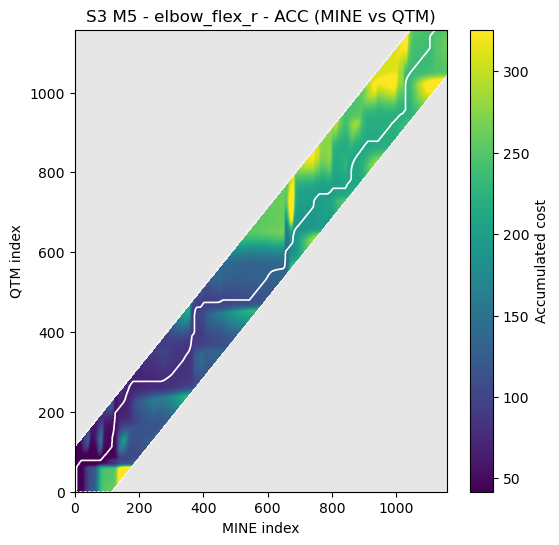

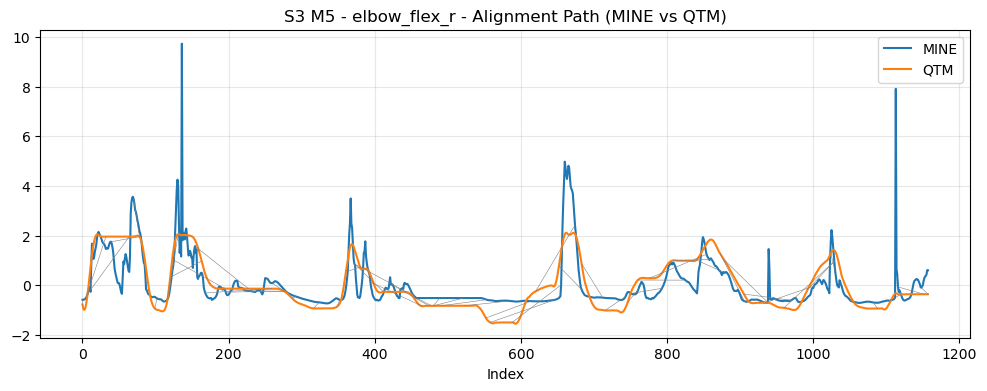

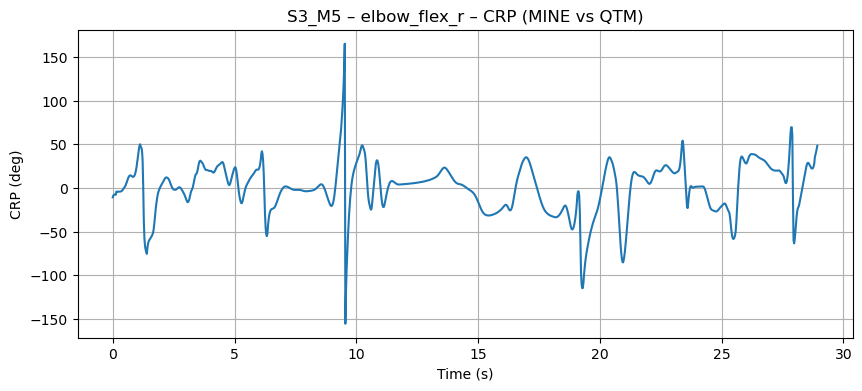

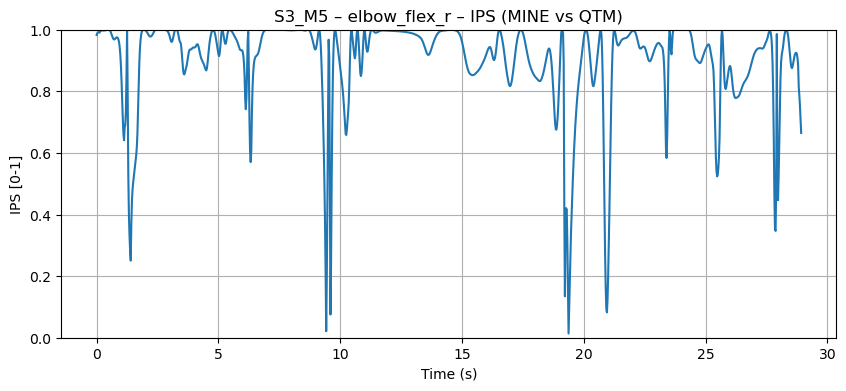

Skip S4_M5 MINE vs QTM: aligned files not found.


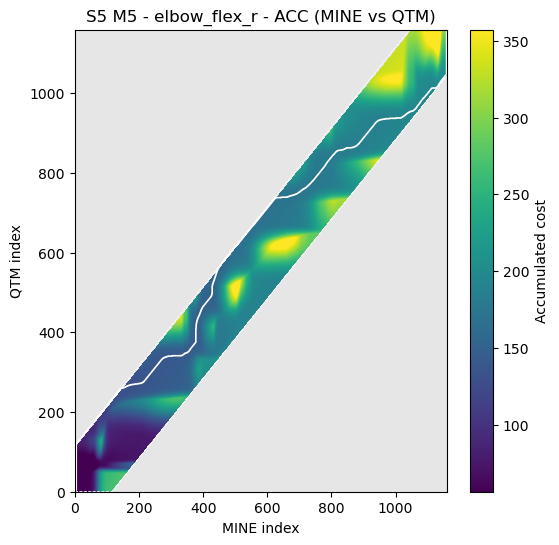

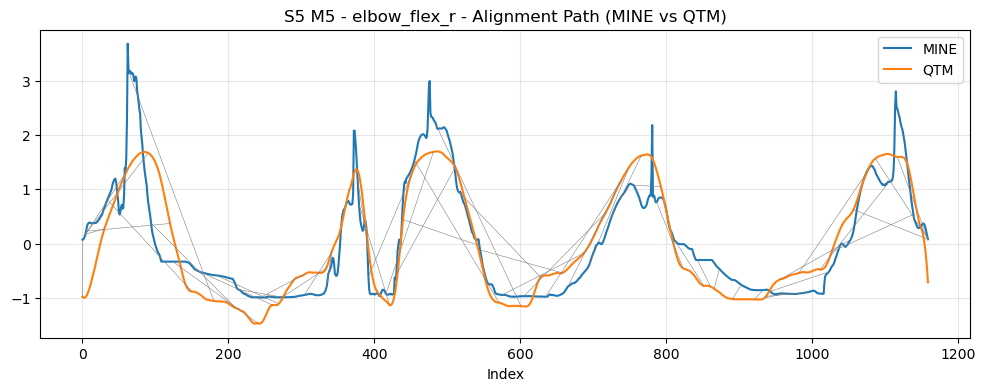

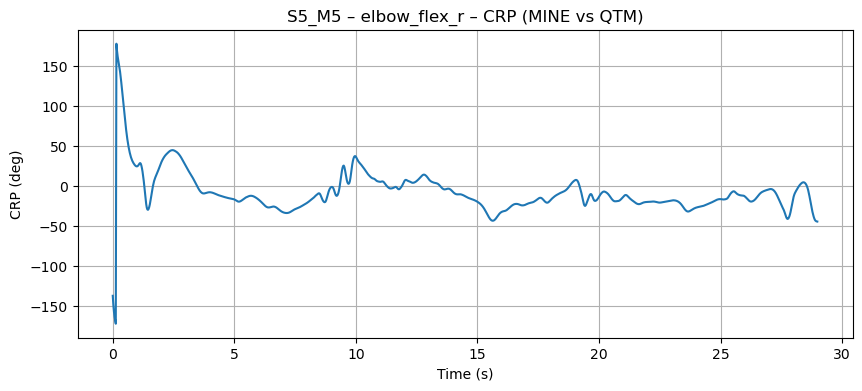

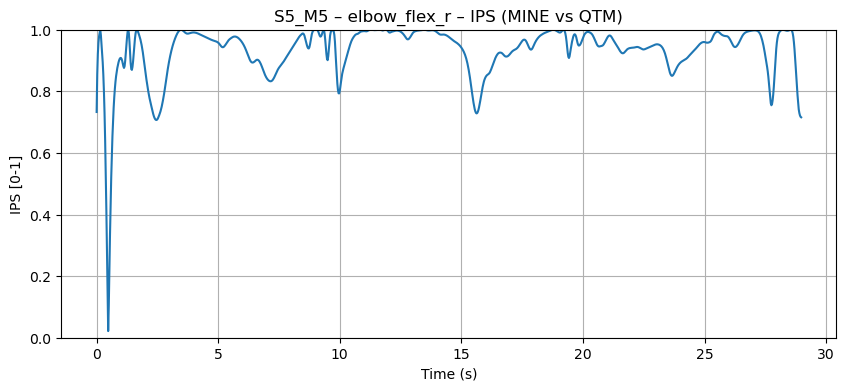

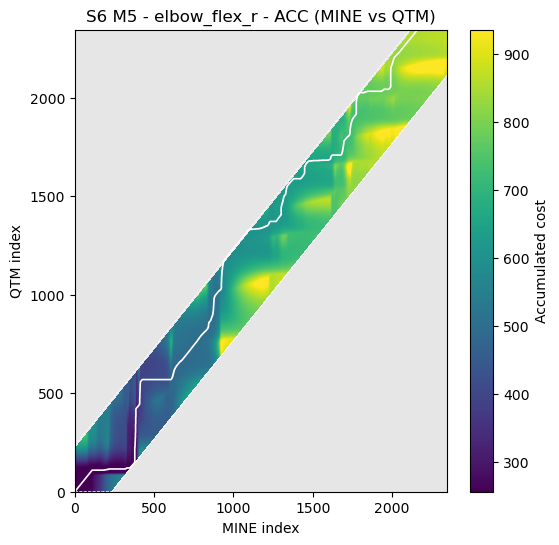

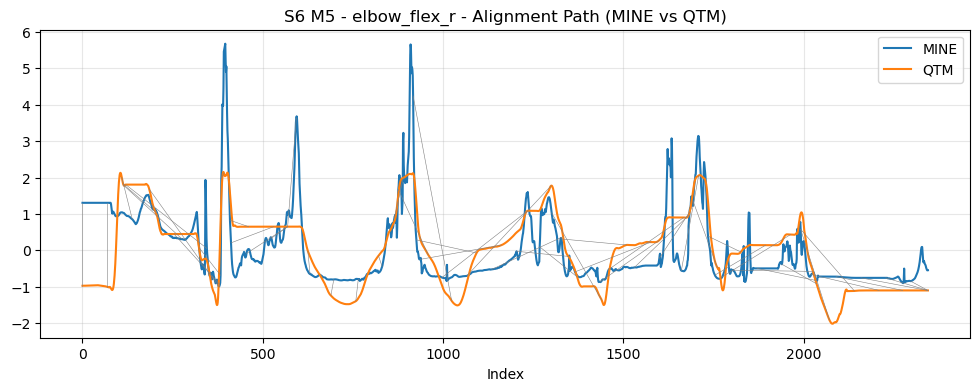

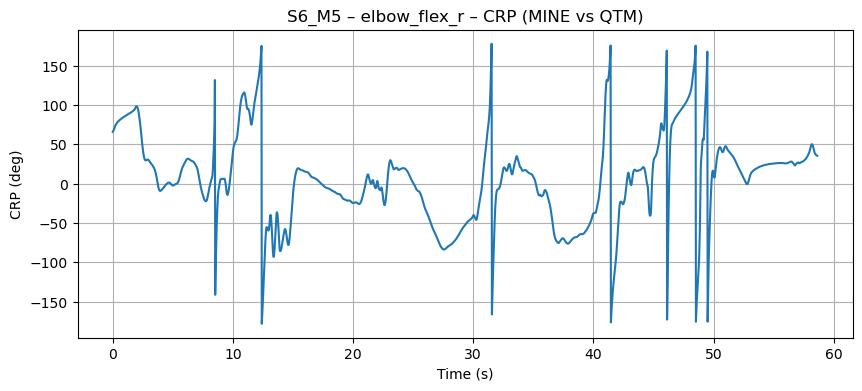

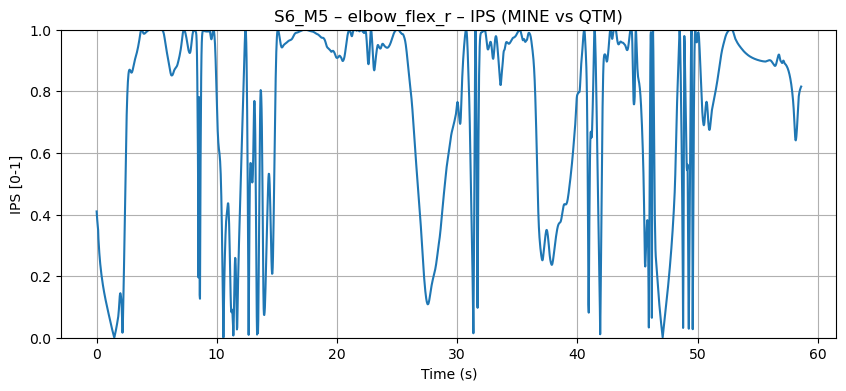

Skip S1_M5 XSENS vs QTM: aligned files not found.
Skip S2_M5 XSENS vs QTM: aligned files not found.


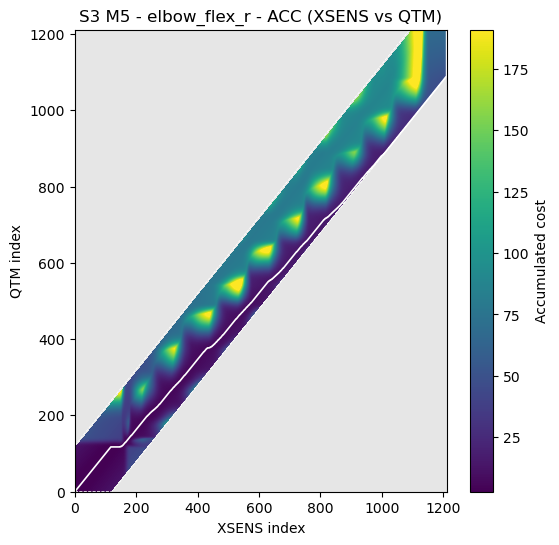

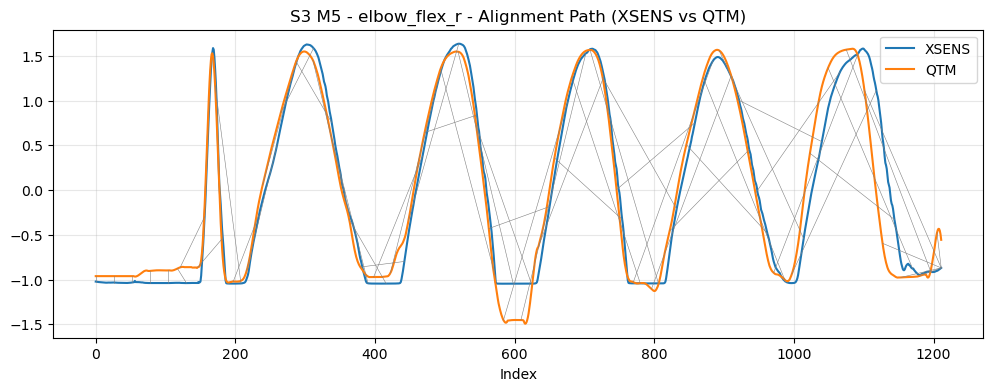

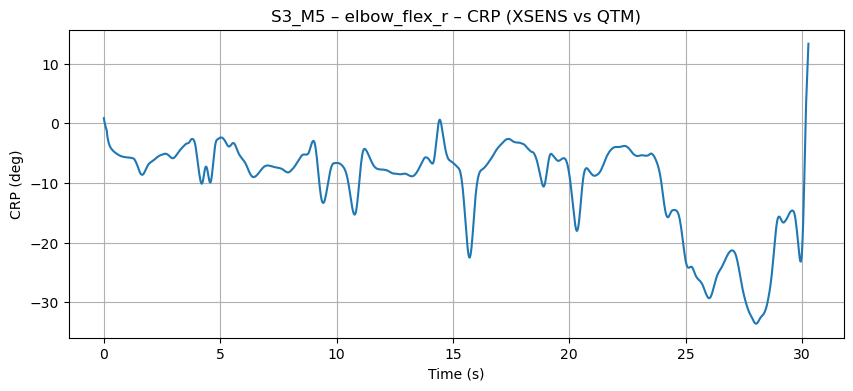

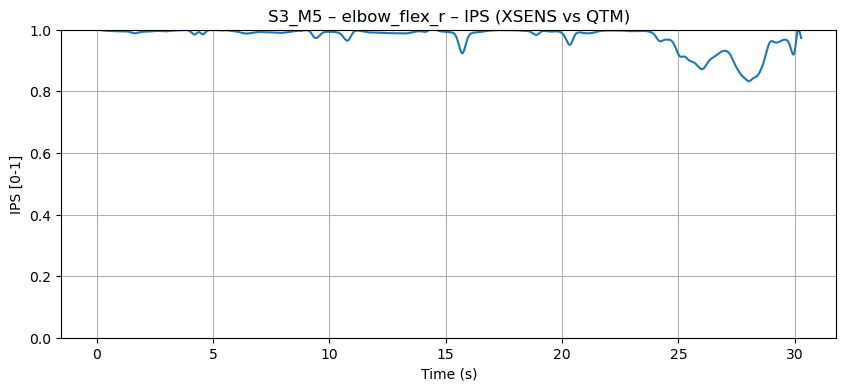

Skip S4_M5 XSENS vs QTM: aligned files not found.


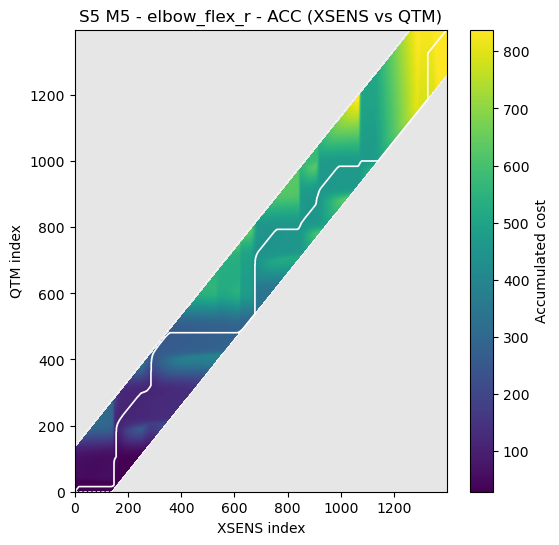

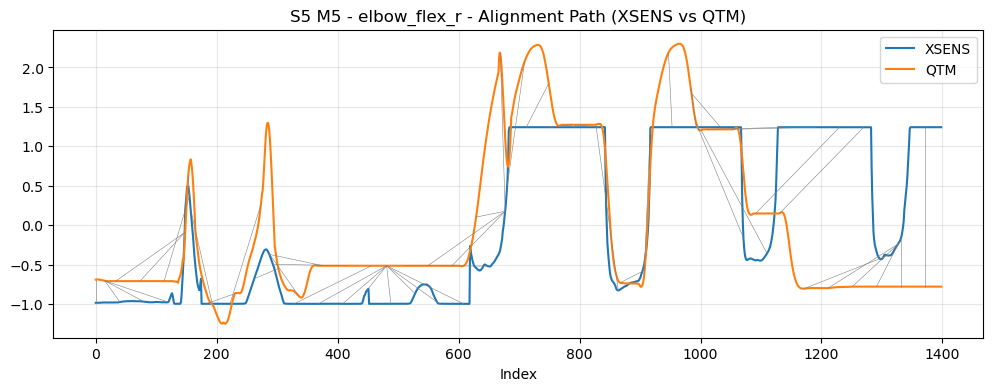

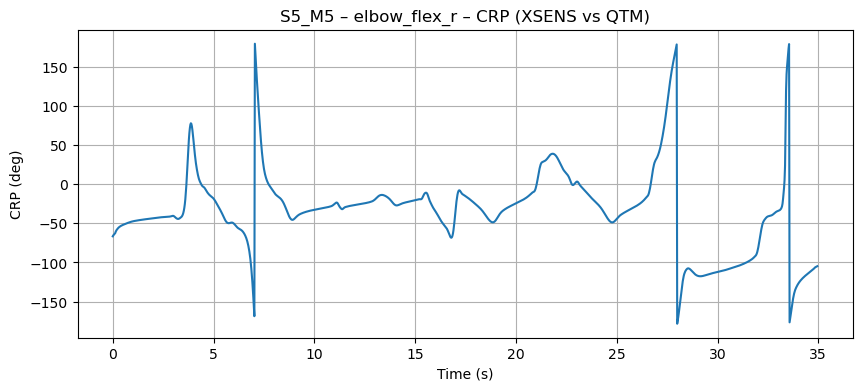

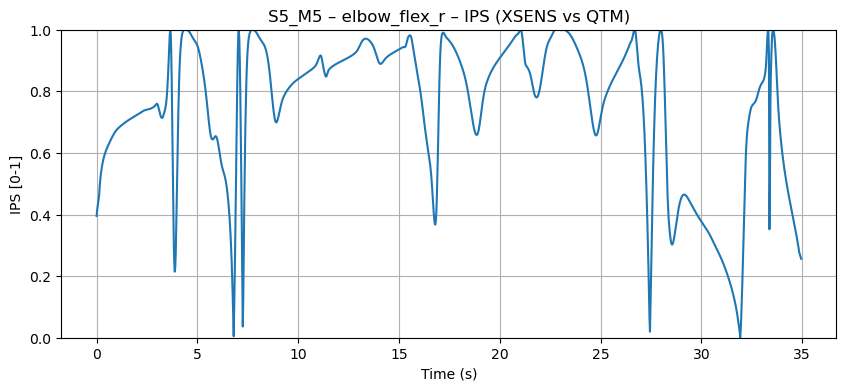

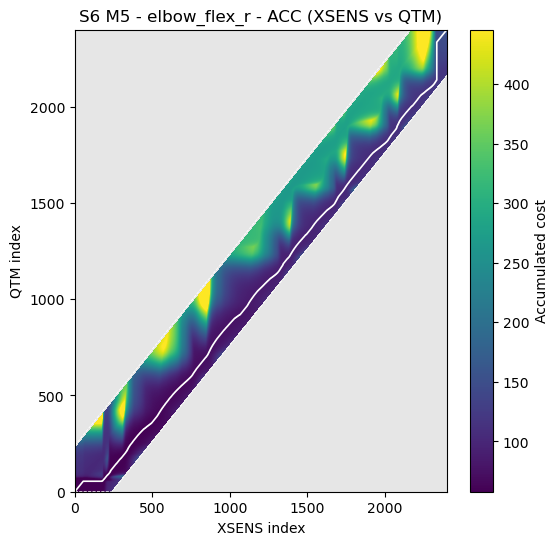

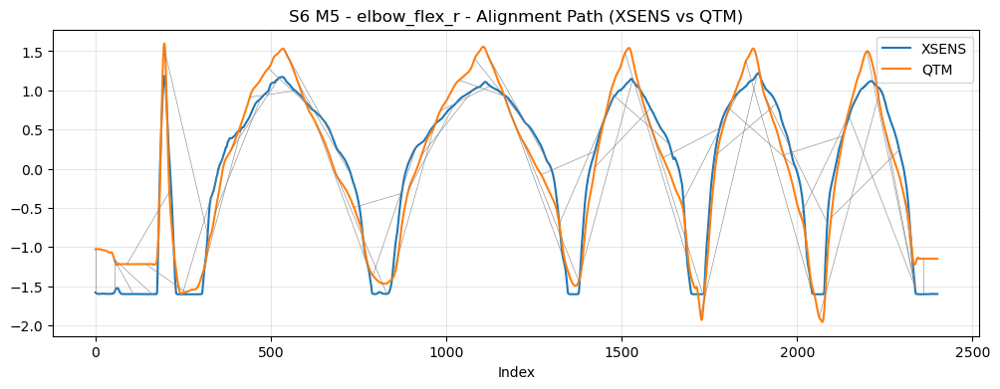

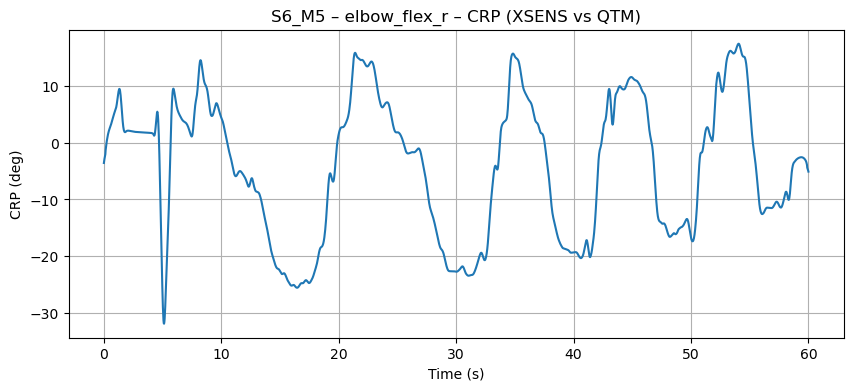

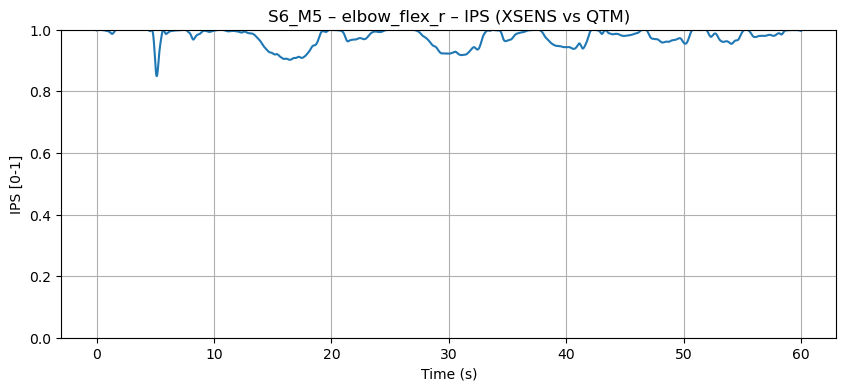

Saved combined CSV: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/DTW_TAM_CRP_IPS_results.csv
           Pair  Subject  Movement         Joint   N_A   N_B  TAM_article  \
0   MINE_vs_QTM        3         5  elbow_flex_r  1158  1158     1.253886   
1   MINE_vs_QTM        5         5  elbow_flex_r  1160  1160     0.912931   
2   MINE_vs_QTM        6         5  elbow_flex_r  2346  2346     1.474425   
3  XSENS_vs_QTM        3         5  elbow_flex_r  1212  1212     0.299505   
4  XSENS_vs_QTM        5         5  elbow_flex_r  1399  1399     1.348821   
5  XSENS_vs_QTM        6         5  elbow_flex_r  2401  2401     0.423574   

   CRP_mean_linear_deg  CRP_mean_circular_deg  CRP_std_deg  IPS_mean  \
0             0.188261               0.843339    28.564081  0.899695   
1            -7.946217              -9.121218    26.916883  0.932511   
2             5.604731               4.916221    55.104851  0.736774   
3           -10.007725              -9.974578   

In [36]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from scipy.spatial.distance import cdist
from scipy.signal import savgol_filter, butter, filtfilt, detrend, hilbert
from scipy.stats import circmean

# ---------------------------
# USER CONFIGURATION
# ---------------------------
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

# run mode
mode = "batch"  # "single" or "batch"

# single-run settings (used only if mode == "single")
single_pair    = ("MINE", "QTM")
single_subject = 6
single_movement= 10
single_base    = None   # if you want to override S/M with "S6_M6"

# batch lists (used if mode == "batch")
subjects = [1,2,3,4,5,6]    # or "all"
movements = [5]             # or "all" or list

selected_pairs = [
    ("MINE","QTM"),
    ("XSENS","QTM"),
]

# Single target coordinate (string)
target_coordinate = "elbow_flex_r"

# plotting / saving
do_plots = True
save_plots = False       # if True -> save PNGs under plots_dir
plots_dir = os.path.join(aligned_root, "_plots")

# outputs
combined_csv     = os.path.join(aligned_root, "DTW_TAM_CRP_IPS_results.csv")
per_pair_csv_dir = os.path.join(aligned_root, "_pair_csvs")

# DTW/TAM params
band_ratio = 0.10
cost_mode  = "swdtw"   # "euclidean" or "swdtw"
smooth_win = 21
alpha_mix  = 0.5
hv_penalty = 0.10
try_derivative = True
tam_high_thresh = 1.5

# CRP/IPS params
default_fs = 40.0
lp_hz = 6.0
hp_hz = None
amp_eps = 1e-3
smooth_win_sec = 0.25
phase_method = "hilbert"  # "hilbert" or "phase_plane"

plt.rcParams["figure.figsize"] = (10,4)


# ---------------------------
# IO / helpers
# ---------------------------
def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B
    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B
    return None, None

def load_storage(fp):
    """Load .sto (after EndHeader) into DataFrame with 'time' column."""
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:300]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])), sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        return df
    if "Time" in df.columns:
        df.rename(columns={"Time":"time"}, inplace=True)
        return df
    raise ValueError(f"No time column found in {os.path.basename(fp)}")

def zscore(x):
    x = np.asarray(x, float)
    m = np.nanmean(x); s = np.nanstd(x)
    return (x - m) / (s if s > 0 else 1.0)

def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')


# ---------------------------
# cost matrix builder
# ---------------------------
def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    x = np.asarray(x, float); y = np.asarray(y, float)
    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0]); ys = np.diff(y, prepend=y[0])
            return cdist(xs.reshape(-1,1), ys.reshape(-1,1), metric="euclidean")
        else:
            return cdist(x.reshape(-1,1), y.reshape(-1,1), metric="euclidean")
    # sw-dtw
    xs = _smooth1d(x, smooth_win)
    ys = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0]); dys = np.diff(ys, prepend=ys[0])
    A = (xs[:,None] - ys[None,:])**2
    B = (dxs[:,None] - dys[None,:])**2
    return alpha*A + (1.0-alpha)*B


# ---------------------------
# DTW windowed + HV penalty
# ---------------------------
def compute_dtw_windowed(x, y, band_ratio=0.10, use_derivative=False,
                         cost_mode="swdtw", smooth_win=21, alpha=0.5, hv_penalty=0.10):
    n = len(x); m = len(y)
    band = int(max(n, m) * band_ratio)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win, alpha=alpha, use_derivative=use_derivative)
    ACC = np.full((n, m), np.inf)
    ACC[0,0] = D[0,0]
    # dynamic program within band
    for i in range(1, n):
        j_start = max(0, i - band)
        j_end   = min(m, i + band + 1)
        for j in range(j_start, j_end):
            diag = ACC[i-1, j-1]
            hv1 = ACC[i-1, j] + hv_penalty
            hv2 = ACC[i, j-1] + hv_penalty
            ACC[i,j] = D[i,j] + min(diag, hv1, hv2)
    # traceback
    i, j = n-1, m-1
    path = [(i,j)]
    while i > 0 or j > 0:
        candidates = []
        if i > 0 and j > 0:
            candidates.append((ACC[i-1,j-1], i-1, j-1))
        if i > 0:
            candidates.append((ACC[i-1,j], i-1, j))
        if j > 0:
            candidates.append((ACC[i,j-1], i, j-1))
        _, i, j = min(candidates)
        path.append((i,j))
    path.reverse()
    return ACC, path


# ---------------------------
# TAM metric
# ---------------------------
def tam_from_path(path, N, M):
    adv = delay = phase = 0
    for (i0,j0),(i1,j1) in zip(path[:-1], path[1:]):
        di, dj = i1 - i0, j1 - j0
        if di == 1 and dj == 0: adv += 1
        elif di == 0 and dj == 1: delay += 1
        elif di == 1 and dj == 1: phase += 1
    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)


# ---------------------------
# approximate (warp + amplitude match + smooth)
# ---------------------------
def approximate_signal_by_path(ref, src, path):
    """
    Warp src into ref index-space using DTW path, fill gaps, amplitude-match and smooth.
    ref and src are 1D arrays; path is list of (i_ref, i_src) pairs.
    Returns warped_src (length = len(ref)).
    """
    ref = np.asarray(ref, float)
    src = np.asarray(src, float)
    n_ref = len(ref)
    warped = np.full(n_ref, np.nan, dtype=float)

    # map src samples to ref indices
    for i_ref, i_src in path:
        if 0 <= i_ref < n_ref and 0 <= i_src < len(src):
            warped[i_ref] = src[i_src]

    # fill edges and gaps by interpolation
    good_idx = np.where(np.isfinite(warped))[0]
    if good_idx.size == 0:
        # nothing mapped; fallback: resample src to ref length
        warped = np.interp(np.linspace(0, len(src)-1, n_ref), np.arange(len(src)), src)
    else:
        # fill leading/trailing
        if good_idx[0] > 0:
            warped[:good_idx[0]] = warped[good_idx[0]]
        if good_idx[-1] < n_ref-1:
            warped[good_idx[-1]+1:] = warped[good_idx[-1]]
        # linear interpolate remaining NaNs
        nan_pos = np.where(~np.isfinite(warped))[0]
        if nan_pos.size > 0:
            warped[nan_pos] = np.interp(nan_pos, good_idx, warped[good_idx])

    # amplitude and offset match (shape-based)
    # normalize both shapes then scale to ref RMS
    warped_z = (warped - np.mean(warped)) / (np.std(warped) + 1e-12)
    ref_z    = (ref - np.mean(ref)) / (np.std(ref) + 1e-12)
    rms_ref  = np.sqrt(np.mean(ref**2)) + 1e-12
    rms_warp = np.sqrt(np.mean(warped_z**2)) + 1e-12
    warped_scaled = warped_z * (rms_ref / rms_warp)

    # shift mean to match ref mean
    warped_scaled += (np.mean(ref) - np.mean(warped_scaled))

    # smooth (S-G) for nicer shape
    win = 21 if len(warped_scaled) >= 21 else (len(warped_scaled)//2*2+1)
    try:
        warped_scaled = savgol_filter(warped_scaled, win, polyorder=3)
    except Exception:
        pass

    return warped_scaled


# ---------------------------
# plotting functions (ACC + alignment)
# ---------------------------
def plot_accum_cost(acc, path, joint, subj, mov, sysA, sysB, outdir=None, band_ratio=None):
    Mmat = np.where(np.isfinite(acc), acc, np.nan)
    cmap = plt.cm.viridis.copy()
    cmap.set_bad(color="#e6e6e6")
    vmin = np.nanpercentile(Mmat, 2) if np.isfinite(Mmat).any() else 0
    vmax = np.nanpercentile(Mmat, 98) if np.isfinite(Mmat).any() else 1
    plt.figure(figsize=(6,6))
    im = plt.imshow(Mmat.T, origin='lower', aspect='auto', cmap=cmap, vmin=vmin, vmax=vmax)
    px, py = zip(*path)
    plt.plot(px, py, color='white', linewidth=1.2)
    if band_ratio is not None:
        n, m = acc.shape
        band = int(max(n, m) * band_ratio)
        i = np.arange(n)
        lo = np.clip(i - band, 0, m-1)
        hi = np.clip(i + band, 0, m-1)
        plt.plot(i, lo, 'w--', lw=0.6)
        plt.plot(i, hi, 'w--', lw=0.6)
    plt.title(f"S{subj} M{mov} - {joint} - ACC ({sysA} vs {sysB})")
    plt.xlabel(f"{sysA} index"); plt.ylabel(f"{sysB} index")
    cb = plt.colorbar(im); cb.set_label("Accumulated cost")
    if outdir and save_plots:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_ACC_{sysA}_vs_{sysB}.png"), dpi=150, bbox_inches='tight')
        plt.close()
    else:
        plt.show()

def plot_alignment(x, y, path, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(12,4))
    plt.plot(x, label=sysA)
    plt.plot(y, label=sysB)
    step = max(1, len(path)//50)
    for (i,j) in path[::step]:
        plt.plot([i, j], [x[i], y[j]], color='gray', linewidth=0.4)
    plt.title(f"S{subj} M{mov} - {joint} - Alignment Path ({sysA} vs {sysB})")
    plt.xlabel("Index"); plt.legend(); plt.grid(True, alpha=0.3)
    if outdir and save_plots:
        os.makedirs(outdir, exist_ok=True)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_PATH_{sysA}_vs_{sysB}.png"), dpi=150, bbox_inches='tight')
        plt.close()
    else:
        plt.show()


# ---------------------------
# CRP / IPS functions
# ---------------------------
def _butter_lowpass_filt(x, fs, fc=6.0, order=4, hp=None):
    x = np.asarray(x, float)
    y = detrend(x, type='constant')
    if hp is not None and hp > 0:
        b, a = butter(order, hp/(fs/2), btype='highpass')
        pad = max(len(a), len(b)) * 3
        y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    b, a = butter(order, fc/(fs/2), btype='lowpass')
    pad = max(len(a), len(b)) * 3
    y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    return y

def _circular_moving_mean(angles_deg, win_samples):
    ang = np.deg2rad(angles_deg)
    c = np.cos(ang); s = np.sin(ang)
    k = int(max(1, win_samples))
    c_ma = np.convolve(c, np.ones(k)/k, mode='same')
    s_ma = np.convolve(s, np.ones(k)/k, mode='same')
    return np.rad2deg(np.arctan2(s_ma, c_ma))

def compute_crp_ips(x, y, fs, lp_hz=6.0, hp_hz=None, amp_eps=1e-3, smooth_win_sec=0.25, method="hilbert"):
    x = _butter_lowpass_filt(x, fs, fc=lp_hz, order=4, hp=hp_hz)
    y = _butter_lowpass_filt(y, fs, fc=lp_hz, order=4, hp=hp_hz)
    if method == "phase_plane":
        vx = np.gradient(x) * fs
        vy = np.gradient(y) * fs
        xr = x / (np.sqrt(np.mean(x**2)) + 1e-12)
        yr = y / (np.sqrt(np.mean(y**2)) + 1e-12)
        vxr = vx / (np.sqrt(np.mean(vx**2)) + 1e-12)
        vyr = vy / (np.sqrt(np.mean(vy**2)) + 1e-12)
        phx = np.arctan2(vxr, xr)
        phy = np.arctan2(vyr, yr)
        amp_x = np.hypot(xr, vxr)
        amp_y = np.hypot(yr, vyr)
    else:
        ax = hilbert(x); ay = hilbert(y)
        phx = np.angle(ax); phy = np.angle(ay)
        amp_x = np.abs(ax); amp_y = np.abs(ay)

    dphi = np.angle(np.exp(1j*(phx - phy)))
    crp_deg = np.degrees(dphi)
    bad = (amp_x < amp_eps) | (amp_y < amp_eps)
    crp_deg[bad] = np.nan
    win = int(round(smooth_win_sec * fs))
    if win > 1:
        sm = _circular_moving_mean(np.where(np.isnan(crp_deg), 0.0, crp_deg), win)
        crp_deg = np.where(bad, np.nan, sm)
    ips = np.abs(np.cos(np.deg2rad(crp_deg)))
    return crp_deg, ips


# ---------------------------
# per-trial runner (DTW/approx + CRP/IPS)
# ---------------------------
def run_case(subject, movement, sysA, sysB, rows):
    base = f"S{subject}_M{movement}"
    fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
    if not (fpA and fpB):
        print(f"Skip {base} {sysA} vs {sysB}: aligned files not found.")
        return

    dfA = load_storage(fpA)
    dfB = load_storage(fpB)

    # align times if necessary
    if not np.array_equal(dfA["time"].values, dfB["time"].values):
        common = np.intersect1d(dfA["time"].values, dfB["time"].values)
        if len(common) < 5:
            print(f"Skip {base} {sysA} vs {sysB}: insufficient common time points.")
            return
        dfA = dfA.set_index("time").loc[common].reset_index()
        dfB = dfB.set_index("time").loc[common].reset_index()

    t = dfA["time"].to_numpy(float)
    dt = np.median(np.diff(t)) if len(t) > 1 else 1.0/default_fs
    fs = (1.0/dt) if (np.isfinite(dt) and dt > 0) else default_fs

    joint = target_coordinate
    if joint not in dfA.columns or joint not in dfB.columns:
        print(f"Skip {base} {sysA} vs {sysB}: target coordinate '{joint}' not present.")
        return

    # zscore & valid region
    x0 = zscore(dfA[joint].to_numpy(float))
    y0 = zscore(dfB[joint].to_numpy(float))
    valid = np.isfinite(x0) & np.isfinite(y0)
    if valid.sum() < 5:
        print(f"Skip {base} {sysA} vs {sysB}: not enough valid samples.")
        return
    i0 = np.argmax(valid)
    i1 = len(valid) - np.argmax(valid[::-1])
    xw = x0[i0:i1]; yw = y0[i0:i1]
    if len(xw) < 5 or len(yw) < 5:
        print(f"Skip {base} {sysA} vs {sysB}: too short after trim.")
        return

    # compute DTW accum + path
    acc, path = compute_dtw_windowed(
        xw, yw,
        band_ratio=band_ratio,
        use_derivative=False,
        cost_mode=cost_mode,
        smooth_win=smooth_win,
        alpha=alpha_mix,
        hv_penalty=hv_penalty
    )

    # show ACC (and optionally save)
    if do_plots:
        outdir = os.path.join(plots_dir, f"{sysA}_vs_{sysB}", base)
        plot_accum_cost(acc, path, joint, subject, movement, sysA, sysB,
                        outdir=(outdir if save_plots else None), band_ratio=band_ratio)

    # If either side is QTM, approximate QTM to reference
    x_approx = xw.copy()
    y_approx = yw.copy()
    if sysB == "QTM":
        # use xw (MINE/XSENS) as reference, approximate QTM (yw)
        y_approx = approximate_signal_by_path(xw, yw, path)
    elif sysA == "QTM":
        # if QTM is first, invert mapping: create inv_path mapping target indices -> src
        inv_path = [(j,i) for (i,j) in path]
        x_approx = approximate_signal_by_path(yw, xw, inv_path)

    # recompute TAM with original path lengths
    tam = tam_from_path(path, len(xw), len(yw))

    # compute CRP/IPS on the approximated signals (use fs inferred above)
    crp_deg, ips = compute_crp_ips(x_approx, y_approx, fs,
                                   lp_hz=lp_hz, hp_hz=hp_hz,
                                   amp_eps=amp_eps, smooth_win_sec=smooth_win_sec,
                                   method=phase_method)
    mean_crp_lin  = float(np.nanmean(crp_deg)) if np.isfinite(np.nanmean(crp_deg)) else np.nan
    mean_crp_circ = float(circmean(crp_deg[~np.isnan(crp_deg)], high=180, low=-180)) if np.isfinite(np.nanmean(crp_deg)) else np.nan
    std_crp       = float(np.nanstd(crp_deg))
    mean_ips      = float(np.nanmean(ips))
    pct_hi_sync   = float(np.nanmean(ips > 0.8) * 100.0)

    rows.append({
        "Pair": f"{sysA}_vs_{sysB}",
        "Subject": subject,
        "Movement": movement,
        "Joint": joint,
        "N_A": len(xw), "N_B": len(yw),
        "TAM_article": tam,
        "CRP_mean_linear_deg": mean_crp_lin,
        "CRP_mean_circular_deg": mean_crp_circ,
        "CRP_std_deg": std_crp,
        "IPS_mean": mean_ips,
        "IPS_pct_gt_0p8": pct_hi_sync
    })

    # alignment plot (reference vs approximated QTM)
    if do_plots:
        outdir = os.path.join(plots_dir, f"{sysA}_vs_{sysB}", base)
        plot_alignment(x_approx, y_approx, path, joint, subject, movement, sysA, sysB,
                       outdir=(outdir if save_plots else None))

        # CRP plot
        tv = t[i0:i1] if len(t)>0 else np.arange(len(crp_deg))/fs
        plt.figure()
        plt.plot(tv, crp_deg)
        plt.title(f"{base} – {joint} – CRP ({sysA} vs {sysB})")
        plt.xlabel("Time (s)"); plt.ylabel("CRP (deg)"); plt.grid(True)
        if save_plots:
            os.makedirs(outdir, exist_ok=True)
            plt.savefig(os.path.join(outdir, f"{joint}_CRP_{sysA}_vs_{sysB}.png"), dpi=150, bbox_inches='tight'); plt.close()
        else:
            plt.show()

        # IPS plot
        plt.figure()
        plt.plot(tv, ips)
        plt.title(f"{base} – {joint} – IPS ({sysA} vs {sysB})")
        plt.xlabel("Time (s)"); plt.ylabel("IPS [0-1]"); plt.ylim(0,1); plt.grid(True)
        if save_plots:
            plt.savefig(os.path.join(outdir, f"{joint}_IPS_{sysA}_vs_{sysB}.png"), dpi=150, bbox_inches='tight'); plt.close()
        else:
            plt.show()


# ---------------------------
# run (single or batch)
# ---------------------------
all_rows = []

if mode.lower() == "single":
    if single_base:
        try:
            s = int(single_base.split("_")[0][1:])
            m = int(single_base.split("_")[1][1:])
        except Exception:
            raise ValueError("single_base must look like 'S4_M10'")
    else:
        s, m = single_subject, single_movement
    sysA, sysB = single_pair
    run_case(s, m, sysA, sysB, all_rows)
else:
    for (sysA, sysB) in selected_pairs:
        for s in subjects:
            for m in movements:
                run_case(s, m, sysA, sysB, all_rows)

# ---------------------------
# save combined CSV
# ---------------------------
res_df = pd.DataFrame(all_rows)
if res_df.empty:
    print("No results produced.")
else:
    os.makedirs(per_pair_csv_dir, exist_ok=True)
    res_df.to_csv(combined_csv, index=False)
    for pair, subdf in res_df.groupby("Pair"):
        subdf.to_csv(os.path.join(per_pair_csv_dir, f"results_{pair}.csv"), index=False)
    print("Saved combined CSV:", combined_csv)
    print(res_df.head(20))



## CRP & IPS computation 

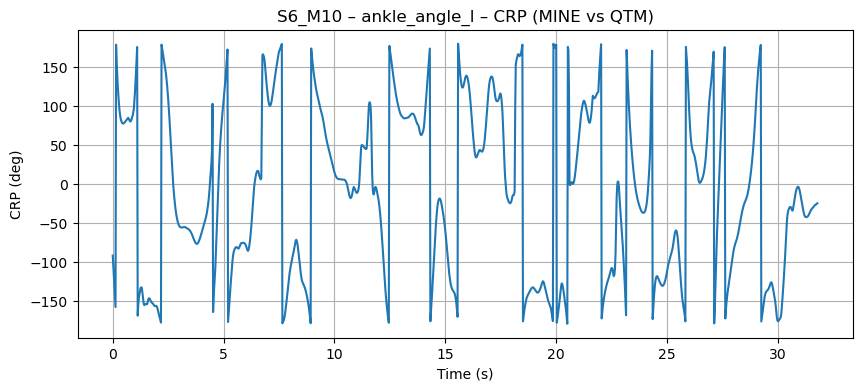

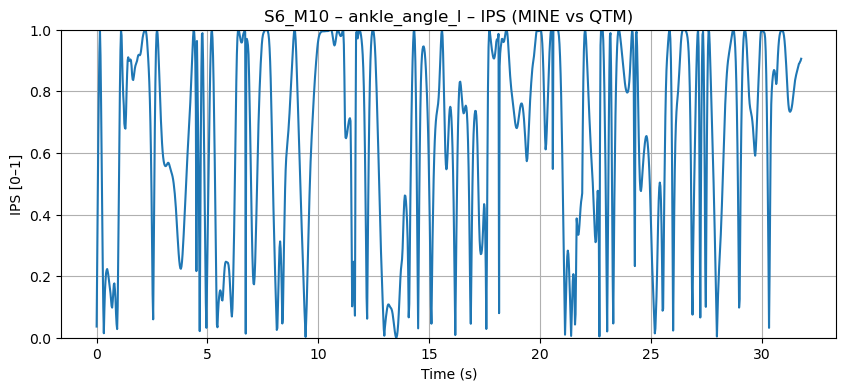

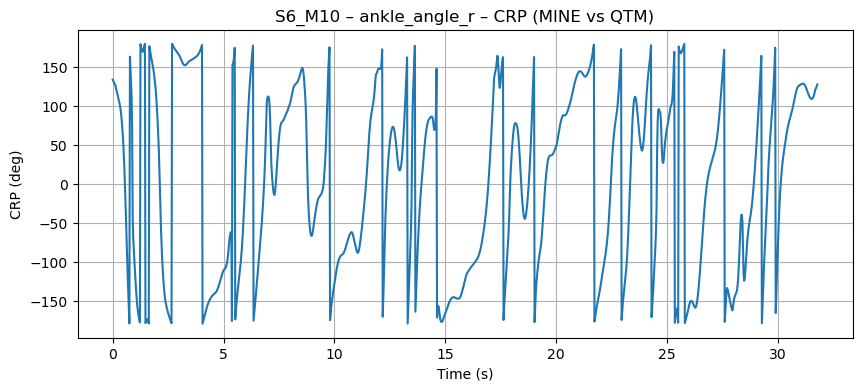

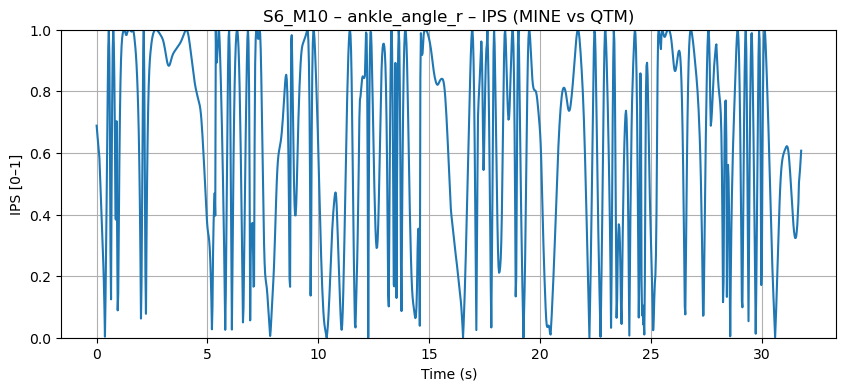

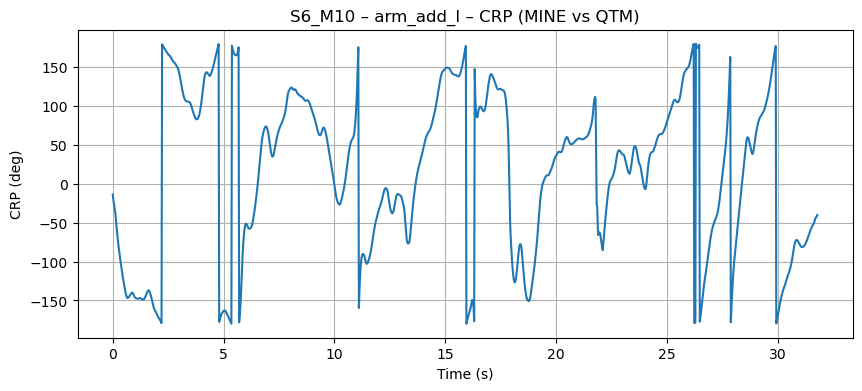

...

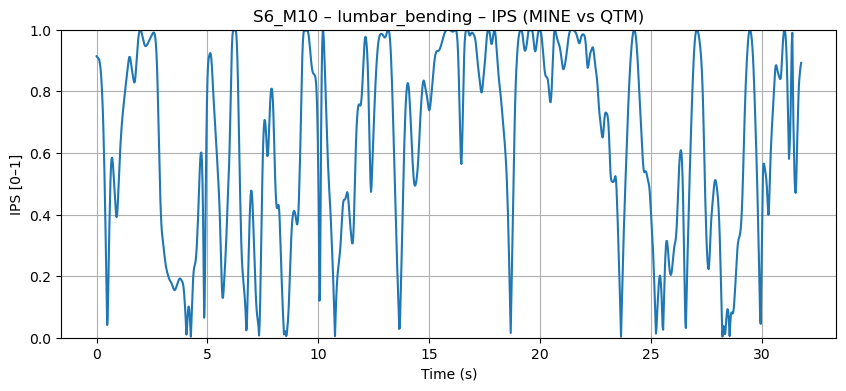

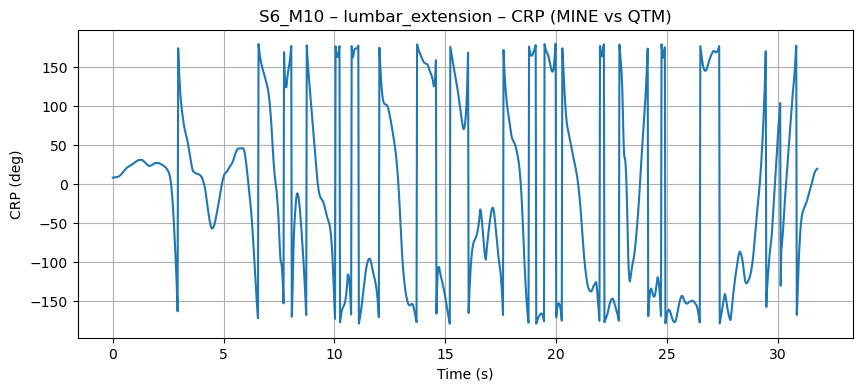

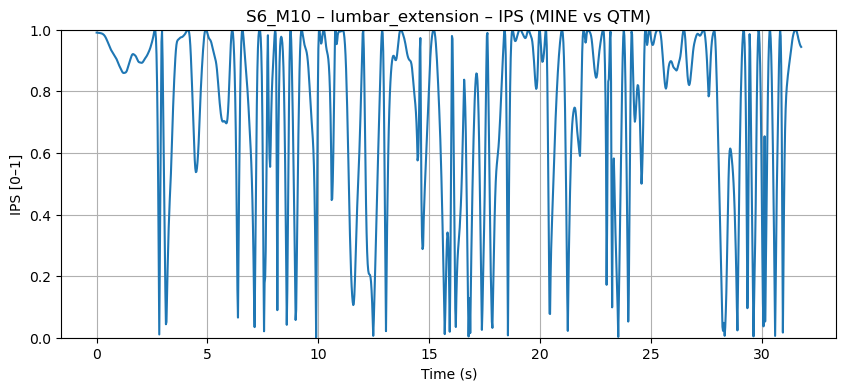

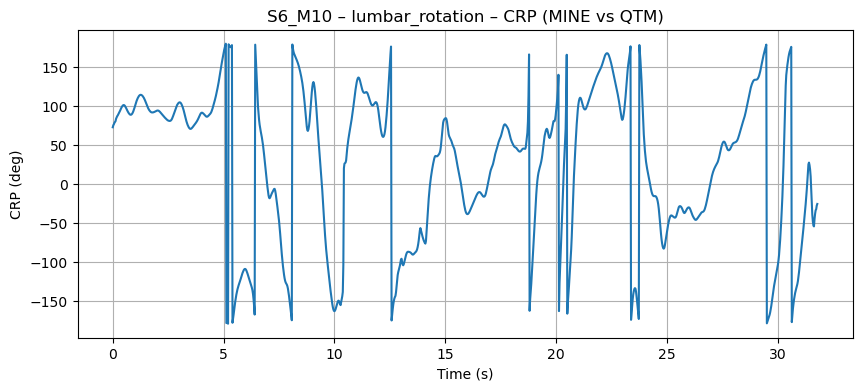

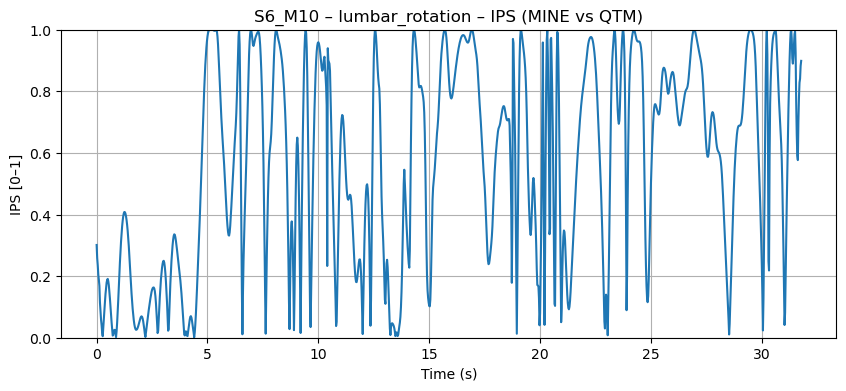

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:263: RuntimeWarning: Mean of empty slice
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:264: RuntimeWarning: Mean of empty slice
/opt/anaconda3/lib/python3.7/site-packages/numpy/lib/nanfunctions.py:1671: RuntimeWarning: Degrees of freedom <= 0 for slice.
  keepdims=keepdims)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:266: RuntimeWarning: Mean of empty slice


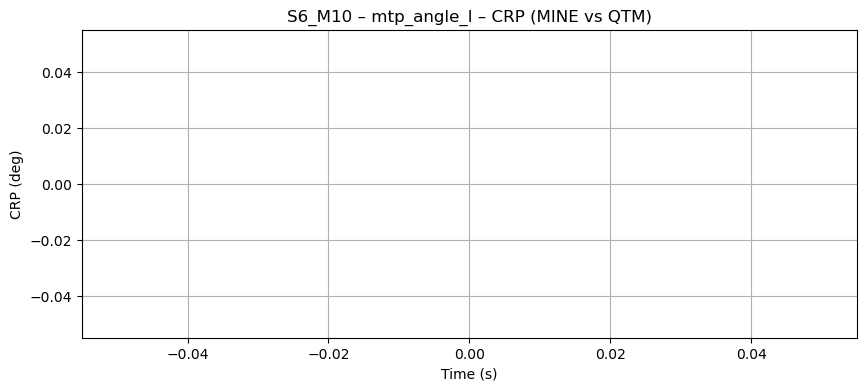

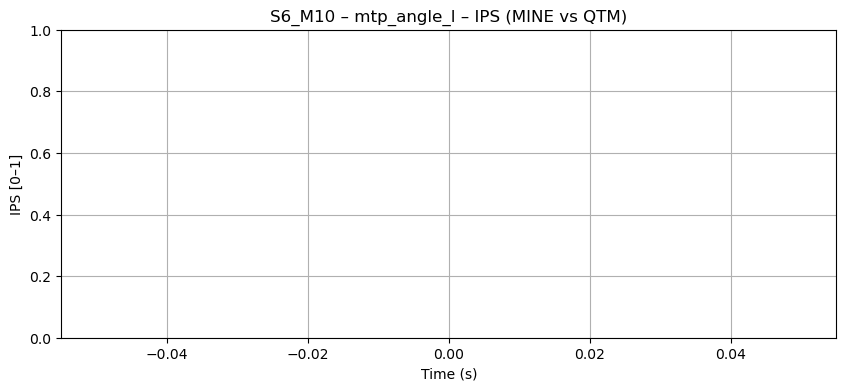

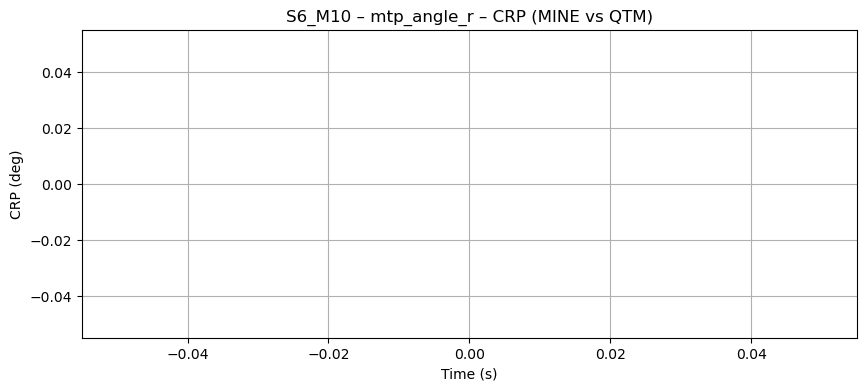

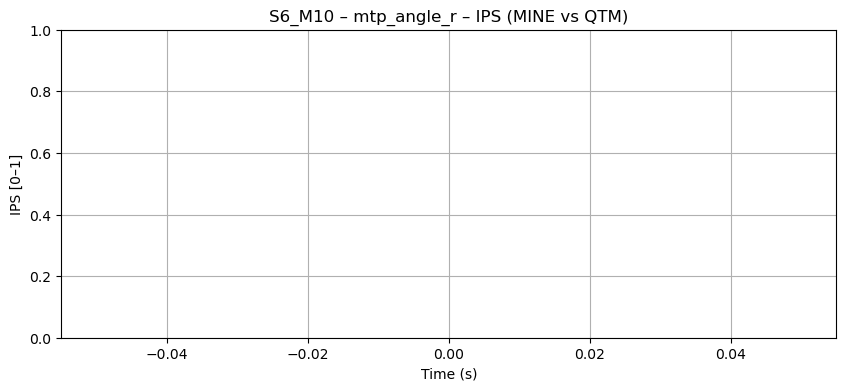

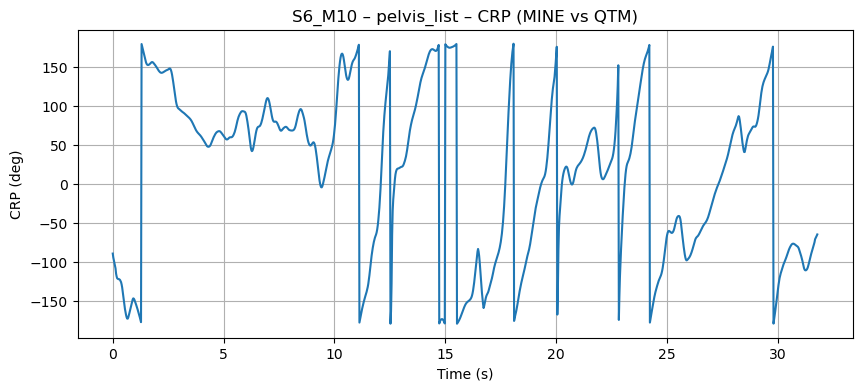

...

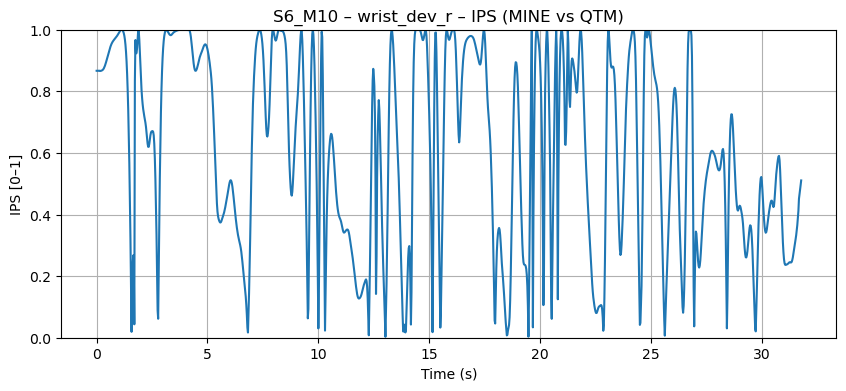

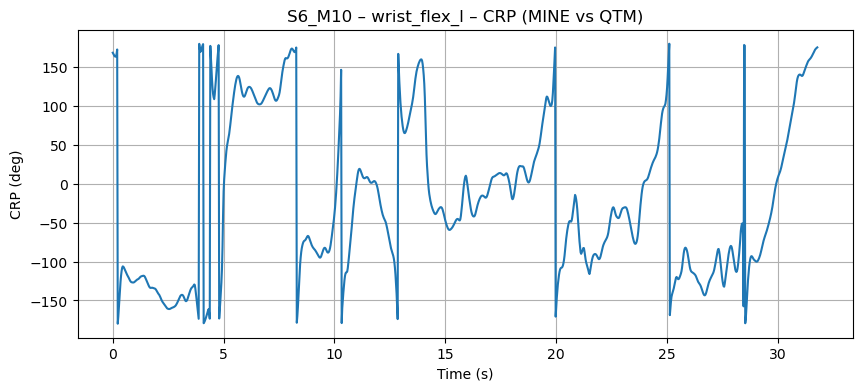

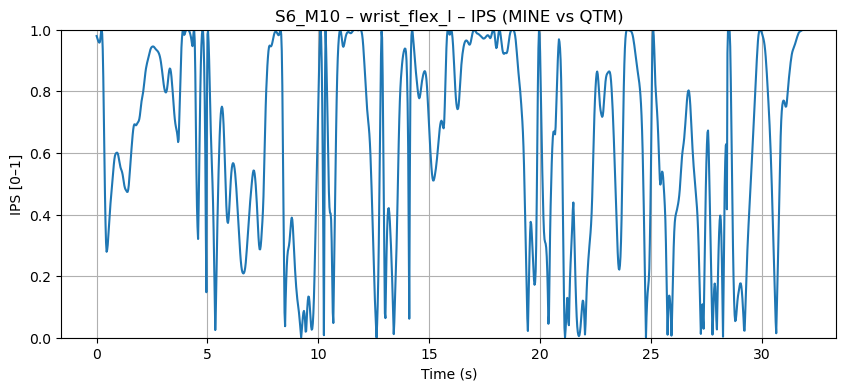

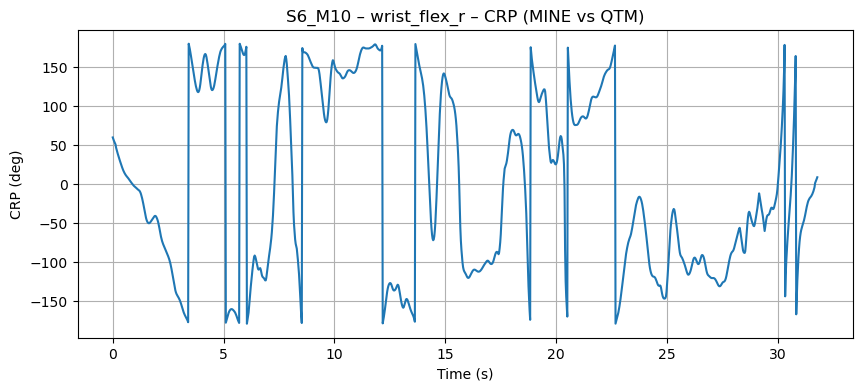

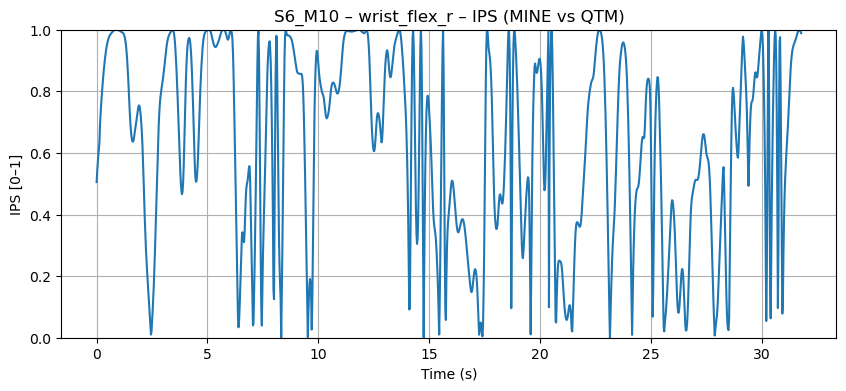

Computed CRP/IPS for 39 joint signals.
Saved combined results to: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/CRP_IPS_results.csv
  Per-pair CSV: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_crpips_pair_csvs/CRP_IPS_results_MINE_vs_QTM.csv
       Pair  Subject  Movement             Joint    N  fs_Hz  CRP_mean_linear_deg  CRP_mean_circular_deg  IPS_mean  IPS_pct_gt_0p8
MINE_vs_QTM        6        10     ankle_angle_l 1272   40.0           -11.432047            -104.442860  0.643934       41.981132
MINE_vs_QTM        6        10     ankle_angle_r 1272   40.0             5.652442             154.189751  0.624346       40.723270
MINE_vs_QTM        6        10         arm_add_l 1272   40.0            16.784561              78.259658  0.624443       37.657233
MINE_vs_QTM        6        10         arm_add_r 1272   40.0           -22.359578             -76.303584  0.654328       40.959119
MINE_vs_QTM        6        10        arm

In [113]:
# CRP & IPS across pair-tagged aligned files
from scipy.signal import butter, filtfilt, detrend, hilbert
from scipy.stats import circmean
from scipy.spatial.distance import cdist  # (not used here but harmless if left)
import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO

# USER CONFIG
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

mode = "single"           # "single" or "batch"

# SINGLE: pick one pair + one trial
single_pair      = ("MINE", "QTM")   # ("MINE","XSENS"), ("MINE","QTM"), ("XSENS","QTM")
single_subject   = 6
single_movement  = 10
single_base      = None                # e.g., "S4_M10" (overrides subject/movement if set)

# BATCH: choose pairs + subjects + movements (lists or "all")
selected_pairs = [
    ("MINE",  "XSENS"),
    ("MINE",  "QTM"),
    ("XSENS", "QTM"),
]
subjects  = [3,4,5,6]     # or "all"
movements = list(range(3,12))  # or [3,6,8] or "all"

do_plots  = True
save_plots = False  # save figures under _plots/<PAIR>/<trial>/
combined_csv = os.path.join(aligned_root, "CRP_IPS_results.csv")
per_pair_csv_dir = os.path.join(aligned_root, "_crpips_pair_csvs")

# Signal processing params
default_fs       = 40.0   # used only if we can't infer from time vector
lp_hz            = 6.0
hp_hz            = None   # e.g., 0.2 to remove drift before LP
amp_eps          = 1e-3
smooth_win_sec   = 0.25
phase_method     = "hilbert"  # "hilbert" or "phase_plane"

plt.rcParams["figure.figsize"] = (10, 4)

# IO helpers
def load_storage(fp):
    """Read .sto/.mot (after endheader) -> DataFrame with 'time'."""
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        pass
    elif "Time" in df.columns:
        df.rename(columns={"Time": "time"}, inplace=True)
    else:
        raise ValueError(f"No time column found in {os.path.basename(fp)}")
    return df

# Path resolver & discovery to support pair subfolders
def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    """
    Prefer new layout:
      <root>/<sysA>_vs_<sysB>/<base>_<sysA>_vs_<sysB>_<sys>_aligned.sto
    Fallback to legacy flat layout:
      <root>/<base>_<sys>_aligned.sto
    Returns (fpA, fpB) or (None, None).
    """
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B

    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B

    return None, None

def discover_trials(root, sysA, sysB, subjects_filter=None, movements_filter=None):
    """Find (S,M) that exist for BOTH systems (handles new+legacy layouts)."""
    trials = set()

    # New pair-tagged layout
    pd_ = pair_dir(root, sysA, sysB)
    if os.path.isdir(pd_):
        pat = re.compile(rf"^S(\d+)_M(\d+)_({re.escape(sysA)})_vs_({re.escape(sysB)})_({re.escape(sysA)}|{re.escape(sysB)})_aligned\.sto$")
        by_base = {}
        for fn in os.listdir(pd_):
            m = pat.match(fn)
            if not m: 
                continue
            s = int(m.group(1)); mv = int(m.group(2))
            base = f"S{s}_M{mv}"
            by_base.setdefault(base, set()).add(m.group(5))
        for base, have in by_base.items():
            if {sysA, sysB}.issubset(have):
                s = int(base.split("_")[0][1:]); mv = int(base.split("_")[1][1:])
                if subjects_filter not in (None, "all") and s not in subjects_filter: 
                    continue
                if movements_filter not in (None, "all") and mv not in movements_filter: 
                    continue
                trials.add((s, mv))

    # Legacy flat layout
    pat_legacy = re.compile(r"^S(\d+)_M(\d+)_([A-Z]+)_aligned\.sto$")
    have = {}
    for fn in os.listdir(root):
        m = pat_legacy.match(fn)
        if not m: 
            continue
        s = int(m.group(1)); mv = int(m.group(2)); sy = m.group(3)
        have.setdefault((s, mv), set()).add(sy)
    for (s, mv), sysset in have.items():
        if sysA in sysset and sysB in sysset:
            if subjects_filter not in (None, "all") and s not in subjects_filter: 
                continue
            if movements_filter not in (None, "all") and mv not in movements_filter: 
                continue
            trials.add((s, mv))

    return sorted(trials)

# CRP / IPS core
from scipy.signal import butter, filtfilt, detrend

def _butter_lowpass_filt(x, fs, fc=6.0, order=4, hp=None):
    """Zero-phase filter: optional high-pass (hp) then low-pass."""
    x = np.asarray(x, float)
    y = detrend(x, type='constant')  # remove DC offset
    if hp is not None and hp > 0:
        b, a = butter(order, hp/(fs/2), btype='highpass')
        pad = max(len(a), len(b)) * 3
        y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    b, a = butter(order, fc/(fs/2), btype='lowpass')
    pad = max(len(a), len(b)) * 3
    y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    return y

def _circular_moving_mean(angles_deg, win_samples):
    """Moving average on [-180,180]° circle."""
    ang = np.deg2rad(angles_deg)
    c = np.cos(ang); s = np.sin(ang)
    k = int(max(1, win_samples))
    c_ma = np.convolve(c, np.ones(k)/k, mode='same')
    s_ma = np.convolve(s, np.ones(k)/k, mode='same')
    return np.rad2deg(np.arctan2(s_ma, c_ma))

def compute_crp_ips(x, y, fs,
                    lp_hz=6.0, hp_hz=None,
                    amp_eps=1e-3,
                    smooth_win_sec=0.25,
                    method="hilbert"):
    """
    Steps:
      - zero-phase filtering (optional HP, then LP)
      - phase extraction (Hilbert or phase-plane)
      - CRP = wrapped phase(x) - phase(y) in degrees
      - mask low-amplitude samples
      - circular smoothing
      - IPS = |cos(CRP)|
    """
    x = _butter_lowpass_filt(x, fs, fc=lp_hz, order=4, hp=hp_hz)
    y = _butter_lowpass_filt(y, fs, fc=lp_hz, order=4, hp=hp_hz)

    if method == "phase_plane":
        vx = np.gradient(x) * fs
        vy = np.gradient(y) * fs
        xr = x / (np.sqrt(np.mean(x**2)) + 1e-12)
        yr = y / (np.sqrt(np.mean(y**2)) + 1e-12)
        vxr = vx / (np.sqrt(np.mean(vx**2)) + 1e-12)
        vyr = vy / (np.sqrt(np.mean(vy**2)) + 1e-12)
        phx = np.arctan2(vxr, xr)
        phy = np.arctan2(vyr, yr)
        amp_x = np.hypot(xr, vxr)
        amp_y = np.hypot(yr, vyr)
    else:
        ax = hilbert(x); ay = hilbert(y)
        phx = np.angle(ax); phy = np.angle(ay)
        amp_x = np.abs(ax);  amp_y = np.abs(ay)

    dphi = np.angle(np.exp(1j*(phx - phy)))
    crp_deg = np.degrees(dphi)

    bad = (amp_x < amp_eps) | (amp_y < amp_eps)
    crp_deg[bad] = np.nan

    win = int(round(smooth_win_sec * fs))
    if win > 1:
        sm = _circular_moving_mean(np.where(np.isnan(crp_deg), 0.0, crp_deg), win)
        crp_deg = np.where(bad, np.nan, sm)

    ips = np.abs(np.cos(np.deg2rad(crp_deg)))
    return crp_deg, ips

# Per-trial runner (pair-aware)
def run_case(subject, movement, sysA, sysB, rows):
    base = f"S{subject}_M{movement}"
    fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
    if not (fpA and fpB):
        print(f"Skip {base} {sysA} vs {sysB}: aligned files not found.")
        return

    dfA = load_storage(fpA)
    dfB = load_storage(fpB)

    # sync times (should already match)
    if not np.array_equal(dfA["time"].values, dfB["time"].values):
        common = np.intersect1d(dfA["time"].values, dfB["time"].values)
        if len(common) < 5:
            print(f"Skip {base} {sysA} vs {sysB}: time vectors don't match.")
            return
        dfA = dfA.set_index("time").loc[common].reset_index()
        dfB = dfB.set_index("time").loc[common].reset_index()

    t = dfA["time"].to_numpy(float)
    if len(t) < 3:
        print(f"Skip {base}: too few samples.")
        return
    # infer fs from time; fallback if needed
    dt = np.median(np.diff(t))
    fs = (1.0/dt) if (np.isfinite(dt) and dt > 0) else default_fs

    joints = [c for c in dfA.columns if c != "time" and c in dfB.columns]
    if not joints:
        print(f"Skip {base} {sysA} vs {sysB}: no common coordinates.")
        return

    plot_outdir = os.path.join(aligned_root, "_plots", f"{sysA}_vs_{sysB}", base)

    for j in joints:
        x = dfA[j].to_numpy(float)
        y = dfB[j].to_numpy(float)

        valid = np.isfinite(x) & np.isfinite(y)
        if valid.sum() < 10:
            continue
        i0 = np.argmax(valid)
        i1 = len(valid) - np.argmax(valid[::-1])
        tv, xv, yv = t[i0:i1], x[i0:i1], y[i0:i1]
        if len(tv) < 10:
            continue

        crp_deg, ips = compute_crp_ips(
            xv, yv, fs=fs,
            lp_hz=lp_hz, hp_hz=hp_hz,
            amp_eps=amp_eps,
            smooth_win_sec=smooth_win_sec,
            method=phase_method
        )

        mean_crp_lin  = float(np.nanmean(crp_deg))
        mean_crp_circ = float(circmean(crp_deg[~np.isnan(crp_deg)], high=180, low=-180)) if np.isfinite(np.nanmean(crp_deg)) else np.nan
        std_crp       = float(np.nanstd(crp_deg))
        mean_ips      = float(np.nanmean(ips))
        pct_hi_sync   = float(np.nanmean(ips > 0.8) * 100.0)

        rows.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject, "Movement": movement, "Joint": j,
            "N": len(tv),
            "fs_Hz": float(fs),
            "CRP_mean_linear_deg": mean_crp_lin,
            "CRP_mean_circular_deg": mean_crp_circ,
            "CRP_std_deg": std_crp,
            "IPS_mean": mean_ips,
            "IPS_pct_gt_0p8": pct_hi_sync
        })

        if do_plots:
            # CRP
            plt.figure()
            plt.plot(tv, crp_deg)
            plt.title(f"{base} – {j} – CRP ({sysA} vs {sysB})")
            plt.xlabel("Time (s)")
            plt.ylabel("CRP (deg)")
            plt.grid(True)
            if save_plots:
                os.makedirs(plot_outdir, exist_ok=True)
                plt.savefig(os.path.join(plot_outdir, f"{j}_CRP.png"), dpi=150, bbox_inches="tight"); plt.close()
            else:
                plt.show()

            # IPS
            plt.figure()
            plt.plot(tv, ips)
            plt.title(f"{base} – {j} – IPS ({sysA} vs {sysB})")
            plt.xlabel("Time (s)")
            plt.ylabel("IPS [0–1]")
            plt.ylim(0, 1)
            plt.grid(True)
            if save_plots:
                os.makedirs(plot_outdir, exist_ok=True)
                plt.savefig(os.path.join(plot_outdir, f"{j}_IPS.png"), dpi=150, bbox_inches="tight"); plt.close()
            else:
                plt.show()

# Run (single or batch)
rows = []
if mode.lower() == "single":
    if single_base:
        try:
            S = int(single_base.split("_")[0][1:])
            M = int(single_base.split("_")[1][1:])
        except Exception:
            raise ValueError("single_base must look like 'S4_M10'")
    else:
        S, M = single_subject, single_movement
    sysA, sysB = single_pair
    run_case(S, M, sysA, sysB, rows)
else:
    for (sysA, sysB) in selected_pairs:
        # autodiscover if "all" is used; otherwise use provided lists
        if subjects == "all" or movements == "all":
            trials = discover_trials(
                aligned_root, sysA, sysB,
                subjects_filter=(None if subjects=="all" else set(subjects)),
                movements_filter=(None if movements=="all" else set(movements)),
            )
        else:
            trials = [(s, m) for s in subjects for m in movements]
        if not trials:
            print(f"No trials found for {sysA} vs {sysB} with given filters.")
            continue
        for (S, M) in trials:
            run_case(S, M, sysA, sysB, rows)

# Results
res_df = pd.DataFrame(rows)
if res_df.empty:
    print("No CRP/IPS results produced. Check aligned files and coordinate names.")
else:
    res_df.sort_values(["Pair","Subject","Movement","Joint"], inplace=True)
    os.makedirs(per_pair_csv_dir, exist_ok=True)
    res_df.to_csv(combined_csv, index=False)
    print(f"Computed CRP/IPS for {len(res_df)} joint signals.")
    print(f"Saved combined results to: {combined_csv}")
    # per-pair CSVs
    for pair, subdf in res_df.groupby("Pair"):
        pair_csv = os.path.join(per_pair_csv_dir, f"CRP_IPS_results_{pair}.csv")
        subdf.to_csv(pair_csv, index=False)
        print(f"  Per-pair CSV: {pair_csv}")
    # quick peek
    cols = ["Pair","Subject","Movement","Joint","N","fs_Hz","CRP_mean_linear_deg","CRP_mean_circular_deg","IPS_mean","IPS_pct_gt_0p8"]
    print(res_df[cols].head(20).to_string(index=False))


## RMSE implementation

In [128]:
import os, re
import numpy as np
import pandas as pd
from io import StringIO
from scipy.signal import butter, filtfilt

# User Coonfiguration
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

# Choose "single" or "batch"
mode = "single"          # "single" or "batch"

# SINGLE: one trial + one pair
single_pair      = ("MINE", "QTM")   # ("MINE","XSENS"), ("MINE","QTM"), ("XSENS","QTM")
single_subject   = 6
single_movement  = 6
single_base      = None                 # e.g., "S4_M10" (overrides subject/movement)

# BATCH: choose pairs + subjects + movements (lists or "all")
selected_pairs = [
    ("MINE",  "XSENS"),
    ("MINE",  "QTM"),
    ("XSENS", "QTM"),
]
subjects  = [3,4,5,6]          # or "all"
movements = list(range(3,12))  # or [3,6,8] or "all"

# Filter settings (filtered-only output)
filt_fc_hz = 6.0     # low-pass cutoff (Hz)
filt_order = 4
default_fs = 40.0    # used if sampling rate can't be inferred from time

# Output
out_csv = os.path.join(aligned_root, "RMSE_results_FILTERED_only.csv")

# Notebook display
show_table   = True    # print per-joint table
show_summary = True    # print compact summaries
max_rows     = 200     # None = unlimited
log_each_trial = True  # progress logs

if filt_fc_hz is None:
    raise ValueError("filt_fc_hz must be set (filtered-only output).")

# Helpers
def load_storage(fp):
    """Read .sto/.mot with 'endheader' and return DataFrame (time + columns)."""
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        pass
    elif "Time" in df.columns:
        df.rename(columns={"Time":"time"}, inplace=True)
    else:
        raise ValueError(f"No time column found in {os.path.basename(fp)}")
    return df

def angle_diff_deg(a, b):
    """Shortest signed angular difference in degrees, in (-180, 180]."""
    a = np.asarray(a, float); b = np.asarray(b, float)
    d = (a - b + 180.0) % 360.0 - 180.0
    d[d == -180.0] = 180.0
    return d

def rmse_bias_sd(err):
    """Return (RMSE, bias, SD) ignoring NaNs."""
    e = np.asarray(err, float)
    m = np.nanmean(e)
    s = np.nanstd(e, ddof=0)
    r = np.sqrt(m*m + s*s)
    return r, m, s

def filtfilt_lowpass(x, fc, fs, order=4):
    x = np.asarray(x, float)
    b, a = butter(order, fc/(fs/2), btype="lowpass")
    # 'gust' is robust, but ensure enough points for padding
    padlen = min(max(1, 3*max(len(a),len(b))), max(1, len(x)-1))
    return filtfilt(b, a, x, method="gust", padlen=padlen)

# Pair-aware path helpers
def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    """
    Prefer pair-tagged layout:
      <root>/<sysA>_vs_<sysB>/<base>_<sysA>_vs_<sysB>_<sys>_aligned.sto
    Fallback to legacy flat layout:
      <root>/<base>_<sys>_aligned.sto
    Returns (fpA, fpB) or (None, None).
    """
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B
    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B
    return None, None

def discover_trials(root, sysA, sysB, subjects_filter=None, movements_filter=None):
    """Find (S,M) that exist for BOTH systems (supports new+legacy layouts)."""
    trials = set()

    # New pair-tagged layout
    pd_ = pair_dir(root, sysA, sysB)
    if os.path.isdir(pd_):
        pat = re.compile(rf"^S(\d+)_M(\d+)_({re.escape(sysA)})_vs_({re.escape(sysB)})_({re.escape(sysA)}|{re.escape(sysB)})_aligned\.sto$")
        by_base = {}
        for fn in os.listdir(pd_):
            m = pat.match(fn)
            if not m: 
                continue
            s = int(m.group(1)); mv = int(m.group(2))
            base = f"S{s}_M{mv}"
            by_base.setdefault(base, set()).add(m.group(5))
        for base, have in by_base.items():
            if {sysA, sysB}.issubset(have):
                s = int(base.split("_")[0][1:])
                mv = int(base.split("_")[1][1:])
                if subjects_filter not in (None, "all") and s not in subjects_filter: 
                    continue
                if movements_filter not in (None, "all") and mv not in movements_filter: 
                    continue
                trials.add((s, mv))

    # Legacy flat layout
    pat_legacy = re.compile(r"^S(\d+)_M(\d+)_([A-Z]+)_aligned\.sto$")
    have = {}
    for fn in os.listdir(root):
        m = pat_legacy.match(fn)
        if not m: 
            continue
        s = int(m.group(1)); mv = int(m.group(2)); sy = m.group(3)
        have.setdefault((s, mv), set()).add(sy)
    for (s, mv), sysset in have.items():
        if sysA in sysset and sysB in sysset:
            if subjects_filter not in (None, "all") and s not in subjects_filter: 
                continue
            if movements_filter not in (None, "all") and mv not in movements_filter: 
                continue
            trials.add((s, mv))

    return sorted(trials)

# RMSE per-trial (pair-aware)
def evaluate_one(subject, movement, sysA, sysB, rows):
    base = f"S{subject}_M{movement}"
    fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
    if not (fpA and fpB):
        print(f"Skip {base} {sysA} vs {sysB}: aligned files not found.")
        return

    A = load_storage(fpA)
    B = load_storage(fpB)

    # Align time vectors safely
    if not np.array_equal(A["time"].values, B["time"].values):
        common = np.intersect1d(A["time"].values, B["time"].values)
        if len(common) < 5:
            print(f"Skip {base} {sysA} vs {sysB}: time vectors don't match.")
            return
        A = A.set_index("time").loc[common].reset_index()
        B = B.set_index("time").loc[common].reset_index()

    # Infer fs from time (fallback to default_fs)
    t = A["time"].to_numpy(float)
    dt = np.median(np.diff(t)) if len(t) > 1 else np.nan
    fs = (1.0/dt) if (np.isfinite(dt) and dt > 0) else default_fs

    joints = [c for c in A.columns if c != "time" and c in B.columns]
    if not joints:
        print(f"Skip {base} {sysA} vs {sysB}: no common coordinates.")
        return

    if log_each_trial:
        print(f"Running {base} {sysA} vs {sysB} … joints={len(joints)} (fs≈{fs:.2f} Hz)")

    for j in joints:
        av = A[j].to_numpy(float)
        bv = B[j].to_numpy(float)

        # Keep frames where both are finite
        valid = np.isfinite(av) & np.isfinite(bv)
        if valid.sum() < 5:
            continue
        av = av[valid]; bv = bv[valid]

        # Filter both signals
        af = filtfilt_lowpass(av, filt_fc_hz, fs, order=filt_order)
        bf = filtfilt_lowpass(bv, filt_fc_hz, fs, order=filt_order)

        # Angle-safe error AFTER filtering
        err_f = angle_diff_deg(af, bf)
        rmse_f, bias_f, sd_f = rmse_bias_sd(err_f)

        rows.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject,
            "Movement": movement,
            "Joint": j,
            "N": int(len(err_f)),
            "RMSE_filt_deg": float(rmse_f),
            "Bias_filt_deg": float(bias_f),
            "SD_filt_deg": float(sd_f),
            "Filtered_fc_Hz": float(filt_fc_hz),
            "Filter_order": int(filt_order),
            "fs_Hz": float(fs),
        })

# Run (single or batch)
rows = []
if mode.lower() == "single":
    if single_base:
        try:
            s = int(single_base.split("_")[0][1:])
            m = int(single_base.split("_")[1][1:])
        except Exception:
            raise ValueError("single_base must look like 'S4_M10'")
    else:
        s, m = single_subject, single_movement
    sysA, sysB = single_pair
    evaluate_one(s, m, sysA, sysB, rows)
else:
    for (sysA, sysB) in selected_pairs:
        if subjects == "all" or movements == "all":
            trials = discover_trials(
                aligned_root, sysA, sysB,
                subjects_filter=(None if subjects=="all" else set(subjects)),
                movements_filter=(None if movements=="all" else set(movements)),
            )
        else:
            trials = [(s, m) for s in subjects for m in movements]
        if not trials:
            print(f"No trials found for {sysA} vs {sysB} with given filters.")
            continue
        for (s, m) in trials:
            evaluate_one(s, m, sysA, sysB, rows)

# Results
rmse_df = pd.DataFrame(rows)
if rmse_df.empty:
    print("No filtered RMSE results produced. Check aligned files / joint names.")
else:
    rmse_df.sort_values(["Pair","Subject","Movement","Joint"], inplace=True)
    rmse_df.to_csv(out_csv, index=False)
    print(f"\nComputed RMSE for {len(rmse_df)} joint signals.")
    print(f"Saved filtered RMSE results to: {out_csv}\n")

    # Notebook table display
    if max_rows is not None:
        pd.set_option("display.max_rows", max_rows)
    pd.set_option("display.max_columns", None)
    pd.set_option("display.width", 120)

    if show_table:
        cols_print = [
            "Pair","Subject","Movement","Joint","N",
            "RMSE_filt_deg","Bias_filt_deg","SD_filt_deg",
            "Filtered_fc_Hz","Filter_order","fs_Hz"
        ]
        print("=== Per-joint RMSE (filtered) ===")
        print(rmse_df[cols_print].to_string(index=False))
        print()

    if show_summary:
        # Mean RMSE by Pair & Joint
        g1 = (rmse_df
              .groupby(["Pair","Joint"], as_index=False)["RMSE_filt_deg"]
              .mean()
              .sort_values(["Pair","RMSE_filt_deg"]))
        print("=== Summary: mean RMSE (deg) by Pair & Joint ===")
        print(g1.to_string(index=False))
        print()

        # Mean RMSE by Pair & Subject
        g2 = (rmse_df
              .groupby(["Pair","Subject"], as_index=False)["RMSE_filt_deg"]
              .mean()
              .sort_values(["Pair","Subject"]))
        print("=== Summary: mean RMSE (deg) by Pair & Subject ===")
        print(g2.to_string(index=False))
        print()

        # Trials counted per Pair
        g3 = (rmse_df
              .drop_duplicates(subset=["Pair","Subject","Movement"])
              .groupby("Pair", as_index=False)
              .size()
              .rename(columns={"size":"n_trials"}))
        print("=== Trials per Pair (unique SxM) ===")
        print(g3.to_string(index=False))
        print()


Running S6_M6 MINE vs QTM … joints=39 (fs≈40.00 Hz)

Computed RMSE for 39 joint signals.
Saved filtered RMSE results to: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/RMSE_results_FILTERED_only.csv

=== Per-joint RMSE (filtered) ===
       Pair  Subject  Movement             Joint    N  RMSE_filt_deg  Bias_filt_deg  SD_filt_deg  Filtered_fc_Hz  Filter_order  fs_Hz
MINE_vs_QTM        6         6     ankle_angle_l 1823      29.719119     -29.671294     1.685333             6.0             4   40.0
MINE_vs_QTM        6         6     ankle_angle_r 1823      33.989028     -33.167291     7.428651             6.0             4   40.0
MINE_vs_QTM        6         6         arm_add_l 1823      13.672427      10.975716     8.152848             6.0             4   40.0
MINE_vs_QTM        6         6         arm_add_r 1823      10.291948       8.502762     5.798899             6.0             4   40.0
MINE_vs_QTM        6         6        arm_flex_l 1823       4.49982


===== Subject S3 • Movement M5 • Joint elbow_flex_r =====
TAM: 1.9067  (Used derivative fallback: False)
RMSE (deg, filtered): 91.440 | Bias: -77.111 | SD: 49.145 | r: -0.015 | R²: 0.000
CRP mean (linear deg): -5.989 | CRP mean (circular deg): -36.031 | CRP SD (deg): 94.657
IPS mean: 0.605 | %IPS>0.8: 36.9%
MINE (filtered)  -> Mean: 0.775, SD: 0.913, ROM: 5.458, Peak: 5.306, Min: -0.153
QTM  (filtered)  -> Mean: 77.886, SD: 49.122, ROM: 147.010, Peak: 149.620, Min: 2.610


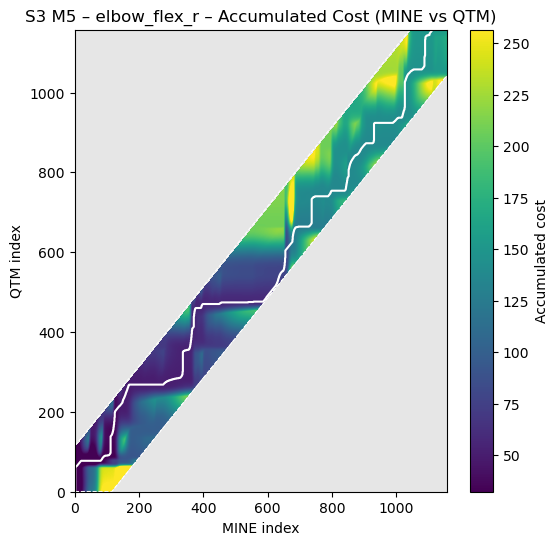

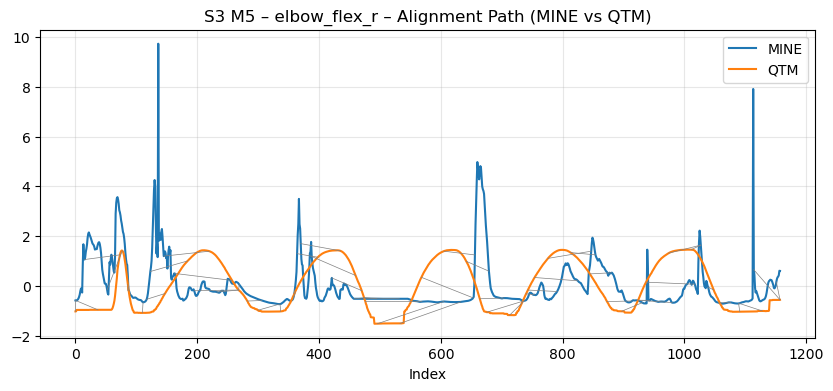

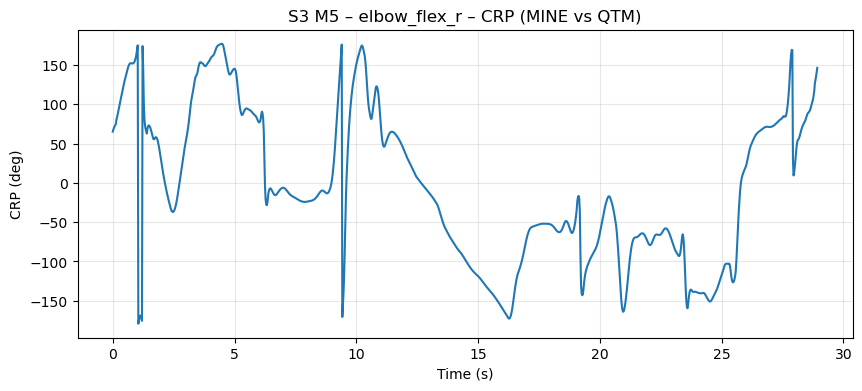

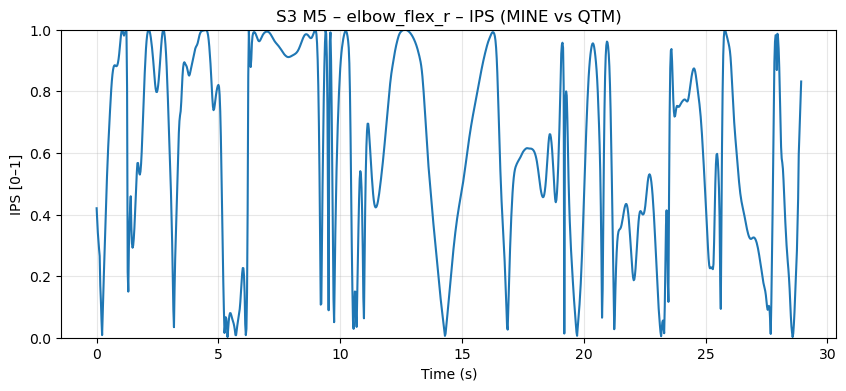

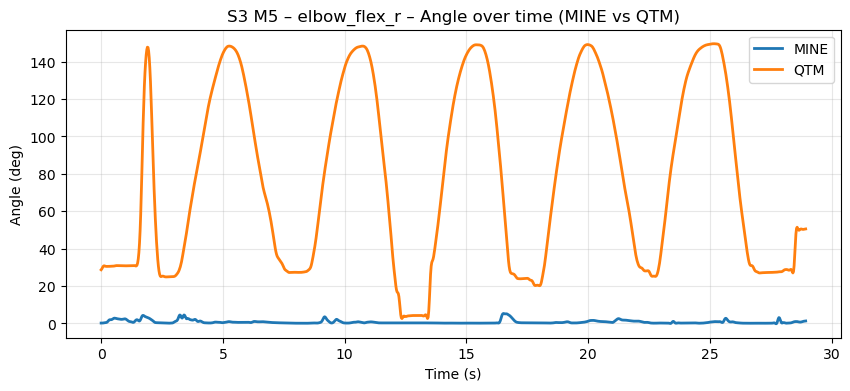

[WARN] Skip S4_M5 MINE vs QTM: aligned files not found.

===== Subject S5 • Movement M5 • Joint elbow_flex_r =====
TAM: 1.4302  (Used derivative fallback: False)
RMSE (deg, filtered): 84.537 | Bias: -66.658 | SD: 51.993 | r: -0.240 | R²: 0.058
CRP mean (linear deg): 8.518 | CRP mean (circular deg): 142.952 | CRP SD (deg): 118.538
IPS mean: 0.703 | %IPS>0.8: 52.8%
MINE (filtered)  -> Mean: 6.690, SD: 6.567, ROM: 28.490, Peak: 28.652, Min: 0.162
QTM  (filtered)  -> Mean: 73.348, SD: 50.022, ROM: 144.402, Peak: 149.216, Min: 4.814


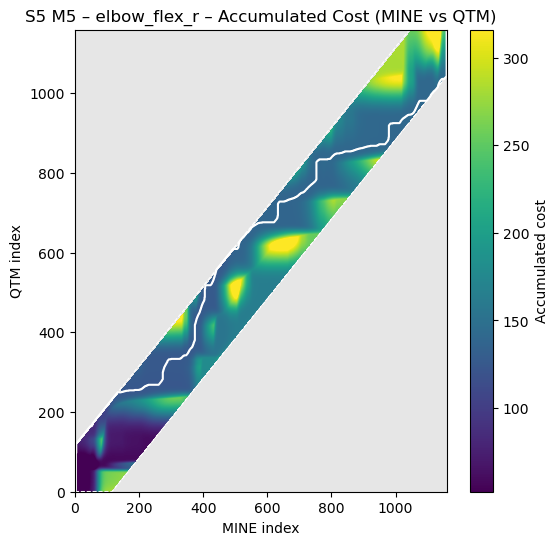

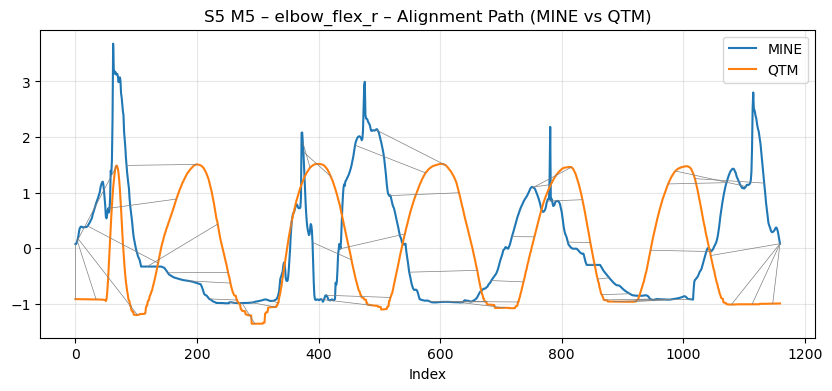

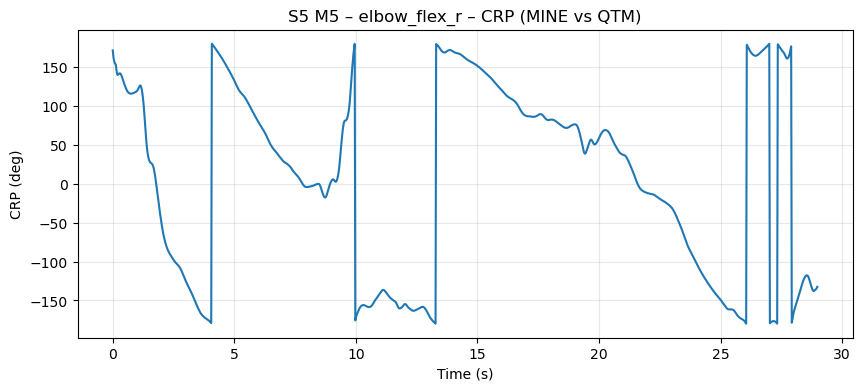

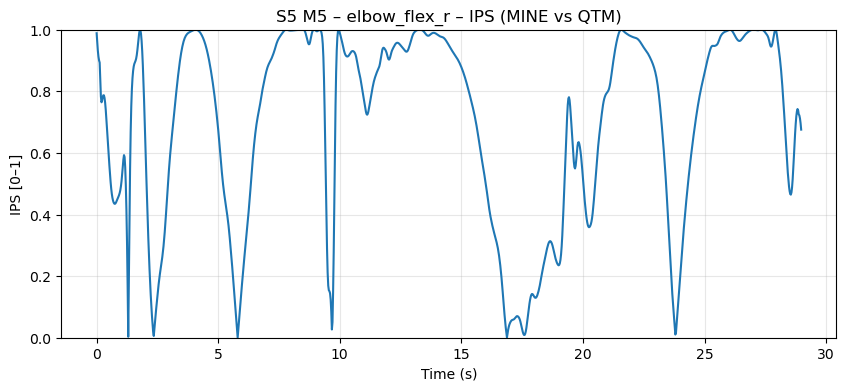

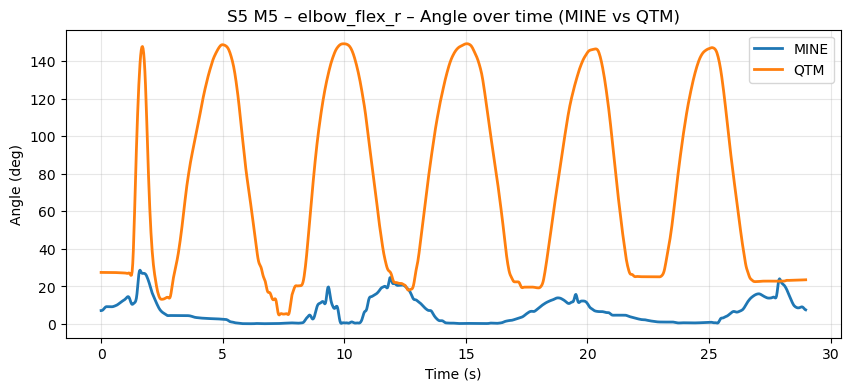


===== Subject S6 • Movement M5 • Joint elbow_flex_r =====
TAM: 1.9501  (Used derivative fallback: False)
RMSE (deg, filtered): 90.274 | Bias: -79.750 | SD: 42.300 | r: -0.115 | R²: 0.013
CRP mean (linear deg): 50.953 | CRP mean (circular deg): 132.948 | CRP SD (deg): 107.290
IPS mean: 0.671 | %IPS>0.8: 45.4%
MINE (filtered)  -> Mean: 0.401, SD: 0.373, ROM: 2.533, Peak: 2.527, Min: -0.006
QTM  (filtered)  -> Mean: 80.151, SD: 42.255, ROM: 147.151, Peak: 150.391, Min: 3.241


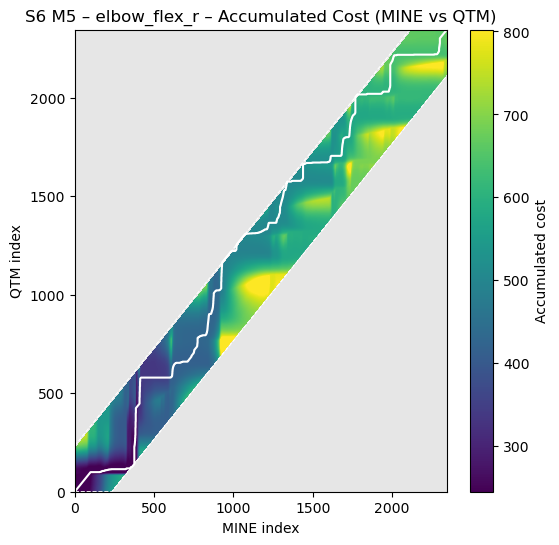

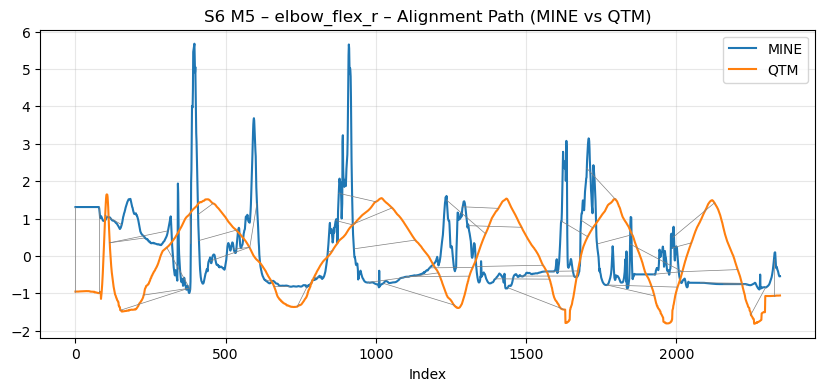

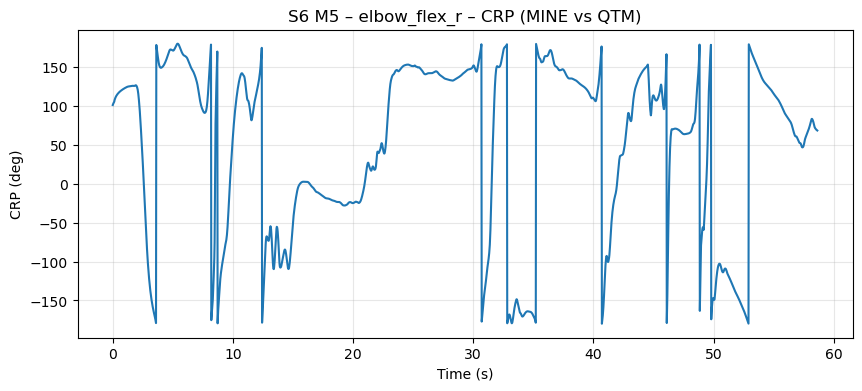

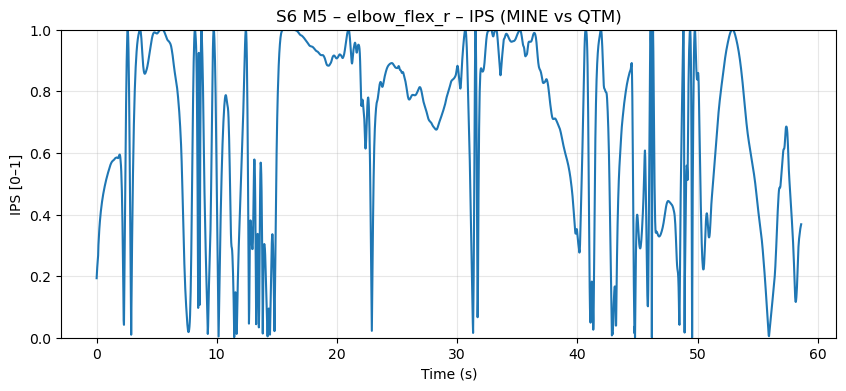

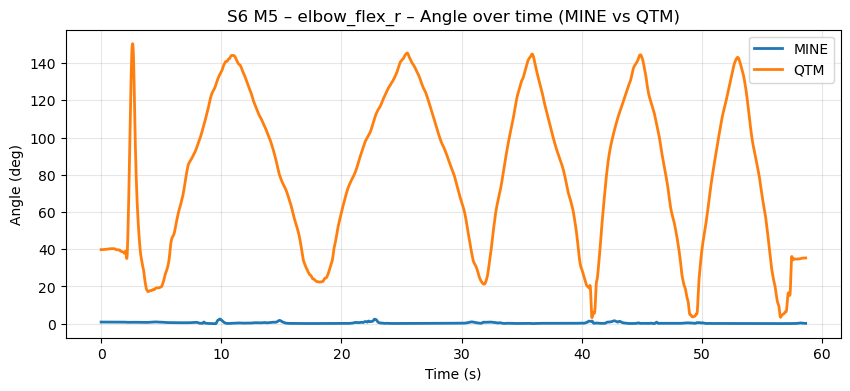


Saved DTW/TAM per-subject: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/DTW_TAM_S3toS6_M5_elbow_flex_r.csv
Saved RMSE per-subject: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/RMSE_filtered_S3toS6_M5_elbow_flex_r.csv
Saved per-system stats: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/SystemStats_filtered_S3toS6_M5_elbow_flex_r.csv
Saved CRP/IPS per-subject: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/CRP_IPS_S3toS6_M5_elbow_flex_r.csv

===================== All-subjects summaries =====================

TAM (Mean ± SD across subjects):
               TAM_article
AllSubjects  1.762 ± 0.288

Agreement metrics (filtered) MINE vs QTM (Mean ± SD across subjects):
             RMSE_filt_deg    Bias_filt_deg     SD_filt_deg       Corr_filt       R2_filt
AllSubjects  88.75 ± 3.695  -74.5

In [168]:
# ============================================================
# Joint-by-joint validation across subjects (MINE vs QTM only)
# DTW/TAM + filtered RMSE (angle-safe) + CRP & IPS
# Per-subject plots + report, then All-subjects Mean ± SD
# + Angle-over-time plot for visual comparison (raw + filtered)
# ============================================================

import os, re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from scipy.spatial.distance import cdist
from scipy.signal import butter, filtfilt, detrend, hilbert
from scipy.stats import circmean

# ===================== USER CONFIG ==========================
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

mode = "joint_batch"   # "single", "batch", or "joint_batch" (USE THIS MODE)

# ---- joint_batch configuration ----
target_subjects = [3, 4, 5, 6]
target_movement = 5               # e.g., M3
target_joint    = "elbow_flex_r"     # exact column name present in BOTH systems

# plotting
do_plots              = True
save_plots            = False  # if True, saves to _plots/<PAIR>/<trial>/
show_filtered_overlay = True   # draw filtered overlay in the angle-over-time plot

# Output folder for this joint-batch job
outdir_joint = os.path.join(aligned_root, "_jointbatch_selected")

# DTW / TAM options
band_ratio      = 0.10
try_derivative  = True
tam_high_thresh = 1.5
cost_mode       = "swdtw"          # "euclidean" or "swdtw"
smooth_win      = 21               # odd; for "swdtw" internal smoothing
alpha_mix       = 0.5              # amp/derivative mix for "swdtw"
hv_penalty      = 0.10             # extra penalty for H/V steps (encourage diagonal)

# RMSE filter options (filtered-only RMSE; also used for system stats)
default_fs  = 40.0
filt_fc_hz  = 6.0
filt_order  = 4

# CRP/IPS options (internally filters again; that’s intended)
lp_hz            = 6.0
hp_hz            = None            # set e.g. 0.2 to remove drift pre-LP
amp_eps          = 1e-3
smooth_win_sec   = 0.25
phase_method     = "hilbert"       # "hilbert" or "phase_plane"

plt.rcParams["figure.figsize"] = (8, 4)

# ===================== HELPERS (IO) ========================

def load_storage(fp):
    """Read .sto/.mot with 'endheader' and return DataFrame (time + columns)."""
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i; break
    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        pass
    elif "Time" in df.columns:
        df.rename(columns={"Time":"time"}, inplace=True)
    else:
        raise ValueError(f"No time column found in {os.path.basename(fp)}")
    return df

def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    """Prefer pair-tagged layout; fallback to legacy flat layout."""
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B
    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B
    return None, None

def ensure_dir(p):
    os.makedirs(p, exist_ok=True); return p

# ===================== HELPERS (signal) ====================

def zscore(x):
    x = np.asarray(x, float)
    m = np.nanmean(x); s = np.nanstd(x)
    return (x - m) / (s if s > 0 else 1.0)

def angle_diff_deg(a, b):
    """Shortest signed angular difference in degrees, in (-180, 180]."""
    a = np.asarray(a, float); b = np.asarray(b, float)
    d = (a - b + 180.0) % 360.0 - 180.0
    d[d == -180.0] = 180.0
    return d

def rmse_bias_sd(err):
    """Return (RMSE, bias, SD) ignoring NaNs."""
    e = np.asarray(err, float)
    m = np.nanmean(e)
    s = np.nanstd(e, ddof=0)
    r = np.sqrt(m*m + s*s)
    return r, m, s

def filtfilt_lowpass(x, fc, fs, order=4):
    x = np.asarray(x, float)
    b, a = butter(order, fc/(fs/2), btype="lowpass")
    padlen = min(max(1, 3*max(len(a),len(b))), max(1, len(x)-1))
    return filtfilt(b, a, x, method="gust", padlen=padlen)

# ===================== DTW CORE ============================

def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')

def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    """
    Local cost matrix D (n x m).
      - mode="euclidean": |x_i - y_j|  (or derivative if use_derivative=True)
      - mode="swdtw":     alpha*|x_s - y_s|^2 + (1-alpha)*|dx_s - dy_s|^2
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0]); ys = np.diff(y, prepend=y[0])
            return cdist(xs.reshape(-1,1), ys.reshape(-1,1), metric="euclidean")
        return cdist(x.reshape(-1,1), y.reshape(-1,1), metric="euclidean")
    # swDTW (smoothed amplitude + derivative)
    xs = _smooth1d(x, smooth_win)
    ys = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])
    A = (xs[:, None]  - ys[None, :])**2
    B = (dxs[:, None] - dys[:, None].T)**2  # shape fix alternative: (dxs[:, None] - dys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2    # keep original correct form
    return alpha*A + (1.0 - alpha)*B

def compute_dtw_windowed(x, y, band_ratio=0.10, use_derivative=False,
                         cost_mode="swdtw", smooth_win=21, alpha=0.5,
                         hv_penalty=0.10):
    """
    Sakoe-Chiba band DTW with (optional) swDTW local cost and an extra
    penalty added to horizontal/vertical steps (encourage diagonal).
    Returns (accumulated_cost_matrix, optimal_path)
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    n, m = len(x), len(y)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win,
                           alpha=alpha, use_derivative=use_derivative)

    # Apply band (indices within +/-band around diagonal)
    band = int(np.ceil(band_ratio * max(n, m)))
    INF = np.inf
    M = np.full((n, m), INF, float)
    A = np.full((n, m), INF, float)  # accumulated cost

    for i in range(n):
        j_center = int(round((i * (m-1)) / max(1, (n-1))))
        j_lo = max(0, j_center - band)
        j_hi = min(m-1, j_center + band)
        M[i, j_lo:j_hi+1] = D[i, j_lo:j_hi+1]

    if not np.isfinite(M).any():
        return A, []

    # DP
    if np.isfinite(M[0,0]):
        A[0,0] = M[0,0]
    for i in range(1, n):
        if np.isfinite(M[i,0]):
            A[i,0] = A[i-1,0] + M[i,0]*(1.0 + hv_penalty)
    for j in range(1, m):
        if np.isfinite(M[0,j]):
            A[0,j] = A[0,j-1] + M[0,j]*(1.0 + hv_penalty)

    for i in range(1, n):
        j_center = int(round((i * (m-1)) / max(1, (n-1))))
        j_lo = max(1, j_center - band)
        j_hi = min(m-1, j_center + band)
        for j in range(j_lo, j_hi+1):
            if not np.isfinite(M[i,j]): 
                continue
            d = M[i,j]
            a_diag = A[i-1, j-1] + d
            a_up   = A[i-1, j]   + d*(1.0 + hv_penalty)
            a_left = A[i,   j-1] + d*(1.0 + hv_penalty)
            A[i,j] = min(a_diag, a_up, a_left)

    # Backtrack
    i, j = n-1, m-1
    if not np.isfinite(A[i,j]):
        # find best valid endpoint in band
        cand = np.argwhere(np.isfinite(A))
        if cand.size == 0:
            return A, []
        i, j = cand[np.argmin(A[cand[:,0], cand[:,1]])]
    path = [(i,j)]
    while (i > 0) or (j > 0):
        choices = []
        if i>0 and j>0: choices.append((A[i-1,j-1], i-1, j-1))
        if i>0:         choices.append((A[i-1,j],   i-1, j))
        if j>0:         choices.append((A[i,  j-1], i,   j-1))
        cost, i, j = min(choices, key=lambda t: t[0])
        path.append((i,j))
    path.reverse()
    return A, path

def tam_from_path(path, N, M):
    """TAM = advance/N + delay/M + (1 - phase/min(N,M)) with a 1-step correction."""
    adv = delay = phase = 0
    for (i0,j0),(i1,j1) in zip(path[:-1], path[1:]):
        di, dj = i1 - i0, j1 - j0
        if   di == 1 and dj == 0: adv   += 1   # horizontal
        elif di == 0 and dj == 1: delay += 1   # vertical
        elif di == 1 and dj == 1: phase += 1   # diagonal
    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)

# ===================== PLOTS ===============================

def plot_accumulated_cost_matrix(acc, path, joint, subj, mov, sysA, sysB,
                                 outdir=None, band_ratio=None):
    M = np.where(np.isfinite(acc), acc, np.nan)
    cmap = plt.cm.viridis.copy()
    cmap.set_bad(color="#e6e6e6")
    vmin = np.nanpercentile(M, 2)
    vmax = np.nanpercentile(M, 98)
    plt.figure(figsize=(6,6))
    im = plt.imshow(M.T, origin='lower', aspect='auto', cmap=cmap, vmin=vmin, vmax=vmax)
    if path:
        px, py = zip(*path)
        plt.plot(px, py, color='white', linewidth=1.5)
    if band_ratio is not None:
        n, m = acc.shape
        band = int(max(n, m) * band_ratio)
        i = np.arange(n)
        lo = np.clip(i - band, 0, m-1)
        hi = np.clip(i + band, 0, m-1)
        plt.plot(i, lo, 'w--', lw=0.8)
        plt.plot(i, hi, 'w--', lw=0.8)
    plt.title(f"S{subj} M{mov} – {joint} – Accumulated Cost ({sysA} vs {sysB})")
    plt.xlabel(f"{sysA} index"); plt.ylabel(f"{sysB} index")
    cb = plt.colorbar(im); cb.set_label("Accumulated cost")
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_ACC.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_alignment(x, y, path, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(10,4))
    plt.plot(x, label=sysA); plt.plot(y, label=sysB)
    step = max(1, len(path)//50) if path else 1
    if path:
        for (i, j) in path[::step]:
            plt.plot([i, j], [x[i], y[j]], color='gray', linewidth=0.5)
    plt.title(f"S{subj} M{mov} – {joint} – Alignment Path ({sysA} vs {sysB})")
    plt.xlabel("Index"); plt.legend(); plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_PATH.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_crp(tv, crp_deg, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(10,4))
    plt.plot(tv, crp_deg)
    plt.title(f"S{subj} M{mov} – {joint} – CRP ({sysA} vs {sysB})")
    plt.xlabel("Time (s)"); plt.ylabel("CRP (deg)")
    plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_CRP.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_ips(tv, ips, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(10,4))
    plt.plot(tv, ips)
    plt.title(f"S{subj} M{mov} – {joint} – IPS ({sysA} vs {sysB})")
    plt.xlabel("Time (s)"); plt.ylabel("IPS [0–1]")
    plt.ylim(0, 1); plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_IPS.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_angles_over_time(tv, x_raw, y_raw, fs, joint, subj, mov, sysA, sysB,
                          overlay_filtered=True, outdir=None):
    """
    Visual comparison of joint angle over time for both systems.
    Plots ONLY low-pass filtered traces. Legend shows 'MINE' and 'QTM'.
    """
    # Compute filtered traces
    xf = filtfilt_lowpass(x_raw, filt_fc_hz, fs, order=filt_order)
    yf = filtfilt_lowpass(y_raw, filt_fc_hz, fs, order=filt_order)

    plt.figure(figsize=(10,4))
    plt.plot(tv, xf, label=f"{sysA}", linewidth=2)
    plt.plot(tv, yf, label=f"{sysB}", linewidth=2)

    plt.title(f"S{subj} M{mov} – {joint} – Angle over time ({sysA} vs {sysB})")
    plt.xlabel("Time (s)")
    plt.ylabel("Angle (deg)")
    plt.grid(True, alpha=0.3)
    plt.legend(loc="best")

    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_ANGLE_TIME.png"),
                    dpi=150, bbox_inches="tight")
        plt.close()
    else:
        plt.show()

# ===================== AGREEMENT & SYSTEM STATS ============

def compute_pair_metrics_filtered(x_raw, y_raw, fs):
    """Filter (low-pass), then angle-safe error -> RMSE/Bias/SD. Also r and R²."""
    xf = filtfilt_lowpass(x_raw, filt_fc_hz, fs, order=filt_order)
    yf = filtfilt_lowpass(y_raw, filt_fc_hz, fs, order=filt_order)

    err_f = angle_diff_deg(xf, yf)
    rmse_f, bias_f, sd_f = rmse_bias_sd(err_f)

    if np.nanstd(xf) == 0 or np.nanstd(yf) == 0:
        r = np.nan
    else:
        r = float(np.corrcoef(xf, yf)[0,1])
    r2 = (r**2) if np.isfinite(r) else np.nan

    return {
        "RMSE_filt_deg": float(rmse_f),
        "Bias_filt_deg": float(bias_f),
        "SD_filt_deg":   float(sd_f),
        "Corr_filt":     float(r) if np.isfinite(r) else np.nan,
        "R2_filt":       float(r2) if np.isfinite(r2) else np.nan,
        "N":             int(np.sum(np.isfinite(err_f)))
    }, xf, yf

def system_stats(x):
    """Descriptive stats for a single (filtered) system trace."""
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 1:
        return dict(Mean=np.nan, SD=np.nan, ROM=np.nan, Peak=np.nan, Min=np.nan)
    return dict(
        Mean=float(np.mean(x)),
        SD=float(np.std(x)),
        ROM=float(np.max(x) - np.min(x)),
        Peak=float(np.max(x)),
        Min=float(np.min(x)),
    )

# ===================== CRP / IPS ===========================

def _butter_lowpass_filt(x, fs, fc=6.0, order=4, hp=None):
    """Zero-phase filter: optional high-pass (hp) then low-pass."""
    x = np.asarray(x, float)
    y = detrend(x, type='constant')
    if hp is not None and hp > 0:
        b, a = butter(order, hp/(fs/2), btype='highpass')
        pad = max(len(a), len(b)) * 3
        y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    b, a = butter(order, fc/(fs/2), btype='lowpass')
    pad = max(len(a), len(b)) * 3
    y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    return y

def _circular_moving_mean(angles_deg, win_samples):
    ang = np.deg2rad(angles_deg)
    c = np.cos(ang); s = np.sin(ang)
    k = int(max(1, win_samples))
    c_ma = np.convolve(c, np.ones(k)/k, mode='same')
    s_ma = np.convolve(s, np.ones(k)/k, mode='same')
    return np.rad2deg(np.arctan2(s_ma, c_ma))

def compute_crp_ips(x, y, fs,
                    lp_hz=6.0, hp_hz=None,
                    amp_eps=1e-3,
                    smooth_win_sec=0.25,
                    method="hilbert"):
    """CRP (deg) and IPS [0–1] after filtering + circular smoothing."""
    x = _butter_lowpass_filt(x, fs, fc=lp_hz, order=4, hp=hp_hz)
    y = _butter_lowpass_filt(y, fs, fc=lp_hz, order=4, hp=hp_hz)

    if method == "phase_plane":
        vx = np.gradient(x) * fs
        vy = np.gradient(y) * fs
        xr = x / (np.sqrt(np.mean(x**2)) + 1e-12)
        yr = y / (np.sqrt(np.mean(y**2)) + 1e-12)
        vxr = vx / (np.sqrt(np.mean(vx**2)) + 1e-12)
        vyr = vy / (np.sqrt(np.mean(vy**2)) + 1e-12)
        phx = np.arctan2(vxr, xr)
        phy = np.arctan2(vyr, yr)
        amp_x = np.hypot(xr, vxr)
        amp_y = np.hypot(yr, vyr)
    else:
        ax = hilbert(x); ay = hilbert(y)
        phx = np.angle(ax); phy = np.angle(ay)
        amp_x = np.abs(ax);  amp_y = np.abs(ay)

    dphi = np.angle(np.exp(1j*(phx - phy)))
    crp_deg = np.degrees(dphi)

    bad = (amp_x < amp_eps) | (amp_y < amp_eps)
    crp_deg[bad] = np.nan

    win = int(round(smooth_win_sec * fs))
    if win > 1:
        sm = _circular_moving_mean(np.where(np.isnan(crp_deg), 0.0, crp_deg), win)
        crp_deg = np.where(bad, np.nan, sm)

    ips = np.abs(np.cos(np.deg2rad(crp_deg)))
    return crp_deg, ips

# ===================== SUMMARIES ===========================

def mean_sd(df, cols, group=None, digits=3):
    """
    Return a dataframe of 'mean ± sd' strings for the numeric columns in `cols`.
    Works on older pandas where GroupBy.std/mean don't support `numeric_only`.
    """
    if df.empty:
        return pd.DataFrame()

    df2 = df.copy()
    for c in cols:
        if c not in df2.columns: df2[c] = np.nan
        df2[c] = pd.to_numeric(df2[c], errors="coerce")

    if group is None:
        mu = df2[cols].mean()
        sd = df2[cols].std(ddof=1)
        out = (mu.round(digits).astype(str) + " ± " + sd.round(digits).astype(str)).to_frame().T
        out.index = ["AllSubjects"]
        return out
    else:
        g = df2.groupby(group, dropna=False)[cols]
        mu = g.mean()
        sd = g.std(ddof=1)
        out = mu.round(digits).astype(str) + " ± " + sd.round(digits).astype(str)
        return out

# ===================== MAIN RUNNER (joint_batch) ===========

def run_joint_across_subjects(movement, joint_name, subjects_list):
    sysA, sysB = "MINE", "QTM"  # fixed as requested

    rows_dtw_tam  = []
    rows_rmse     = []
    rows_sysstats = []
    rows_crpips   = []

    for subject in subjects_list:
        base = f"S{subject}_M{movement}"
        fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
        if not (fpA and fpB):
            print(f"[WARN] Skip {base} {sysA} vs {sysB}: aligned files not found.")
            continue

        dfA = load_storage(fpA)
        dfB = load_storage(fpB)

        # time align
        if not np.array_equal(dfA["time"].values, dfB["time"].values):
            common = np.intersect1d(dfA["time"].values, dfB["time"].values)
            if len(common) < 5:
                print(f"[WARN] Skip {base}: insufficient common time samples.")
                continue
            dfA = dfA.set_index("time").loc[common].reset_index()
            dfB = dfB.set_index("time").loc[common].reset_index()

        if joint_name not in dfA.columns or joint_name not in dfB.columns:
            print(f"[WARN] {base}: joint '{joint_name}' not found in both systems.")
            continue

        # infer fs
        t = dfA["time"].to_numpy(float)
        dt = np.median(np.diff(t)) if len(t) > 1 else np.nan
        fs = (1.0/dt) if (np.isfinite(dt) and dt > 0) else default_fs

        # raw vectors and trim to shared valid region
        xr = dfA[joint_name].to_numpy(float)
        yr = dfB[joint_name].to_numpy(float)
        valid = np.isfinite(xr) & np.isfinite(yr)
        if valid.sum() < 5:
            print(f"[WARN] {base} {joint_name}: too few valid samples.")
            continue
        i0 = np.argmax(valid)
        i1 = len(valid) - np.argmax(valid[::-1])
        xrw = xr[i0:i1]; yrw = yr[i0:i1]
        tv  = t[i0:i1]
        if len(xrw) < 5 or len(yrw) < 5:
            print(f"[WARN] {base} {joint_name}: too short after trimming.")
            continue

        # --- DTW/TAM on z-scored copies ---
        xz = zscore(xrw); yz = zscore(yrw)
        acc, path = compute_dtw_windowed(
            xz, yz,
            band_ratio=band_ratio,
            use_derivative=False,
            cost_mode=cost_mode,
            smooth_win=smooth_win,
            alpha=alpha_mix,
            hv_penalty=hv_penalty
        )
        tam = tam_from_path(path, len(xz), len(yz))
        used_derivative = False
        if try_derivative and tam > tam_high_thresh:
            accd, pathd = compute_dtw_windowed(
                xz, yz,
                band_ratio=band_ratio,
                use_derivative=True if cost_mode=="euclidean" else False,
                cost_mode=cost_mode,
                smooth_win=smooth_win,
                alpha=alpha_mix,
                hv_penalty=hv_penalty
            )
            tamd = tam_from_path(pathd, len(xz), len(yz))
            if tamd < tam:
                tam, acc, path = tamd, accd, pathd
                used_derivative = True

        # --- Filtered RMSE/Bias/SD (+ Corr, R2) on filtered traces ---
        metr, xf, yf = compute_pair_metrics_filtered(xrw, yrw, fs=fs)

        # --- Per-system descriptive stats (filtered) ---
        statsA = system_stats(xf); statsB = system_stats(yf)

        # --- CRP & IPS ---
        crp_deg, ips = compute_crp_ips(
            xrw, yrw, fs=fs,
            lp_hz=lp_hz, hp_hz=hp_hz,
            amp_eps=amp_eps,
            smooth_win_sec=smooth_win_sec,
            method=phase_method
        )

        # ============ PER-SUBJECT REPORT & PLOTS ============
        print(f"\n===== Subject S{subject} • Movement M{movement} • Joint {joint_name} =====")
        print(f"TAM: {tam:.4f}  (Used derivative fallback: {used_derivative})")
        print(f"RMSE (deg, filtered): {metr['RMSE_filt_deg']:.3f} | "
              f"Bias: {metr['Bias_filt_deg']:.3f} | SD: {metr['SD_filt_deg']:.3f} | "
              f"r: {metr['Corr_filt'] if np.isfinite(metr['Corr_filt']) else np.nan:.3f} | "
              f"R²: {metr['R2_filt'] if np.isfinite(metr['R2_filt']) else np.nan:.3f}")

        mean_crp_lin  = float(np.nanmean(crp_deg))
        mean_crp_circ = (float(circmean(crp_deg[~np.isnan(crp_deg)], high=180, low=-180))
                         if np.sum(~np.isnan(crp_deg))>0 else np.nan)
        std_crp       = float(np.nanstd(crp_deg))
        mean_ips      = float(np.nanmean(ips))
        pct_hi_sync   = float(np.nanmean(ips > 0.8) * 100.0)
        print(f"CRP mean (linear deg): {mean_crp_lin:.3f} | "
              f"CRP mean (circular deg): {mean_crp_circ:.3f} | "
              f"CRP SD (deg): {std_crp:.3f}")
        print(f"IPS mean: {mean_ips:.3f} | %IPS>0.8: {pct_hi_sync:.1f}%")

        print("MINE (filtered)  -> "
              f"Mean: {statsA['Mean']:.3f}, SD: {statsA['SD']:.3f}, ROM: {statsA['ROM']:.3f}, "
              f"Peak: {statsA['Peak']:.3f}, Min: {statsA['Min']:.3f}")
        print("QTM  (filtered)  -> "
              f"Mean: {statsB['Mean']:.3f}, SD: {statsB['SD']:.3f}, ROM: {statsB['ROM']:.3f}, "
              f"Peak: {statsB['Peak']:.3f}, Min: {statsB['Min']:.3f}")

        if do_plots:
            plot_out = os.path.join(aligned_root, "_plots", f"{sysA}_vs_{sysB}", base)
            # DTW visualisations
            plot_accumulated_cost_matrix(
                acc, path, joint_name, subject, movement, sysA, sysB,
                outdir=(plot_out if save_plots else None),
                band_ratio=band_ratio
            )
            plot_alignment(
                xz, yz, path, joint_name, subject, movement, sysA, sysB,
                outdir=(plot_out if save_plots else None)
            )
            # CRP & IPS
            plot_crp(tv, crp_deg, joint_name, subject, movement, sysA, sysB,
                     outdir=(plot_out if save_plots else None))
            plot_ips(tv, ips, joint_name, subject, movement, sysA, sysB,
                     outdir=(plot_out if save_plots else None))
            # Angle-over-time (raw + optional filtered overlay)
            plot_angles_over_time(
                tv, xrw, yrw, fs, joint_name, subject, movement, sysA, sysB,
                overlay_filtered=show_filtered_overlay,
                outdir=(plot_out if save_plots else None)
            )

        # ============ COLLECT ROWS FOR CSVs/SUMMARIES ============
        rows_dtw_tam.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject,
            "Movement": movement,
            "Joint": joint_name,
            "N_A": len(xrw),
            "N_B": len(yrw),
            "TAM_article": float(tam),
            "Used_derivative_DTW": bool(used_derivative),
        })
        rows_rmse.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject, "Movement": movement, "Joint": joint_name,
            "fs_Hz": float(fs), **metr
        })
        rows_sysstats.append({
            "System":"MINE", "Subject":subject, "Movement":movement, "Joint":joint_name, **statsA
        })
        rows_sysstats.append({
            "System":"QTM",  "Subject":subject, "Movement":movement, "Joint":joint_name, **statsB
        })
        rows_crpips.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject, "Movement": movement, "Joint": joint_name,
            "N": int(len(crp_deg[~np.isnan(crp_deg)])),
            "fs_Hz": float(fs),
            "CRP_mean_linear_deg": mean_crp_lin,
            "CRP_mean_circular_deg": mean_crp_circ,
            "CRP_std_deg": std_crp,
            "IPS_mean": mean_ips,
            "IPS_pct_gt_0p8": pct_hi_sync
        })

    # --- Build DataFrames ---
    df_dtw_tam  = pd.DataFrame(rows_dtw_tam)
    df_rmse     = pd.DataFrame(rows_rmse)
    df_sysstats = pd.DataFrame(rows_sysstats)
    df_crpips   = pd.DataFrame(rows_crpips)

    # ---- Save outputs ----
    ensure_dir(outdir_joint)
    tag = f"S{target_subjects[0]}toS{target_subjects[-1]}_M{movement}_{joint_name}"

    if not df_dtw_tam.empty:
        csv_dtw = os.path.join(outdir_joint, f"DTW_TAM_{tag}.csv")
        df_dtw_tam.sort_values(["Subject"], inplace=True)
        df_dtw_tam.to_csv(csv_dtw, index=False)
        print(f"\nSaved DTW/TAM per-subject: {csv_dtw}")
    else:
        print("\nDTW/TAM: no results.")

    if not df_rmse.empty:
        csv_rmse = os.path.join(outdir_joint, f"RMSE_filtered_{tag}.csv")
        df_rmse.sort_values(["Subject"], inplace=True)
        df_rmse.to_csv(csv_rmse, index=False)
        print(f"Saved RMSE per-subject: {csv_rmse}")
    else:
        print("RMSE: no results.")

    if not df_sysstats.empty:
        csv_sys = os.path.join(outdir_joint, f"SystemStats_filtered_{tag}.csv")
        df_sysstats.sort_values(["System","Subject"], inplace=True)
        df_sysstats.to_csv(csv_sys, index=False)
        print(f"Saved per-system stats: {csv_sys}")
    else:
        print("System stats: no results.")

    if not df_crpips.empty:
        csv_crp = os.path.join(outdir_joint, f"CRP_IPS_{tag}.csv")
        df_crpips.sort_values(["Subject"], inplace=True)
        df_crpips.to_csv(csv_crp, index=False)
        print(f"Saved CRP/IPS per-subject: {csv_crp}")
    else:
        print("CRP/IPS: no results.")

    # ---- All-subjects summaries (Mean ± SD) ----
    print("\n===================== All-subjects summaries =====================")
    if not df_dtw_tam.empty:
        print("\nTAM (Mean ± SD across subjects):")
        print(mean_sd(df_dtw_tam, cols=["TAM_article"]).to_string(index=True))

    if not df_rmse.empty:
        print("\nAgreement metrics (filtered) MINE vs QTM (Mean ± SD across subjects):")
        print(mean_sd(df_rmse, cols=["RMSE_filt_deg","Bias_filt_deg","SD_filt_deg","Corr_filt","R2_filt"]).to_string(index=True))

    if not df_crpips.empty:
        print("\nCRP & IPS (Mean ± SD across subjects):")
        print(mean_sd(df_crpips, cols=["CRP_mean_linear_deg","CRP_mean_circular_deg","CRP_std_deg","IPS_mean","IPS_pct_gt_0p8"]).to_string(index=True))

    if not df_sysstats.empty:
        print("\nPer-system descriptive stats of FILTERED angle (Mean ± SD across subjects):")
        print(mean_sd(df_sysstats, cols=["Mean","SD","ROM","Peak","Min"], group="System").to_string())

    return df_dtw_tam, df_rmse, df_crpips, df_sysstats

# ===================== CONTROLLER ==========================

if mode.lower() == "joint_batch":
    _ = run_joint_across_subjects(target_movement, target_joint, target_subjects)

elif mode.lower() == "single":
    single_pair      = ("MINE","QTM")
    single_subject   = 6
    single_movement  = 10
    single_base      = None
    raise SystemExit("Use mode='joint_batch' for the requested analysis.")

elif mode.lower() == "batch":
    raise SystemExit("Use mode='joint_batch' for the requested analysis.")

else:
    raise ValueError("Unknown mode. Use 'joint_batch'.")



===== Subject S3 • Movement M9 • Joint ankle_angle_r =====
TAM: 1.0435  (Used derivative fallback: False)
ALIGNED RMSE (deg, filtered): 19.361 | Bias: -18.373 | SD: 6.107 | r: 0.849 | R²: 0.721
(Raw pre-DTW RMSE: 21.473 deg)
CRP mean (linear deg): 2.333 | CRP mean (circular deg): 4.080 | CRP SD (deg): 40.434
IPS mean: 0.873 | %IPS>0.8: 80.6%
MINE (filtered, aligned) -> Mean: 2.014, SD: 10.828, ROM: 52.964, Peak: 22.693, Min: -30.270
QTM  (filtered, aligned) -> Mean: 20.387, SD: 7.053, ROM: 37.301, Peak: 29.764, Min: -7.538


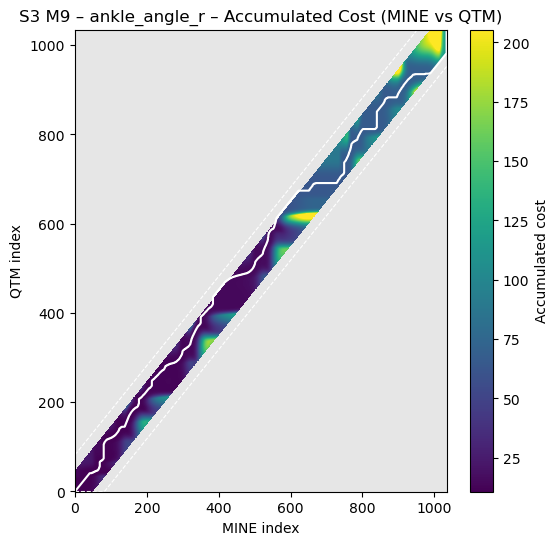

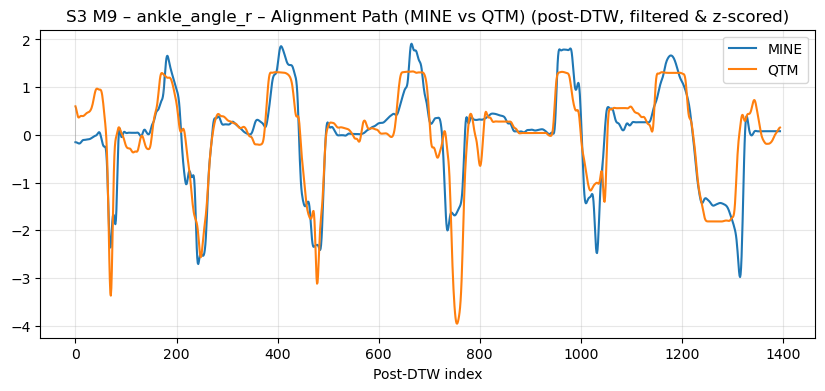

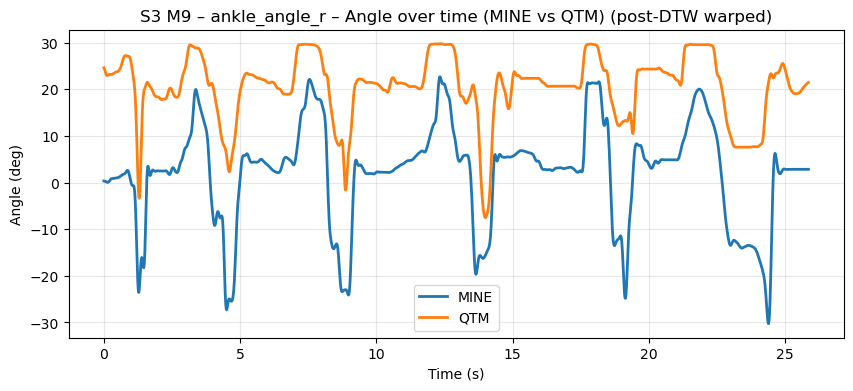

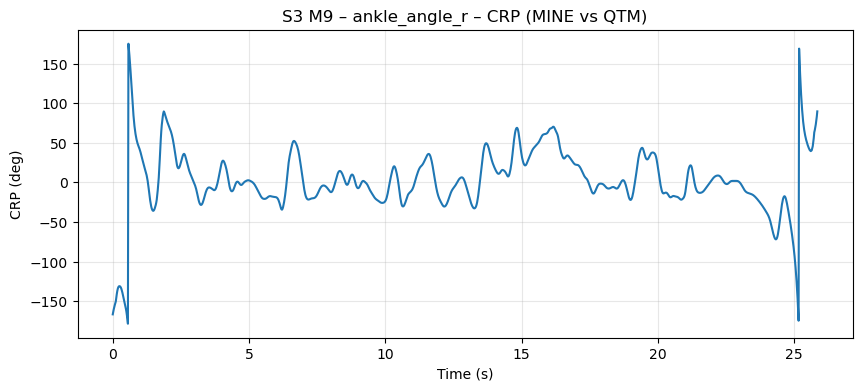

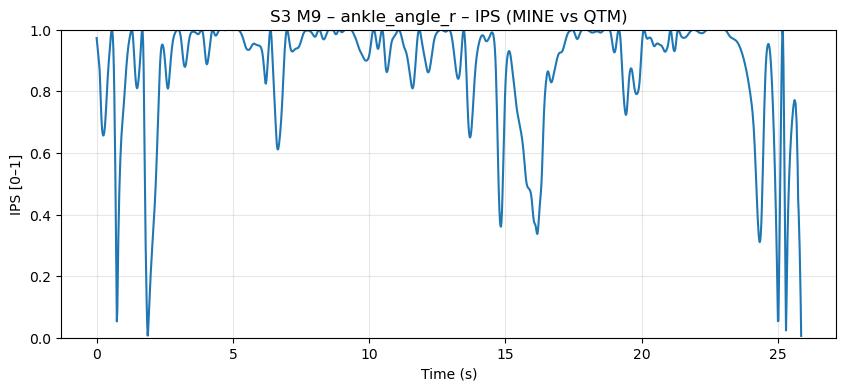


===== Subject S4 • Movement M9 • Joint ankle_angle_r =====
TAM: 0.9879  (Used derivative fallback: False)
ALIGNED RMSE (deg, filtered): 23.028 | Bias: -22.064 | SD: 6.593 | r: 0.636 | R²: 0.404
(Raw pre-DTW RMSE: 23.093 deg)
CRP mean (linear deg): -6.186 | CRP mean (circular deg): -8.592 | CRP SD (deg): 76.256
IPS mean: 0.770 | %IPS>0.8: 64.4%
MINE (filtered, aligned) -> Mean: 2.428, SD: 8.533, ROM: 49.206, Peak: 20.176, Min: -29.031
QTM  (filtered, aligned) -> Mean: 24.492, SD: 5.688, ROM: 26.629, Peak: 29.849, Min: 3.220


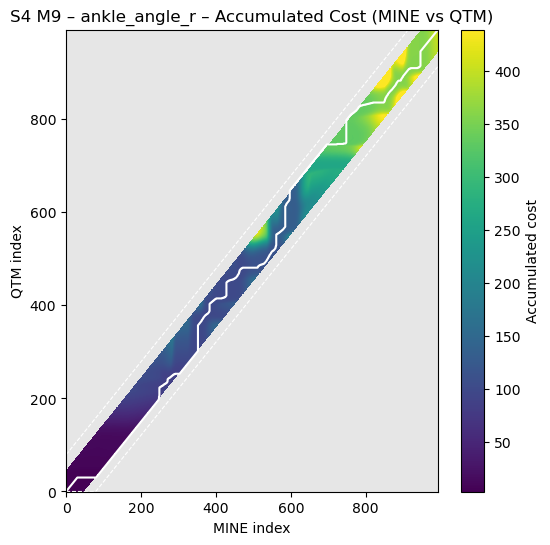

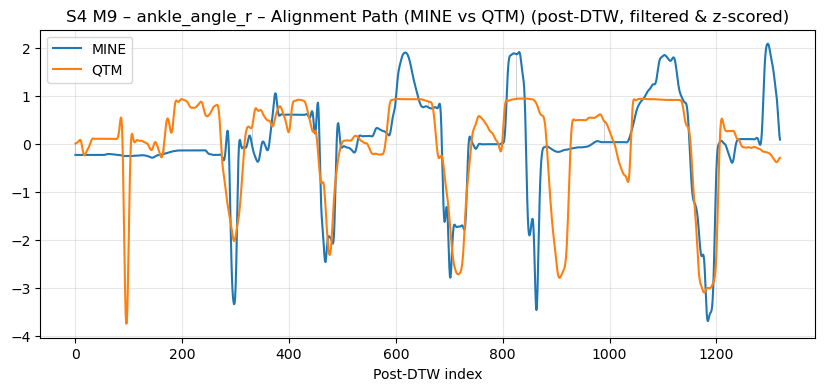

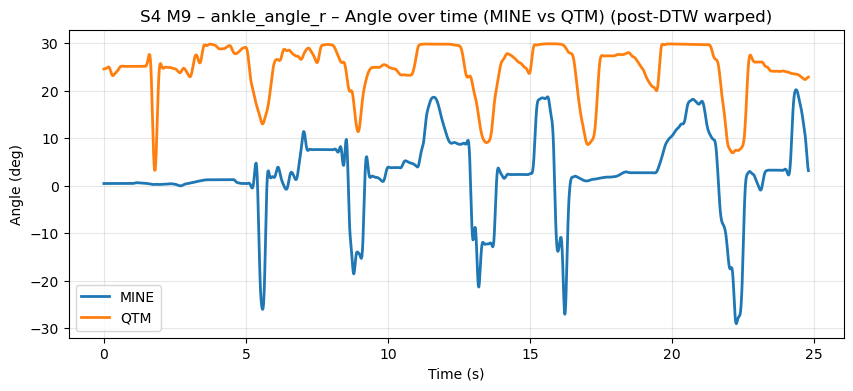

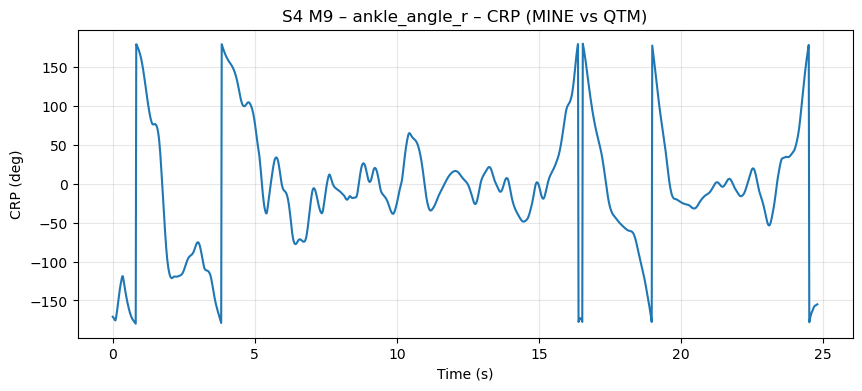

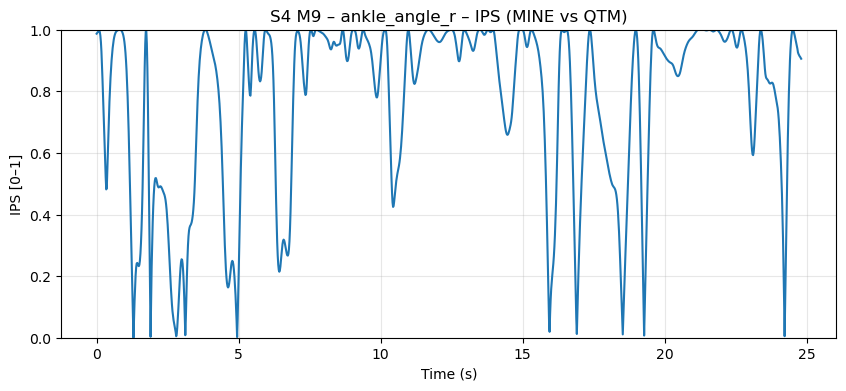


===== Subject S5 • Movement M9 • Joint ankle_angle_r =====
TAM: 0.9753  (Used derivative fallback: False)
ALIGNED RMSE (deg, filtered): 25.047 | Bias: -24.044 | SD: 7.018 | r: 0.866 | R²: 0.750
(Raw pre-DTW RMSE: 26.920 deg)
CRP mean (linear deg): -11.516 | CRP mean (circular deg): -11.923 | CRP SD (deg): 39.301
IPS mean: 0.887 | %IPS>0.8: 83.4%
MINE (filtered, aligned) -> Mean: 0.257, SD: 12.259, ROM: 47.184, Peak: 16.231, Min: -30.953
QTM  (filtered, aligned) -> Mean: 24.301, SD: 7.199, ROM: 24.297, Peak: 29.873, Min: 5.576


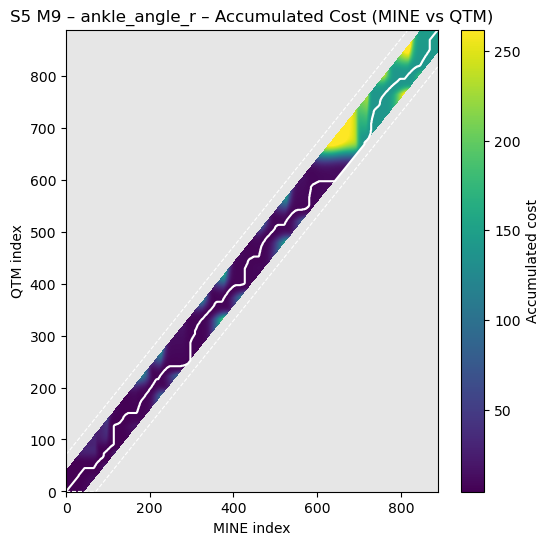

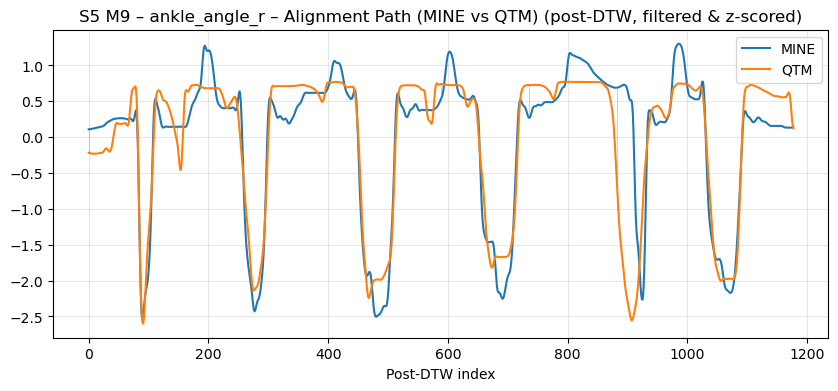

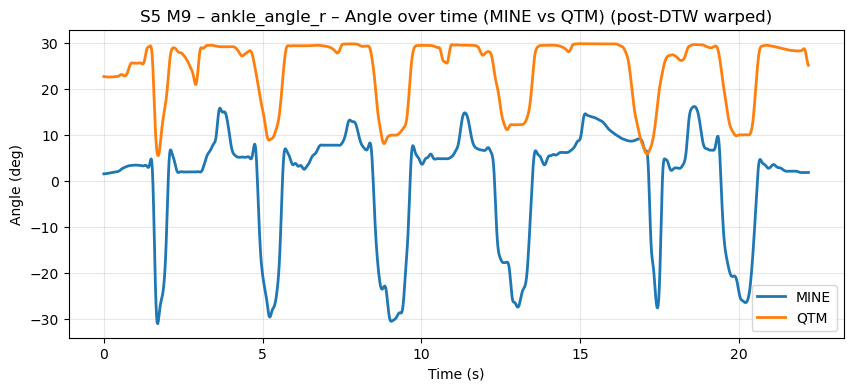

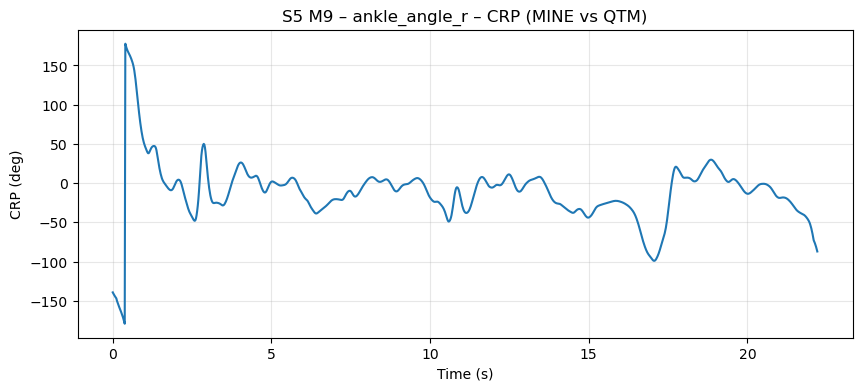

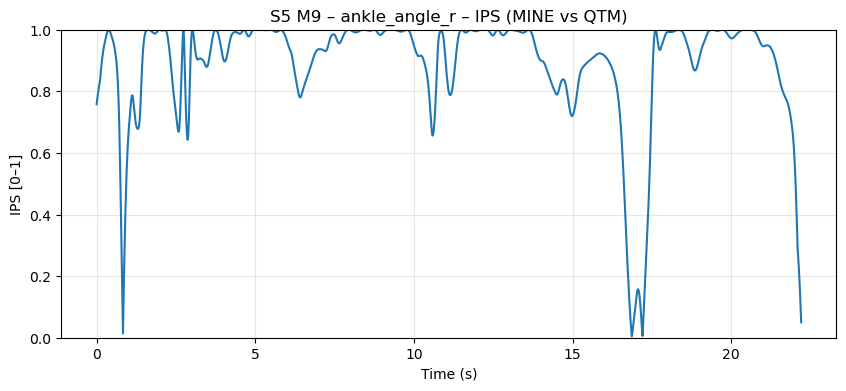


===== Subject S6 • Movement M9 • Joint ankle_angle_r =====
TAM: 1.4267  (Used derivative fallback: False)
ALIGNED RMSE (deg, filtered): 29.941 | Bias: -27.537 | SD: 11.755 | r: 0.713 | R²: 0.508
(Raw pre-DTW RMSE: 29.635 deg)
CRP mean (linear deg): -9.206 | CRP mean (circular deg): -8.589 | CRP SD (deg): 39.471
IPS mean: 0.877 | %IPS>0.8: 82.2%
MINE (filtered, aligned) -> Mean: -0.071, SD: 14.816, ROM: 62.233, Peak: 22.810, Min: -39.423
QTM  (filtered, aligned) -> Mean: 27.466, SD: 5.065, ROM: 24.622, Peak: 30.017, Min: 5.395


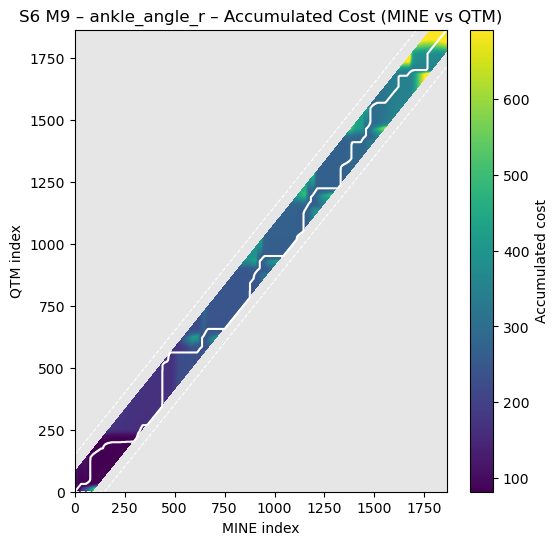

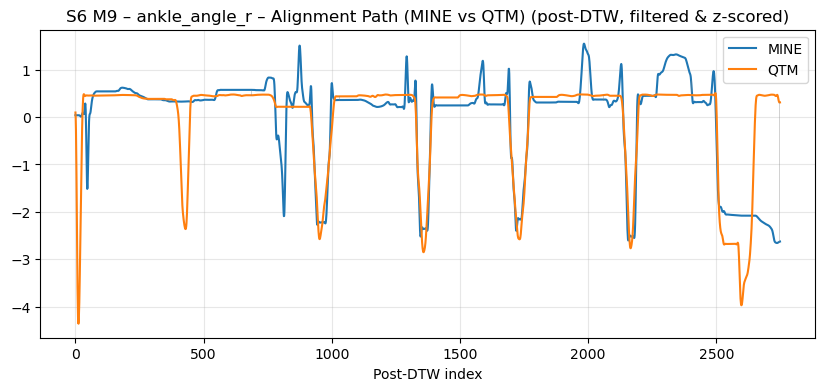

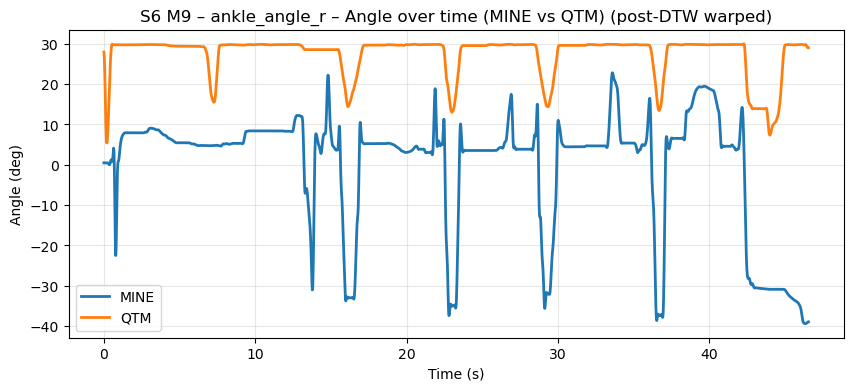

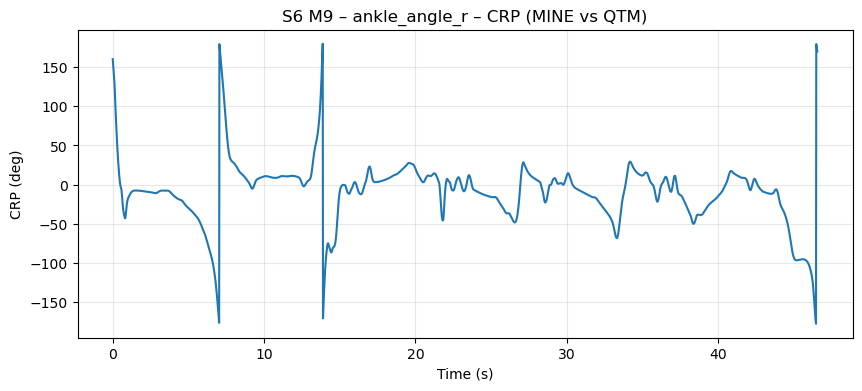

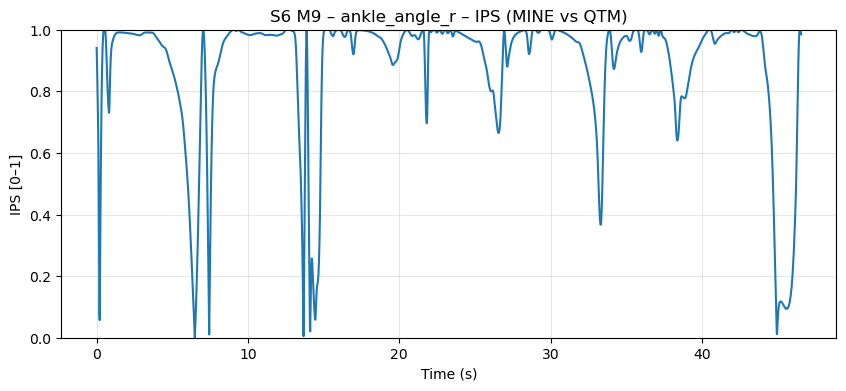


Saved DTW/TAM per-subject: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/DTW_TAM_S3toS6_M9_ankle_angle_r.csv
Saved (ALIGNED) RMSE per-subject: /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/RMSE_filtered_S3toS6_M9_ankle_angle_r.csv
Saved per-system stats (aligned): /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/SystemStats_filtered_S3toS6_M9_ankle_angle_r.csv
Saved CRP/IPS per-subject (aligned): /Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors/_jointbatch_selected/CRP_IPS_S3toS6_M9_ankle_angle_r.csv

===================== All-subjects summaries (ALIGNED) =====================

TAM (Mean ± SD across subjects):
               TAM_article
AllSubjects  1.108 ± 0.214

Agreement metrics (filtered, aligned) MINE vs QTM (Mean ± SD):
              RMSE_filt_deg    Bias_filt_deg    SD_filt_deg      Corr_filt        R2_f

In [172]:
# ============================================================
# Joint-by-joint validation across subjects (MINE vs QTM only)
# DTW/TAM + filtered RMSE (angle-safe) + CRP & IPS
# Per-subject plots + report, then All-subjects Mean ± SD
# All metrics computed on DTW-aligned (warped) series
# PLOTTING: alignment + angle vs time use POST-DTW data
# ============================================================

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from io import StringIO
from scipy.spatial.distance import cdist
from scipy.signal import butter, filtfilt, detrend, hilbert
from scipy.stats import circmean

# ===================== USER CONFIG ==========================
aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

mode = "joint_batch"   # "single", "batch", or "joint_batch"

# ---- joint_batch configuration ----
target_subjects = [3, 4, 5, 6]
target_movement = 9                   # e.g., M3
target_joint    = "ankle_angle_r"         # exact column in BOTH systems

# plotting
do_plots       = True
save_plots     = False  # if True, saves to _plots/<PAIR>/<trial>/
plt.rcParams["figure.figsize"] = (8, 4)

# Output folder for this joint-batch job
outdir_joint = os.path.join(aligned_root, "_jointbatch_selected")

# DTW / TAM options (used for the actual DTW)
band_ratio      = 0.05     # DTW path band (tighter if roughly synchronized)
try_derivative  = True
tam_high_thresh = 1.5
cost_mode       = "swdtw"  # "euclidean" or "swdtw"
smooth_win      = 51       # smoothing for swDTW
alpha_mix       = 0.8      # amplitude weight (0..1)
hv_penalty      = 0.40     # discourage long H/V runs

# Heatmap-only band overlay (purely visual; does NOT affect DTW)
acc_plot_band_ratio = 0.08   # slightly bigger window in the accumulated-cost figure

# Filtering options
default_fs  = 40.0
filt_fc_hz  = 6.0
filt_order  = 4

# CRP/IPS options
lp_hz            = 6.0
hp_hz            = None
amp_eps          = 1e-3
smooth_win_sec   = 0.25
phase_method     = "hilbert"

# ===================== HELPERS (IO) ========================

def load_storage(fp):
    """Read .sto/.mot with 'endheader' and return DataFrame (time + columns)."""
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i
            break
    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        pass
    elif "Time" in df.columns:
        df.rename(columns={"Time":"time"}, inplace=True)
    else:
        raise ValueError(f"No time column found in {os.path.basename(fp)}")
    return df

def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    """Prefer pair-tagged layout; fallback to legacy flat layout."""
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B
    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B
    return None, None

def ensure_dir(p):
    os.makedirs(p, exist_ok=True); return p

# ===================== HELPERS (signal) ====================

def zscore(x):
    x = np.asarray(x, float)
    m = np.nanmean(x); s = np.nanstd(x)
    return (x - m) / (s if s > 0 else 1.0)

def angle_diff_deg(a, b):
    """Shortest signed angular difference in degrees, in (-180, 180]."""
    a = np.asarray(a, float); b = np.asarray(b, float)
    d = (a - b + 180.0) % 360.0 - 180.0
    d[d == -180.0] = 180.0
    return d

def rmse_bias_sd(err):
    e = np.asarray(err, float)
    m = np.nanmean(e)
    s = np.nanstd(e, ddof=0)
    r = np.sqrt(m*m + s*s)
    return r, m, s

def filtfilt_lowpass(x, fc, fs, order=4):
    x = np.asarray(x, float)
    b, a = butter(order, fc/(fs/2), btype="lowpass")
    padlen = min(max(1, 3*max(len(a),len(b))), max(1, len(x)-1))
    return filtfilt(b, a, x, method="gust", padlen=padlen)

# ===================== DTW CORE ============================

def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')

def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    """
    Local cost matrix D (n x m).
      - mode="euclidean": |x_i - y_j|  (or derivative if use_derivative=True)
      - mode="swdtw":     alpha*|x_s - y_s|^2 + (1-alpha)*|dx_s - dy_s|^2
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0]); ys = np.diff(y, prepend=y[0])
            return cdist(xs.reshape(-1,1), ys.reshape(-1,1), metric="euclidean")
        return cdist(x.reshape(-1,1), y.reshape(-1,1), metric="euclidean")
    # swDTW (smoothed amplitude + derivative)
    xs  = _smooth1d(x, smooth_win)
    ys  = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])
    A = (xs[:, None] - ys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2
    return alpha*A + (1.0 - alpha)*B

def compute_dtw_windowed(x, y, band_ratio=0.10, use_derivative=False,
                         cost_mode="swdtw", smooth_win=21, alpha=0.5,
                         hv_penalty=0.10):
    """
    Sakoe-Chiba band DTW with (optional) swDTW local cost and an extra
    penalty added to horizontal/vertical steps (encourage diagonal).
    Returns (accumulated_cost_matrix A, optimal_path, local_cost_matrix D)
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    n, m = len(x), len(y)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win,
                           alpha=alpha, use_derivative=use_derivative)

    band = int(np.ceil(band_ratio * max(n, m)))
    INF = np.inf
    M = np.full((n, m), INF, float)  # local within band
    A = np.full((n, m), INF, float)  # accumulated

    for i in range(n):
        j_center = int(round((i * (m-1)) / max(1, (n-1))))
        j_lo = max(0, j_center - band)
        j_hi = min(m-1, j_center + band)
        M[i, j_lo:j_hi+1] = D[i, j_lo:j_hi+1]

    if not np.isfinite(M).any():
        return A, [], D

    # DP init
    if np.isfinite(M[0,0]):
        A[0,0] = M[0,0]
    for i in range(1, n):
        if np.isfinite(M[i,0]):
            A[i,0] = A[i-1,0] + M[i,0]*(1.0 + hv_penalty)
    for j in range(1, m):
        if np.isfinite(M[0,j]):
            A[0,j] = A[0,j-1] + M[0,j]*(1.0 + hv_penalty)

    for i in range(1, n):
        j_center = int(round((i * (m-1)) / max(1, (n-1))))
        j_lo = max(1, j_center - band)
        j_hi = min(m-1, j_center + band)
        for j in range(j_lo, j_hi+1):
            if not np.isfinite(M[i,j]): 
                continue
            d = M[i,j]
            a_diag = A[i-1, j-1] + d
            a_up   = A[i-1, j]   + d*(1.0 + hv_penalty)
            a_left = A[i,   j-1] + d*(1.0 + hv_penalty)
            A[i,j] = min(a_diag, a_up, a_left)

    # Backtrack
    i, j = n-1, m-1
    if not np.isfinite(A[i,j]):
        cand = np.argwhere(np.isfinite(A))
        if cand.size == 0:
            return A, [], D
        i, j = cand[np.argmin(A[cand[:,0], cand[:,1]])]
    path = [(i,j)]
    while (i > 0) or (j > 0):
        choices = []
        if i>0 and j>0: choices.append((A[i-1,j-1], i-1, j-1))
        if i>0:         choices.append((A[i-1,j],   i-1, j))
        if j>0:         choices.append((A[i,  j-1], i,   j-1))
        cost, i, j = min(choices, key=lambda t: t[0])
        path.append((i,j))
    path.reverse()
    return A, path, D

def tam_from_path(path, N, M):
    """TAM = advance/N + delay/M + (1 - phase/min(N,M)) with a 1-step correction."""
    adv = delay = phase = 0
    for (i0,j0),(i1,j1) in zip(path[:-1], path[1:]):
        di, dj = i1 - i0, j1 - j0
        if   di == 1 and dj == 0: adv   += 1   # horizontal
        elif di == 0 and dj == 1: delay += 1   # vertical
        elif di == 1 and dj == 1: phase += 1   # diagonal
    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)

def build_dtw_aligned_series(x, y, tvec, path):
    """Map x,y along the DTW path and create a uniform time base spanning [t0, t1]."""
    if not path:
        t0, t1 = float(tvec[0]), float(tvec[-1])
        fs0 = (len(tvec)-1) / max(1e-9, (t1 - t0))
        return x.copy(), y.copy(), tvec.copy(), fs0
    ii = np.array([p[0] for p in path], dtype=int)
    jj = np.array([p[1] for p in path], dtype=int)
    xw = np.asarray(x, float)[ii]
    yw = np.asarray(y, float)[jj]
    t0, t1 = float(tvec[0]), float(tvec[-1])
    L = len(ii)
    tw = np.linspace(t0, t1, L)
    fsw = (L - 1) / max(1e-9, (t1 - t0))
    return xw, yw, tw, fsw

def _identity_path(L: int):
    """Return a diagonal path for post-DTW warped sequences of length L."""
    return [(k, k) for k in range(L)]

# ===================== PLOTS ===============================

def plot_accumulated_cost_matrix(acc, path, joint, subj, mov,
                                 sysA, sysB, plot_band_ratio=None, outdir=None):
    """
    Accumulated-cost heatmap with the optimal path.
    """
    M = np.where(np.isfinite(acc), acc, np.nan)
    cmap = plt.cm.viridis.copy()
    cmap.set_bad(color="#e6e6e6")

    vmin = np.nanpercentile(M, 2)
    vmax = np.nanpercentile(M, 98)

    plt.figure(figsize=(6,6))
    im = plt.imshow(M.T, origin='lower', aspect='auto',
                    cmap=cmap, vmin=vmin, vmax=vmax)
    if path:
        px, py = zip(*path)
        plt.plot(px, py, color='white', linewidth=1.5)

    # Show wider Sakoe–Chiba band if requested (visual only)
    if plot_band_ratio is not None:
        n, m = acc.shape
        band = int(max(n, m) * plot_band_ratio)
        i = np.arange(n)
        lo = np.clip(i - band, 0, m-1)
        hi = np.clip(i + band, 0, m-1)
        plt.plot(i, lo, 'w--', lw=0.8)
        plt.plot(i, hi, 'w--', lw=0.8)

    plt.title(f"S{subj} M{mov} – {joint} – Accumulated Cost ({sysA} vs {sysB})")
    plt.xlabel(f"{sysA} index"); plt.ylabel(f"{sysB} index")
    cb = plt.colorbar(im); cb.set_label("Accumulated cost")

    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_ACC.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_alignment_index_domain(x_idx, y_idx, path, joint, subj, mov, sysA, sysB, outdir=None):
    """Index-domain alignment view (post-DTW, filtered & z-scored) with identity path."""
    plt.figure(figsize=(10,4))
    plt.plot(x_idx, label=sysA); plt.plot(y_idx, label=sysB)
    if path:
        step = max(1, len(path)//8)
        for (i, j) in path[::step]:
            plt.plot([i, j], [x_idx[i], y_idx[j]], color='gray', linewidth=0.5, alpha=0.5)
    plt.title(f"S{subj} M{mov} – {joint} – Alignment Path ({sysA} vs {sysB}) (post-DTW, filtered & z-scored)")
    plt.xlabel("Post-DTW index"); plt.legend(); plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_PATH_POST.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_angles_over_time(tv, x_raw, y_raw, fs, joint, subj, mov, sysA, sysB,
                          title_suffix="", outdir=None):
    """Visual comparison using low-pass filtered traces on the provided time base."""
    xf = filtfilt_lowpass(x_raw, filt_fc_hz, fs, order=filt_order)
    yf = filtfilt_lowpass(y_raw, filt_fc_hz, fs, order=filt_order)
    plt.figure(figsize=(10,4))
    plt.plot(tv, xf, label=f"{sysA}", linewidth=2)
    plt.plot(tv, yf, label=f"{sysB}", linewidth=2)
    plt.title(f"S{subj} M{mov} – {joint} – Angle over time ({sysA} vs {sysB}) {title_suffix}")
    plt.xlabel("Time (s)"); plt.ylabel("Angle (deg)")
    plt.grid(True, alpha=0.3); plt.legend(loc="best")
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_ANGLE_TIME_POST.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_crp(tv, crp_deg, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(10,4))
    plt.plot(tv, crp_deg)
    plt.title(f"S{subj} M{mov} – {joint} – CRP ({sysA} vs {sysB})")
    plt.xlabel("Time (s)"); plt.ylabel("CRP (deg)")
    plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_CRP.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

def plot_ips(tv, ips, joint, subj, mov, sysA, sysB, outdir=None):
    plt.figure(figsize=(10,4))
    plt.plot(tv, ips)
    plt.title(f"S{subj} M{mov} – {joint} – IPS ({sysA} vs {sysB})")
    plt.xlabel("Time (s)"); plt.ylabel("IPS [0–1]")
    plt.ylim(0, 1); plt.grid(True, alpha=0.3)
    if save_plots and outdir:
        ensure_dir(outdir)
        plt.savefig(os.path.join(outdir, f"S{subj}_M{mov}_{joint}_IPS.png"),
                    dpi=150, bbox_inches="tight"); plt.close()
    else:
        plt.show()

# ===================== AGREEMENT & SYSTEM STATS ============

def compute_pair_metrics_filtered(x_raw, y_raw, fs):
    """Filter (low-pass), then angle-safe error -> RMSE/Bias/SD + r and R²."""
    xf = filtfilt_lowpass(x_raw, filt_fc_hz, fs, order=filt_order)
    yf = filtfilt_lowpass(y_raw, filt_fc_hz, fs, order=filt_order)
    err_f = angle_diff_deg(xf, yf)
    rmse_f, bias_f, sd_f = rmse_bias_sd(err_f)
    if np.nanstd(xf) == 0 or np.nanstd(yf) == 0:
        r = np.nan
    else:
        r = float(np.corrcoef(xf, yf)[0,1])
    r2 = (r**2) if np.isfinite(r) else np.nan
    return {
        "RMSE_filt_deg": float(rmse_f),
        "Bias_filt_deg": float(bias_f),
        "SD_filt_deg":   float(sd_f),
        "Corr_filt":     float(r) if np.isfinite(r) else np.nan,
        "R2_filt":       float(r2) if np.isfinite(r2) else np.nan,
        "N":             int(np.sum(np.isfinite(err_f)))
    }, xf, yf

def system_stats(x):
    x = np.asarray(x, float)
    x = x[np.isfinite(x)]
    if x.size < 1:
        return dict(Mean=np.nan, SD=np.nan, ROM=np.nan, Peak=np.nan, Min=np.nan)
    return dict(
        Mean=float(np.mean(x)),
        SD=float(np.std(x)),
        ROM=float(np.max(x) - np.min(x)),
        Peak=float(np.max(x)),
        Min=float(np.min(x)),
    )

# ===================== CRP / IPS ===========================

def _butter_lowpass_filt(x, fs, fc=6.0, order=4, hp=None):
    """Zero-phase filter: optional high-pass (hp) then low-pass."""
    x = np.asarray(x, float)
    y = detrend(x, type='constant')
    if hp is not None and hp > 0:
        b, a = butter(order, hp/(fs/2), btype='highpass')
        pad = max(len(a), len(b)) * 3
        y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    b, a = butter(order, fc/(fs/2), btype='lowpass')
    pad = max(len(a), len(b)) * 3
    y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    return y

def _circular_moving_mean(angles_deg, win_samples):
    ang = np.deg2rad(angles_deg)
    c = np.cos(ang); s = np.sin(ang)
    k = int(max(1, win_samples))
    c_ma = np.convolve(c, np.ones(k)/k, mode='same')
    s_ma = np.convolve(s, np.ones(k)/k, mode='same')
    return np.rad2deg(np.arctan2(s_ma, c_ma))

def compute_crp_ips(x, y, fs,
                    lp_hz=6.0, hp_hz=None,
                    amp_eps=1e-3,
                    smooth_win_sec=0.25,
                    method="hilbert"):
    """CRP (deg) and IPS [0–1] after filtering + circular smoothing."""
    x = _butter_lowpass_filt(x, fs, fc=lp_hz, order=4, hp=hp_hz)
    y = _butter_lowpass_filt(y, fs, fc=lp_hz, order=4, hp=hp_hz)

    if method == "phase_plane":
        vx = np.gradient(x) * fs
        vy = np.gradient(y) * fs
        xr = x / (np.sqrt(np.mean(x**2)) + 1e-12)
        yr = y / (np.sqrt(np.mean(y**2)) + 1e-12)
        vxr = vx / (np.sqrt(np.mean(vx**2)) + 1e-12)
        vyr = vy / (np.sqrt(np.mean(vy**2)) + 1e-12)
        phx = np.arctan2(vxr, xr); phy = np.arctan2(vyr, yr)
        amp_x = np.hypot(xr, vxr); amp_y = np.hypot(yr, vyr)
    else:
        ax = hilbert(x); ay = hilbert(y)
        phx = np.angle(ax); phy = np.angle(ay)
        amp_x = np.abs(ax);  amp_y = np.abs(ay)

    dphi = np.angle(np.exp(1j*(phx - phy)))
    crp_deg = np.degrees(dphi)

    bad = (amp_x < amp_eps) | (amp_y < amp_eps)
    crp_deg[bad] = np.nan

    win = int(round(smooth_win_sec * fs))
    if win > 1:
        sm = _circular_moving_mean(np.where(np.isnan(crp_deg), 0.0, crp_deg), win)
        crp_deg = np.where(bad, np.nan, sm)

    ips = np.abs(np.cos(np.deg2rad(crp_deg)))
    return crp_deg, ips

# ===================== SUMMARIES ===========================

def mean_sd(df, cols, group=None, digits=3):
    """Return a dataframe of 'mean ± sd' strings for numeric columns."""
    if df.empty:
        return pd.DataFrame()

    df2 = df.copy()
    for c in cols:
        if c not in df2.columns: df2[c] = np.nan
        df2[c] = pd.to_numeric(df2[c], errors="coerce")

    if group is None:
        mu = df2[cols].mean()
        sd = df2[cols].std(ddof=1)
        out = (mu.round(digits).astype(str) + " ± " + sd.round(digits).astype(str)).to_frame().T
        out.index = ["AllSubjects"]
        return out
    else:
        g = df2.groupby(group, dropna=False)[cols]
        mu = g.mean(); sd = g.std(ddof=1)
        out = mu.round(digits).astype(str) + " ± " + sd.round(digits).astype(str)
        return out

# ===================== MAIN RUNNER (joint_batch) ===========

def run_joint_across_subjects(movement, joint_name, subjects_list):
    sysA, sysB = "MINE", "QTM"

    rows_dtw_tam  = []
    rows_rmse     = []
    rows_sysstats = []
    rows_crpips   = []

    for subject in subjects_list:
        base = f"S{subject}_M{movement}"
        fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
        if not (fpA and fpB):
            print(f"[WARN] Skip {base} {sysA} vs {sysB}: aligned files not found.")
            continue

        dfA = load_storage(fpA)
        dfB = load_storage(fpB)

        # time align to common samples if needed
        if not np.array_equal(dfA["time"].values, dfB["time"].values):
            common = np.intersect1d(dfA["time"].values, dfB["time"].values)
            if len(common) < 5:
                print(f"[WARN] Skip {base}: insufficient common time samples.")
                continue
            dfA = dfA.set_index("time").loc[common].reset_index()
            dfB = dfB.set_index("time").loc[common].reset_index()

        if joint_name not in dfA.columns or joint_name not in dfB.columns:
            print(f"[WARN] {base}: joint '{joint_name}' not found in both systems.")
            continue

        # infer fs
        t = dfA["time"].to_numpy(float)
        dt = np.median(np.diff(t)) if len(t) > 1 else np.nan
        fs = (1.0/dt) if (np.isfinite(dt) and dt > 0) else default_fs

        # raw vectors and trim to shared valid region
        xr = dfA[joint_name].to_numpy(float)
        yr = dfB[joint_name].to_numpy(float)
        valid = np.isfinite(xr) & np.isfinite(yr)
        if valid.sum() < 5:
            print(f"[WARN] {base} {joint_name}: too few valid samples.")
            continue
        i0 = np.argmax(valid)
        i1 = len(valid) - np.argmax(valid[::-1])
        xrw = xr[i0:i1]; yrw = yr[i0:i1]
        tv  = t[i0:i1]
        if len(xrw) < 5 or len(yrw) < 5:
            print(f"[WARN] {base} {joint_name}: too short after trimming.")
            continue

        # ---------- DTW on filtered + z-scored PRE-DTW series ----------
        xrf = filtfilt_lowpass(xrw, filt_fc_hz, fs, order=filt_order)
        yrf = filtfilt_lowpass(yrw, filt_fc_hz, fs, order=filt_order)
        xz  = zscore(xrf); yz = zscore(yrf)

        acc, path, _ = compute_dtw_windowed(
            xz, yz,
            band_ratio=band_ratio,           # DTW band (real path)
            use_derivative=False,
            cost_mode=cost_mode,
            smooth_win=smooth_win,
            alpha=alpha_mix,
            hv_penalty=hv_penalty
        )
        tam = tam_from_path(path, len(xz), len(yz))
        used_derivative = False
        if try_derivative and tam > tam_high_thresh:
            accd, pathd, _ = compute_dtw_windowed(
                xz, yz,
                band_ratio=band_ratio,
                use_derivative=True if cost_mode=="euclidean" else False,
                cost_mode=cost_mode,
                smooth_win=smooth_win,
                alpha=alpha_mix,
                hv_penalty=hv_penalty
            )
            tamd = tam_from_path(pathd, len(xz), len(yz))
            if tamd < tam:
                tam, acc, path = tamd, accd, pathd
                used_derivative = True

        # ---- Build POST-DTW warped series (primary for metrics & plots) ----
        xw, yw, tvw, fsw = build_dtw_aligned_series(xrw, yrw, tv, path)

        # post-DTW filtered + z-scored (for index-domain alignment figure)
        xw_f = filtfilt_lowpass(xw, filt_fc_hz, fsw, order=filt_order)
        yw_f = filtfilt_lowpass(yw, filt_fc_hz, fsw, order=filt_order)
        xz_post = zscore(xw_f)
        yz_post = zscore(yw_f)
        path_post = _identity_path(len(xw))   # identity after warping

        # --- Metrics on POST-DTW series ---
        metr_aligned, xf_w, yf_w = compute_pair_metrics_filtered(xw, yw, fs=fsw)
        metr_raw, _, _ = compute_pair_metrics_filtered(xrw, yrw, fs=fs)

        # Per-system descriptive stats (filtered) on POST-DTW traces
        statsA = system_stats(xf_w); statsB = system_stats(yf_w)

        # CRP & IPS on POST-DTW traces
        crp_deg, ips = compute_crp_ips(
            xw, yw, fs=fsw,
            lp_hz=lp_hz, hp_hz=hp_hz,
            amp_eps=amp_eps,
            smooth_win_sec=smooth_win_sec,
            method=phase_method
        )

        # ============ PER-SUBJECT REPORT & PLOTS ============
        print(f"\n===== Subject S{subject} • Movement M{movement} • Joint {joint_name} =====")
        print(f"TAM: {tam:.4f}  (Used derivative fallback: {used_derivative})")
        print(f"ALIGNED RMSE (deg, filtered): {metr_aligned['RMSE_filt_deg']:.3f} | "
              f"Bias: {metr_aligned['Bias_filt_deg']:.3f} | SD: {metr_aligned['SD_filt_deg']:.3f} | "
              f"r: {metr_aligned['Corr_filt'] if np.isfinite(metr_aligned['Corr_filt']) else np.nan:.3f} | "
              f"R²: {metr_aligned['R2_filt'] if np.isfinite(metr_aligned['R2_filt']) else np.nan:.3f}")
        print(f"(Raw pre-DTW RMSE: {metr_raw['RMSE_filt_deg']:.3f} deg)")

        mean_crp_lin  = float(np.nanmean(crp_deg))
        mean_crp_circ = (float(circmean(crp_deg[~np.isnan(crp_deg)], high=180, low=-180))
                         if np.sum(~np.isnan(crp_deg))>0 else np.nan)
        std_crp       = float(np.nanstd(crp_deg))
        mean_ips      = float(np.nanmean(ips))
        pct_hi_sync   = float(np.nanmean(ips > 0.8) * 100.0)
        print(f"CRP mean (linear deg): {mean_crp_lin:.3f} | "
              f"CRP mean (circular deg): {mean_crp_circ:.3f} | "
              f"CRP SD (deg): {std_crp:.3f}")
        print(f"IPS mean: {mean_ips:.3f} | %IPS>0.8: {pct_hi_sync:.1f}%")

        print("MINE (filtered, aligned) -> "
              f"Mean: {statsA['Mean']:.3f}, SD: {statsA['SD']:.3f}, ROM: {statsA['ROM']:.3f}, "
              f"Peak: {statsA['Peak']:.3f}, Min: {statsA['Min']:.3f}")
        print("QTM  (filtered, aligned) -> "
              f"Mean: {statsB['Mean']:.3f}, SD: {statsB['SD']:.3f}, ROM: {statsB['ROM']:.3f}, "
              f"Peak: {statsB['Peak']:.3f}, Min: {statsB['Min']:.3f}")

        if do_plots:
            plot_out = os.path.join(aligned_root, "_plots", f"{sysA}_vs_{sysB}", base)

            # 1) Accumulated-cost heatmap (with slightly bigger visible band)
            plot_accumulated_cost_matrix(
                acc, path, joint_name, subject, movement, sysA, sysB,
                plot_band_ratio=acc_plot_band_ratio,
                outdir=(plot_out if save_plots else None)
            )

            # 2) Alignment (index domain) using POST-DTW signals + identity path
            plot_alignment_index_domain(
                xz_post, yz_post, path_post,
                joint_name, subject, movement, sysA, sysB,
                outdir=(plot_out if save_plots else None)
            )

            # 3) Angle-over-time using POST-DTW warped time base
            plot_angles_over_time(
                tvw, xw, yw, fsw,
                joint_name, subject, movement, sysA, sysB,
                title_suffix="(post-DTW warped)",
                outdir=(plot_out if save_plots else None)
            )

            # 4) CRP & IPS on POST-DTW time base
            plot_crp(tvw, crp_deg, joint_name, subject, movement, sysA, sysB,
                     outdir=(plot_out if save_plots else None))
            plot_ips(tvw, ips, joint_name, subject, movement, sysA, sysB,
                     outdir=(plot_out if save_plots else None))

        # ============ COLLECT ROWS FOR CSVs/SUMMARIES ============
        rows_dtw_tam.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject,
            "Movement": movement,
            "Joint": joint_name,
            "N_A": len(xrw),
            "N_B": len(yrw),
            "TAM_article": float(tam),
            "Used_derivative_DTW": bool(used_derivative),
        })
        rows_rmse.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject, "Movement": movement, "Joint": joint_name,
            "fs_Hz_aligned": float(fsw), **metr_aligned,
            "Raw_RMSE_filt_deg": metr_raw["RMSE_filt_deg"],
            "Raw_Bias_filt_deg": metr_raw["Bias_filt_deg"],
            "Raw_SD_filt_deg":   metr_raw["SD_filt_deg"],
            "Raw_Corr_filt":     metr_raw["Corr_filt"],
            "Raw_R2_filt":       metr_raw["R2_filt"],
        })
        rows_sysstats.append({
            "System":"MINE", "Subject":subject, "Movement":movement, "Joint":joint_name, **statsA
        })
        rows_sysstats.append({
            "System":"QTM",  "Subject":subject, "Movement":movement, "Joint":joint_name, **statsB
        })
        rows_crpips.append({
            "Pair": f"{sysA}_vs_{sysB}",
            "Subject": subject, "Movement": movement, "Joint": joint_name,
            "N": int(len(crp_deg[~np.isnan(crp_deg)])),
            "fs_Hz_aligned": float(fsw),
            "CRP_mean_linear_deg": mean_crp_lin,
            "CRP_mean_circular_deg": mean_crp_circ,
            "CRP_std_deg": std_crp,
            "IPS_mean": mean_ips,
            "IPS_pct_gt_0p8": pct_hi_sync
        })

    # --- Build DataFrames ---
    df_dtw_tam  = pd.DataFrame(rows_dtw_tam)
    df_rmse     = pd.DataFrame(rows_rmse)
    df_sysstats = pd.DataFrame(rows_sysstats)
    df_crpips   = pd.DataFrame(rows_crpips)

    # ---- Save outputs ----
    ensure_dir(outdir_joint)
    tag = f"S{target_subjects[0]}toS{target_subjects[-1]}_M{movement}_{joint_name}"

    if not df_dtw_tam.empty:
        csv_dtw = os.path.join(outdir_joint, f"DTW_TAM_{tag}.csv")
        df_dtw_tam.sort_values(["Subject"], inplace=True)
        df_dtw_tam.to_csv(csv_dtw, index=False)
        print(f"\nSaved DTW/TAM per-subject: {csv_dtw}")
    else:
        print("\nDTW/TAM: no results.")

    if not df_rmse.empty:
        csv_rmse = os.path.join(outdir_joint, f"RMSE_filtered_{tag}.csv")
        df_rmse.sort_values(["Subject"], inplace=True)
        df_rmse.to_csv(csv_rmse, index=False)
        print(f"Saved (ALIGNED) RMSE per-subject: {csv_rmse}")
    else:
        print("RMSE: no results.")

    if not df_sysstats.empty:
        csv_sys = os.path.join(outdir_joint, f"SystemStats_filtered_{tag}.csv")
        df_sysstats.sort_values(["System","Subject"], inplace=True)
        df_sysstats.to_csv(csv_sys, index=False)
        print(f"Saved per-system stats (aligned): {csv_sys}")
    else:
        print("System stats: no results.")

    if not df_crpips.empty:
        csv_crp = os.path.join(outdir_joint, f"CRP_IPS_{tag}.csv")
        df_crpips.sort_values(["Subject"], inplace=True)
        df_crpips.to_csv(csv_crp, index=False)
        print(f"Saved CRP/IPS per-subject (aligned): {csv_crp}")
    else:
        print("CRP/IPS: no results.")

    # ---- All-subjects summaries (Mean ± SD) on ALIGNED metrics ----
    print("\n===================== All-subjects summaries (ALIGNED) =====================")
    if not df_dtw_tam.empty:
        print("\nTAM (Mean ± SD across subjects):")
        print(mean_sd(df_dtw_tam, cols=["TAM_article"]).to_string(index=True))

    if not df_rmse.empty:
        print("\nAgreement metrics (filtered, aligned) MINE vs QTM (Mean ± SD):")
        print(mean_sd(df_rmse, cols=["RMSE_filt_deg","Bias_filt_deg","SD_filt_deg","Corr_filt","R2_filt"]).to_string(index=True))

    if not df_crpips.empty:
        print("\nCRP & IPS (aligned; Mean ± SD across subjects):")
        print(mean_sd(df_crpips, cols=["CRP_mean_linear_deg","CRP_mean_circular_deg","CRP_std_deg","IPS_mean","IPS_pct_gt_0p8"]).to_string(index=True))

    if not df_sysstats.empty:
        print("\nPer-system descriptive stats of FILTERED aligned angle (Mean ± SD):")
        print(mean_sd(df_sysstats, cols=["Mean","SD","ROM","Peak","Min"], group="System").to_string())

    return df_dtw_tam, df_rmse, df_crpips, df_sysstats


# ===================== CONTROLLER ==========================

if mode.lower() == "joint_batch":
    _ = run_joint_across_subjects(target_movement, target_joint, target_subjects)

elif mode.lower() == "single":
    single_pair      = ("MINE","QTM")
    single_subject   = 6
    single_movement  = 10
    single_base      = None
    raise SystemExit("Use mode='joint_batch' for the requested analysis.")

elif mode.lower() == "batch":
    raise SystemExit("Use mode='joint_batch' for the requested analysis.")

else:
    raise ValueError("Unknown mode. Use 'joint_batch'.")


In [180]:
# ============================================================
# Multi-joint summary across subjects (MINE vs QTM only)
# No plots, no per-subject printouts
# Outputs a single table (CSV + print) with Mean ± SD per joint
# Metrics: TAM, "sDTW-like" normalized cost, RMSE, Bias, SD, r, R², CRP, IPS
# All metrics computed on DTW-aligned (warped) series
# ============================================================

import os
import numpy as np
import pandas as pd
from io import StringIO
from scipy.spatial.distance import cdist
from scipy.signal import butter, filtfilt, detrend, hilbert
from scipy.stats import circmean

# ===================== USER CONFIG ==========================

aligned_root = "/Users/afonsoamaral/Desktop/validation/Motions for validation/_aligned_nors"

# Movement and subjects to summarize
target_subjects = [3, 4, 5, 6]
target_movement = 11  # e.g., "M9"

# Map human-readable joints to the exact column names in your .sto files (R/L).
# Edit these names to match your data schema.
JOINT_MAP = {
    "arm flexion":      ["arm_flex_r"],
    "arm adduction":    ["arm_add_r"],
    "elbow flexion":    ["elbow_flex_r"],
    "hip flexion":      ["hip_flexion_r"],
    "hip adduction":    ["hip_adduction_r"],
    "knee angle":       ["knee_angle_r"],
    "ankle angle":      ["ankle_angle_r"],
}

# Output folder for the summary table
outdir_summary = os.path.join(aligned_root, "_jointbatch_selected")

# DTW / TAM options
band_ratio      = 0.05     # Sakoe-Chiba band (as fraction of sequence length)
try_derivative  = True
tam_high_thresh = 1.5
cost_mode       = "swdtw"  # "euclidean" or "swdtw"
smooth_win      = 51       # smoothing for swDTW local cost
alpha_mix       = 0.8      # amplitude weight (0..1)
hv_penalty      = 0.40     # penalty for horizontal/vertical steps

# Filtering options
default_fs  = 40.0
filt_fc_hz  = 6.0
filt_order  = 4

# CRP/IPS options
lp_hz            = 6.0
hp_hz            = None
amp_eps          = 1e-3
smooth_win_sec   = 0.25
phase_method     = "hilbert"

# ===================== HELPERS (IO) ========================

def load_storage(fp):
    """Read .sto/.mot with 'endheader' and return DataFrame (time + columns)."""
    with open(fp, "r") as f:
        lines = f.readlines()
    hdr_end = None
    for i, ln in enumerate(lines[:200]):
        if ln.strip().lower() == "endheader":
            hdr_end = i
            break
    start = (hdr_end + 1) if hdr_end is not None else 0
    df = pd.read_csv(StringIO("".join(lines[start:])),
                     sep=r"\s+|\t", engine="python")
    if "time" in df.columns:
        pass
    elif "Time" in df.columns:
        df.rename(columns={"Time":"time"}, inplace=True)
    else:
        raise ValueError(f"No time column found in {os.path.basename(fp)}")
    return df

def pair_dir(root, sysA, sysB):
    return os.path.join(root, f"{sysA}_vs_{sysB}")

def resolve_pair_paths(root, base, sysA, sysB):
    """Prefer pair-tagged layout; fallback to legacy flat layout."""
    pd_ = pair_dir(root, sysA, sysB)
    new_A = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysA}_aligned.sto")
    new_B = os.path.join(pd_, f"{base}_{sysA}_vs_{sysB}_{sysB}_aligned.sto")
    if os.path.exists(new_A) and os.path.exists(new_B):
        return new_A, new_B
    old_A = os.path.join(root, f"{base}_{sysA}_aligned.sto")
    old_B = os.path.join(root, f"{base}_{sysB}_aligned.sto")
    if os.path.exists(old_A) and os.path.exists(old_B):
        return old_A, old_B
    return None, None

def ensure_dir(p):
    os.makedirs(p, exist_ok=True); return p

# ===================== HELPERS (signal) ====================

def zscore(x):
    x = np.asarray(x, float)
    m = np.nanmean(x); s = np.nanstd(x)
    return (x - m) / (s if s > 0 else 1.0)

def angle_diff_deg(a, b):
    """Shortest signed angular difference in degrees, in (-180, 180]."""
    a = np.asarray(a, float); b = np.asarray(b, float)
    d = (a - b + 180.0) % 360.0 - 180.0
    d[d == -180.0] = 180.0
    return d

def rmse_bias_sd(err):
    e = np.asarray(err, float)
    m = np.nanmean(e)
    s = np.nanstd(e, ddof=0)
    r = np.sqrt(m*m + s*s)
    return r, m, s

def filtfilt_lowpass(x, fc, fs, order=4):
    x = np.asarray(x, float)
    b, a = butter(order, fc/(fs/2), btype="lowpass")
    padlen = min(max(1, 3*max(len(a),len(b))), max(1, len(x)-1))
    return filtfilt(b, a, x, method="gust", padlen=padlen)

# ===================== DTW CORE ============================

def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')

def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    """
    Local cost matrix D (n x m).
      - mode="euclidean": |x_i - y_j|  (or derivative if use_derivative=True)
      - mode="swdtw":     alpha*|x_s - y_s|^2 + (1-alpha)*|dx_s - dy_s|^2
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0]); ys = np.diff(y, prepend=y[0])
            return cdist(xs.reshape(-1,1), ys.reshape(-1,1), metric="euclidean")
        return cdist(x.reshape(-1,1), y.reshape(-1,1), metric="euclidean")
    # swDTW (smoothed amplitude + derivative)
    xs  = _smooth1d(x, smooth_win)
    ys  = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])
    A = (xs[:, None] - ys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2
    return alpha*A + (1.0 - alpha)*B

def compute_dtw_windowed(x, y, band_ratio=0.10, use_derivative=False,
                         cost_mode="swdtw", smooth_win=21, alpha=0.5,
                         hv_penalty=0.10):
    """
    Sakoe-Chiba band DTW with (optional) swDTW local cost and an extra
    penalty added to horizontal/vertical steps (encourage diagonal).
    Returns (accumulated_cost_matrix A, optimal_path, local_cost_matrix D)
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    n, m = len(x), len(y)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win,
                           alpha=alpha, use_derivative=use_derivative)

    band = int(np.ceil(band_ratio * max(n, m)))
    INF = np.inf
    M = np.full((n, m), INF, float)  # local within band
    A = np.full((n, m), INF, float)  # accumulated

    for i in range(n):
        j_center = int(round((i * (m-1)) / max(1, (n-1))))
        j_lo = max(0, j_center - band)
        j_hi = min(m-1, j_center + band)
        M[i, j_lo:j_hi+1] = D[i, j_lo:j_hi+1]

    if not np.isfinite(M).any():
        return A, [], D

    # DP init
    if np.isfinite(M[0,0]): A[0,0] = M[0,0]
    for i in range(1, n):
        if np.isfinite(M[i,0]):
            A[i,0] = A[i-1,0] + M[i,0]*(1.0 + hv_penalty)
    for j in range(1, m):
        if np.isfinite(M[0,j]):
            A[0,j] = A[0,j-1] + M[0,j]*(1.0 + hv_penalty)

    for i in range(1, n):
        j_center = int(round((i * (m-1)) / max(1, (n-1))))
        j_lo = max(1, j_center - band)
        j_hi = min(m-1, j_center + band)
        for j in range(j_lo, j_hi+1):
            if not np.isfinite(M[i,j]): 
                continue
            d = M[i,j]
            a_diag = A[i-1, j-1] + d
            a_up   = A[i-1, j]   + d*(1.0 + hv_penalty)
            a_left = A[i,   j-1] + d*(1.0 + hv_penalty)
            A[i,j] = min(a_diag, a_up, a_left)

    # Backtrack
    i, j = n-1, m-1
    if not np.isfinite(A[i,j]):
        cand = np.argwhere(np.isfinite(A))
        if cand.size == 0: return A, [], D
        i, j = cand[np.argmin(A[cand[:,0], cand[:,1]])]
    path = [(i,j)]
    while (i > 0) or (j > 0):
        choices = []
        if i>0 and j>0: choices.append((A[i-1,j-1], i-1, j-1))
        if i>0:         choices.append((A[i-1,j],   i-1, j))
        if j>0:         choices.append((A[i,  j-1], i,   j-1))
        cost, i, j = min(choices, key=lambda t: t[0])
        path.append((i,j))
    path.reverse()
    return A, path, D

def tam_from_path(path, N, M):
    """TAM = advance/N + delay/M + (1 - phase/min(N,M)) with a 1-step correction."""
    adv = delay = phase = 0
    for (i0,j0),(i1,j1) in zip(path[:-1], path[1:]):
        di, dj = i1 - i0, j1 - j0
        if   di == 1 and dj == 0: adv   += 1   # horizontal
        elif di == 0 and dj == 1: delay += 1   # vertical
        elif di == 1 and dj == 1: phase += 1   # diagonal
    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)

def build_dtw_aligned_series(x, y, tvec, path):
    """Map x,y along the DTW path and create a uniform time base spanning [t0, t1]."""
    if not path:
        t0, t1 = float(tvec[0]), float(tvec[-1])
        fs0 = (len(tvec)-1) / max(1e-9, (t1 - t0))
        return x.copy(), y.copy(), tvec.copy(), fs0
    ii = np.array([p[0] for p in path], dtype=int)
    jj = np.array([p[1] for p in path], dtype=int)
    xw = np.asarray(x, float)[ii]
    yw = np.asarray(y, float)[jj]
    t0, t1 = float(tvec[0]), float(tvec[-1])
    L = len(ii)
    tw = np.linspace(t0, t1, L)
    fsw = (L - 1) / max(1e-9, (t1 - t0))
    return xw, yw, tw, fsw

# ===================== AGREEMENT & SYSTEM STATS ============

def compute_pair_metrics_filtered(x_raw, y_raw, fs):
    """Filter (low-pass), then angle-safe error -> RMSE/Bias/SD + r and R²."""
    xf = filtfilt_lowpass(x_raw, filt_fc_hz, fs, order=filt_order)
    yf = filtfilt_lowpass(y_raw, filt_fc_hz, fs, order=filt_order)
    err_f = angle_diff_deg(xf, yf)
    rmse_f, bias_f, sd_f = rmse_bias_sd(err_f)
    if np.nanstd(xf) == 0 or np.nanstd(yf) == 0:
        r = np.nan
    else:
        r = float(np.corrcoef(xf, yf)[0,1])
    r2 = (r**2) if np.isfinite(r) else np.nan
    return {
        "RMSE_filt_deg": float(rmse_f),
        "Bias_filt_deg": float(bias_f),
        "SD_filt_deg":   float(sd_f),
        "Corr_filt":     float(r) if np.isfinite(r) else np.nan,
        "R2_filt":       float(r2) if np.isfinite(r2) else np.nan,
        "N":             int(np.sum(np.isfinite(err_f)))
    }, xf, yf

# ===================== CRP / IPS ===========================

def _butter_lowpass_filt(x, fs, fc=6.0, order=4, hp=None):
    """Zero-phase filter: optional high-pass (hp) then low-pass."""
    x = np.asarray(x, float)
    y = detrend(x, type='constant')
    if hp is not None and hp > 0:
        b, a = butter(order, hp/(fs/2), btype='highpass')
        pad = max(len(a), len(b)) * 3
        y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    b, a = butter(order, fc/(fs/2), btype='lowpass')
    pad = max(len(a), len(b)) * 3
    y = filtfilt(b, a, y, padlen=min(pad, max(1, len(y)-1)))
    return y

def _circular_moving_mean(angles_deg, win_samples):
    ang = np.deg2rad(angles_deg)
    c = np.cos(ang); s = np.sin(ang)
    k = int(max(1, win_samples))
    c_ma = np.convolve(c, np.ones(k)/k, mode='same')
    s_ma = np.convolve(s, np.ones(k)/k, mode='same')
    return np.rad2deg(np.arctan2(s_ma, c_ma))

def compute_crp_ips(x, y, fs,
                    lp_hz=6.0, hp_hz=None,
                    amp_eps=1e-3,
                    smooth_win_sec=0.25,
                    method="hilbert"):
    """CRP (deg) and IPS [0–1] after filtering + circular smoothing."""
    x = _butter_lowpass_filt(x, fs, fc=lp_hz, order=4, hp=hp_hz)
    y = _butter_lowpass_filt(y, fs, fc=lp_hz, order=4, hp=hp_hz)

    if method == "phase_plane":
        vx = np.gradient(x) * fs
        vy = np.gradient(y) * fs
        xr = x / (np.sqrt(np.mean(x**2)) + 1e-12)
        yr = y / (np.sqrt(np.mean(y**2)) + 1e-12)
        vxr = vx / (np.sqrt(np.mean(vx**2)) + 1e-12)
        vyr = vy / (np.sqrt(np.mean(vy**2)) + 1e-12)
        phx = np.arctan2(vxr, xr); phy = np.arctan2(vyr, yr)
        amp_x = np.hypot(xr, vxr); amp_y = np.hypot(yr, vyr)
    else:
        ax = hilbert(x); ay = hilbert(y)
        phx = np.angle(ax); phy = np.angle(ay)
        amp_x = np.abs(ax);  amp_y = np.abs(ay)

    dphi = np.angle(np.exp(1j*(phx - phy)))
    crp_deg = np.degrees(dphi)

    bad = (amp_x < amp_eps) | (amp_y < amp_eps)
    crp_deg[bad] = np.nan

    win = int(round(smooth_win_sec * fs))
    if win > 1:
        sm = _circular_moving_mean(np.where(np.isnan(crp_deg), 0.0, crp_deg), win)
        crp_deg = np.where(bad, np.nan, sm)

    ips = np.abs(np.cos(np.deg2rad(crp_deg)))
    return crp_deg, ips

# ===================== SUMMARY HELPERS =====================

def fmt_sig(x, sig=3):
    """Format number to 'sig' significant figures; keep 'nan' if not finite."""
    try:
        if x is None or (isinstance(x, float) and not np.isfinite(x)):
            return "nan"
        return f"{float(x):.{sig}g}"
    except Exception:
        return "nan"

def mean_sd_table(rows, digits=3):
    """Convert list of dict rows into Mean ± SD per joint with 3 significant figures."""
    df = pd.DataFrame(rows)
    if df.empty:
        return pd.DataFrame()
    # Numeric columns only
    num_cols = [c for c in df.columns if c not in ["Joint","Side","N_pairs","N_crp_ips"]]
    group = df.groupby("Joint", dropna=False)
    mu = group[num_cols].mean()
    sd = group[num_cols].std(ddof=1)

    # Compose "mean ± sd" strings using significant figures
    out = pd.DataFrame(index=mu.index)
    for c in num_cols:
        mean_fmt = mu[c].apply(lambda v: fmt_sig(v, sig=digits))
        sd_fmt   = sd[c].apply(lambda v: fmt_sig(v, sig=digits))
        out[c] = mean_fmt + " ± " + sd_fmt

    # Also add sample counts (sum across sides/subjects)
    out["N_pairs"] = group["N_pairs"].sum().astype(int)
    out["N_crp_ips"] = group["N_crp_ips"].sum().astype(int)
    return out.reset_index()

# ===================== MAIN RUNNER =========================

def summarize_multi_joint(movement, subjects, joint_map):
    sysA, sysB = "MINE", "QTM"
    ensure_dir(outdir_summary)

    rows = []  # collect per (subject, side) row; later aggregate to Mean ± SD by Joint

    for subject in subjects:
        base = f"S{subject}_M{movement}"
        fpA, fpB = resolve_pair_paths(aligned_root, base, sysA, sysB)
        if not (fpA and fpB):
            continue
        dfA = load_storage(fpA)
        dfB = load_storage(fpB)

        # time align to common samples if needed
        if not np.array_equal(dfA["time"].values, dfB["time"].values):
            common = np.intersect1d(dfA["time"].values, dfB["time"].values)
            if len(common) < 5:
                continue
            dfA = dfA.set_index("time").loc[common].reset_index()
            dfB = dfB.set_index("time").loc[common].reset_index()

        # infer fs
        t = dfA["time"].to_numpy(float)
        dt = np.median(np.diff(t)) if len(t) > 1 else np.nan
        fs = (1.0/dt) if (np.isfinite(dt) and dt > 0) else default_fs

        for joint_label, cols in joint_map.items():
            for side_col in cols:
                if side_col not in dfA.columns or side_col not in dfB.columns:
                    continue

                xr = dfA[side_col].to_numpy(float)
                yr = dfB[side_col].to_numpy(float)

                valid = np.isfinite(xr) & np.isfinite(yr)
                if valid.sum() < 5:
                    continue
                i0 = np.argmax(valid)
                i1 = len(valid) - np.argmax(valid[::-1])
                xrw = xr[i0:i1]; yrw = yr[i0:i1]
                tv  = t[i0:i1]
                if len(xrw) < 5 or len(yrw) < 5:
                    continue

                # PRE-DTW filter + z-score for path computation
                xrf = filtfilt_lowpass(xrw, filt_fc_hz, fs, order=filt_order)
                yrf = filtfilt_lowpass(yrw, filt_fc_hz, fs, order=filt_order)
                xz  = zscore(xrf); yz = zscore(yrf)

                acc, path, _ = compute_dtw_windowed(
                    xz, yz,
                    band_ratio=band_ratio,
                    use_derivative=False,
                    cost_mode=cost_mode,
                    smooth_win=smooth_win,
                    alpha=alpha_mix,
                    hv_penalty=hv_penalty
                )
                tam = tam_from_path(path, len(xz), len(yz))
                if try_derivative and tam > tam_high_thresh:
                    accd, pathd, _ = compute_dtw_windowed(
                        xz, yz,
                        band_ratio=band_ratio,
                        use_derivative=True if cost_mode=="euclidean" else False,
                        cost_mode=cost_mode,
                        smooth_win=smooth_win,
                        alpha=alpha_mix,
                        hv_penalty=hv_penalty
                    )
                    tamd = tam_from_path(pathd, len(xz), len(yz))
                    if tamd < tam:
                        tam, acc, path = tamd, accd, pathd

                # Build POST-DTW warped series
                xw, yw, tvw, fsw = build_dtw_aligned_series(xrw, yrw, tv, path)

                # Agreement metrics (filtered) on POST-DTW series
                metr_aligned, xf_w, yf_w = compute_pair_metrics_filtered(xw, yw, fs=fsw)

                # CRP & IPS
                crp_deg, ips = compute_crp_ips(
                    xw, yw, fs=fsw,
                    lp_hz=lp_hz, hp_hz=hp_hz,
                    amp_eps=amp_eps,
                    smooth_win_sec=smooth_win_sec,
                    method=phase_method
                )

                # Normalized DTW path cost (not soft-DTW; normalized swDTW path cost)
                if path:
                    end_i, end_j = path[-1]
                    acc_end = acc[end_i, end_j]
                    path_len = len(path)
                    sdtw_norm_cost = float(acc_end) / max(1, path_len)
                else:
                    sdtw_norm_cost = np.nan

                # Summarize CRP/IPS
                mean_crp_lin  = float(np.nanmean(crp_deg))
                mean_crp_circ = (float(circmean(crp_deg[~np.isnan(crp_deg)], high=180, low=-180))
                                 if np.sum(~np.isnan(crp_deg))>0 else np.nan)
                std_crp       = float(np.nanstd(crp_deg))
                mean_ips      = float(np.nanmean(ips))
                n_crpips      = int(np.sum(~np.isnan(crp_deg)))
                pct_hi_sync   = float(np.nanmean(ips > 0.8) * 100.0)

                rows.append({
                    "Joint": joint_label,
                    "Side": side_col,
                    "N_pairs": metr_aligned["N"],
                    "N_crp_ips": n_crpips,
                    "TAM": float(tam),
                    "sDTW_norm_cost": float(sdtw_norm_cost),
                    "RMSE_deg": float(metr_aligned["RMSE_filt_deg"]),
                    "Bias_deg": float(metr_aligned["Bias_filt_deg"]),
                    "SD_deg":   float(metr_aligned["SD_filt_deg"]),
                    "r":        float(metr_aligned["Corr_filt"]) if np.isfinite(metr_aligned["Corr_filt"]) else np.nan,
                    "R2":       float(metr_aligned["R2_filt"]) if np.isfinite(metr_aligned["R2_filt"]) else np.nan,
                    "CRP_mean_linear_deg": mean_crp_lin,
                    "CRP_mean_circular_deg": mean_crp_circ,
                    "CRP_sd_deg": std_crp,
                    "IPS_mean": mean_ips,
                    "IPS_pct_gt_0p8": pct_hi_sync,
                })

    # Aggregate per Joint → Mean ± SD with 3 significant figures
    summary = mean_sd_table(rows, digits=3)

    # Save & print
    ensure_dir(outdir_summary)
    tag = f"S{target_subjects[0]}toS{target_subjects[-1]}_M{movement}_MULTIJOINT"
    csv_out = os.path.join(outdir_summary, f"Summary_{tag}.csv")
    summary.to_csv(csv_out, index=False)
    print("\n==== Multi-joint Mean ± SD across subjects/sides ====")
    print(summary.to_string(index=False))
    print(f"\nSaved summary table: {csv_out}")

    return pd.DataFrame(rows), summary

# ===================== CONTROLLER ==========================

if __name__ == "__main__":
    _rows, _summary = summarize_multi_joint(
        movement=target_movement,
        subjects=target_subjects,
        joint_map=JOINT_MAP
    )



==== Multi-joint Mean ± SD across subjects/sides ====
        Joint           TAM sDTW_norm_cost    RMSE_deg     Bias_deg       SD_deg              r             R2 CRP_mean_linear_deg CRP_mean_circular_deg  CRP_sd_deg       IPS_mean IPS_pct_gt_0p8  N_pairs  N_crp_ips
  ankle angle 1.18 ± 0.0336  0.334 ± 0.118 17.5 ± 3.31 -16.6 ± 3.25 5.61 ± 0.789  0.652 ± 0.103  0.433 ± 0.124        -1.93 ± 8.32          -3.43 ± 6.55 63.2 ± 5.49 0.844 ± 0.0287    75.7 ± 5.59     5832       5832
arm adduction  1.23 ± 0.298  0.394 ± 0.152 30.2 ± 3.41   26.6 ± 2.6   14.3 ± 3.3 0.562 ± 0.0847  0.322 ± 0.097         8.55 ± 18.4            7.6 ± 17.5 56.6 ± 4.47 0.776 ± 0.0276    61.6 ± 3.59     5966       5966
  arm flexion 0.703 ± 0.154  0.222 ± 0.246 20.1 ± 11.1 -4.95 ± 3.95  18.7 ± 12.2  0.851 ± 0.152  0.741 ± 0.258        -4.68 ± 4.24          -4.53 ± 5.49 35.1 ± 25.6 0.914 ± 0.0805    86.4 ± 13.7     5208       5208
elbow flexion 0.881 ± 0.343 0.333 ± 0.0398 42.1 ± 6.47 -38.9 ± 6.96  15.7 ± 2.66 0.43